## Coded by Frank Zhao


Confusion Matrix design referrence: DTrimarchi10 https://github.com/DTrimarchi10/confusion_matrix/blob/master/cf_matrix.py

#### To solve autofill not functioning in Jupyter Lab, use the code below

In [16]:
%config Completer.use_jedi = False

### import packages and Data

In [17]:
import pandas as pd
import numpy as np 
# from os import path
import glob
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import pickle
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import *
from sklearn.naive_bayes import *
%matplotlib inline

In [18]:
imdb = pd.read_csv(".\data\IMDB.csv")

In [19]:
imdb.head(10)

,review,sentiment
0,One of the other reviewers has mentioned that ...,positive
1,A wonderful little production. <br /><br />The...,positive
2,I thought this was a wonderful way to spend ti...,positive
3,Basically there's a family where a little boy ...,negative
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive
5,"Probably my all-time favorite movie, a story o...",positive
6,I sure would like to see a resurrection of a u...,positive
7,"This show was an amazing, fresh & innovative i...",negative
8,Encouraged by the positive comments about this...,negative
9,If you like original gut wrenching laughter yo...,positive


### Data Preprocessing w/o removing stopwords

Firstly, we will train and test the model with the data without removing stopwords and lemmatization.

In [20]:
def data_preprocessing(df):
    df = df.copy()
    
    # Replace sentiment col to numeric data
    df['sentiment'] = np.where(df['sentiment']=="positive", 1, 0)
    
    # lower case reviews
    df['review'] = df['review'].str.lower()
    
    # remove <br>
    df['review']= df['review'].str.replace('<.*?>', "")
    
    # remove ' ,puncuation and symbols
    df['review'] = df['review'].str.replace("'", "")

    df['review'] = df['review'].str.replace("[^\w\s]"," ")    
    return df

In [21]:
data = data_preprocessing(imdb)
data.head()

<ipython-input-20-715cfb2d8c58>:11: FutureWarning: The default value of regex will change from True to False in a future version.
  df['review']= df['review'].str.replace('<.*?>', "")
<ipython-input-20-715cfb2d8c58>:16: FutureWarning: The default value of regex will change from True to False in a future version.
  df['review'] = df['review'].str.replace("[^\w\s]"," ")


,review,sentiment
0,one of the other reviewers has mentioned that ...,1
1,a wonderful little production the filming tec...,1
2,i thought this was a wonderful way to spend ti...,1
3,basically theres a family where a little boy ...,0
4,petter matteis love in the time of money is ...,1


## Generate Model

In [22]:
class NBClassifier:
    
    ## Multinomial NB
    def MNB_predict(self, X_train_cv, X_test_cv, y_train, alpha):  

        # Train data in MNB
        clfrMNB = MultinomialNB(alpha = alpha)
        clfrMNB.fit(X_train_cv, y_train)

        # Prediction
        predict_labels = clfrMNB.predict(X_test_cv)

        return predict_labels    
    
    def CNB_predict(self, X_train_cv, X_test_cv, y_train, alpha):
        # Train data in CNB
        clfrCNB = ComplementNB(alpha=alpha)
        clfrCNB.fit(X_train_cv, y_train)
        
        # Prediction
        predict_labels = clfrCNB.predict(X_test_cv)
        return predict_labels
    
    def BNB_predict(self, X_train_cv, X_test_cv, y_train, alpha):
        # Train data in BNB
        clfrBNB = BernoulliNB(alpha=alpha)
        clfrBNB.fit(X_train_cv, y_train)
        
        # Prediction
        predict_labels = clfrBNB.predict(X_test_cv)
        return predict_labels  
    
    def GNB_predict(self, X_train_cv, X_test_cv, y_train):
        # Train data in GNB
        clfrGNB = GaussianNB()
        clfrGNB.fit(X_train_cv.todense(), y_train)
        
        # Prediction
        predict_labels = clfrGNB.predict(X_test_cv)
        return predict_labels        

## Evaluate results

In [23]:
class clfrMeasure:
    # AUC score
    def auc(self, y_test, predict_labels):
        return roc_auc_score(y_test, predict_labels)
    
    # roc curve
    def roc_curve(self, y_test, predict_labels):
        return roc_curve(y_test, predict_labels)
    
    # accuracy
    def accuracy(self, y_test, predict_labels):
        return accuracy_score(y_test, predict_labels)
    
    # precision
    def precision(self, y_test, predict_labels):
        return precision_score(y_test, predict_labels)
    
    # recall
    def recall(self, y_test, predict_labels):
        return recall_score(y_test, predict_labels)

    # F1
    def f1(self, y_test, predict_labels):
        return f1_score(y_test, predict_labels)

    
    def evaluation(self, y_test, predict_labels, method):
            # Evaluation
        measure = {"accuracy": self.accuracy(y_test, predict_labels), 
                   "precision": self.precision(y_test, predict_labels), 
                   "recall": self.recall(y_test, predict_labels), 
                   "f1": self.f1(y_test, predict_labels),
                   "AUC": self.auc(y_test, predict_labels)
                  }
        # create a dictionary to gather evaluation results
        eva_results = {}
        
        # loop for each measure
        for m in method:
            eva_results[m] = float("{:.4f}".format(measure[m]))

        return eva_results
        
    # plot confusion matrix
    def confusion_matrix(self, y_test, predict_labels, ngram, clfr, alpha, lemma=False):
        if lemma:
            fileDir = r".\export\images\Confusion_Matrix\Lemma_sw\{}\{}_{}_{}.png".format(clfr, clfr, ngram, alpha)
        else:
            fileDir = r".\export\images\Confusion_Matrix\No_Lemma_sw\{}\{}_{}_{}.png".format(clfr, clfr, ngram, alpha)
        
        # generate confusion matrix
        cm = confusion_matrix(y_test, predict_labels)
        
        # Get TP, FP, TN, FN labels
        TN = cm[0][0]
        FP = cm[0][1]
        FN = cm[1][0]
        TP = cm[1][1]
        
        # Comput stats
        accuracy = (TP+TN)/np.sum(cm)
        
        precision = TP/(TP+FP)
        
        recall = TP/(TP+FN)
        
        F1 = 2*precision*recall/(precision+recall)
        
        # set stat info to xlabel
        stat_info = "\n\nAccuracy={:0.4f}\nPrecision={:0.4f}\nRecall={:0.4f}\nF1 Score={:0.4f}".format(accuracy,
                                           precision,
                                           recall,
                                           F1
                                          )
        
        # Set TP, FP, TN, FN labels
        group_names = ["True Neg","False Pos","False Neg","True Pos"]
        
        # Set format for each session
        group_counts = ["{0:0.0f}".format(value) for value in
                        cm.flatten()]
        group_percentages = ["{0:.2%}".format(value) for value in
                             cm.flatten()/np.sum(cm)]
        
        # Change label display
        labels = ["Negative", "Positive"]
        labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names,group_counts,group_percentages)]
        labels = np.asarray(labels).reshape(2,2)
        
        # show plot
        plt.figure(figsize=(20,20))
        sns.set(font_scale = 2)
        sns.heatmap(cm, 
                    annot=labels, 
                    fmt="", 
                    cmap=sns.color_palette("Paired"),
                    annot_kws={"size":35}
                   )
        
        if lemma:
            plt.title("Consusion matrix of {} {} Alpha= {} Lemma".format(clfr, ngram, alpha), fontsize= 35)
        else:
            plt.title("Consusion matrix of {} {} Alpha= {} NoLemma".format(clfr, ngram, alpha), fontsize= 35)
        plt.xlabel("Predicted" + stat_info, fontsize= 20)
        plt.ylabel("Actual", fontsize= 20)
        plt.savefig(fileDir)
        plt.show()


## Transform training and testing data

In [24]:
def fit_transform(X_train, X_test, ngram=[1,1]):
    # Fit the CountCectorizer to the training data
    vect = CountVectorizer(ngram_range=(ngram[0], ngram[1])).fit(X_train)
    
    # Transform the documents in the training data to a document term matrix
    X_train_cv = vect.transform(X_train)  
    
    # Transform the documents in the training data to a document term matrix
    X_test_cv = vect.transform(X_test)  
    
    return X_train_cv, X_test_cv

## Tuning

In [25]:
def tuning(X_train, X_test, y_train, y_test, algorithm, ngrams, alphas, lemma=False):
        
    if lemma:
        fileDir = "./export/data/Lemma/"
    else:
        fileDir = "./export/data/NoLemma/"
    
    # loop in algo
    for algo in algorithm:
        
        # loop in ngrams:
        for idx, l in enumerate(ngrams):
            for u in ngrams[idx:]:
                # get transform data
                X_train_cv, X_test_cv = fit_transform(X_train, X_test, ngram=[l,u])
                
                # loop in alphas:
                for alpha in alphas:
                    
                    classifier = {"MNB":NBClassifier().MNB_predict(X_train_cv, X_test_cv, y_train, alpha),
                                  "CNB":NBClassifier().CNB_predict(X_train_cv, X_test_cv, y_train, alpha),
                                  "BNB":NBClassifier().BNB_predict(X_train_cv, X_test_cv, y_train, alpha)
#                                   "CTNB":NBClassifier().CTNB_predict(X_train_cv, X_test_cv, y_train, alpha),
#                                   "GNB":NBClassifier().GNB_predict(X_train_cv, X_test_cv, y_train)
                                }
                
                    # get prediction
                    predictions = classifier[algo]

                    # get evaluation
                    results = clfrMeasure().evaluation(y_test, predictions, method)

                    # add tuning info to dic
                    results['algorithm'] = algo
                    results["lower"] = l
                    results["upper"] = u
                    results['alpha'] = alpha

                    # export to file
                    filename = fileDir + "{}/{}_{}-{}_alpha{}.data".format(algo, algo,l,u,alpha)
                    outfile = open(filename, "wb")
                    pickle.dump(results, outfile)
                    outfile.close()

                    ngram = "{}-{} gram".format(l,u)

                    # get confusion matrix
                    clfrMeasure().confusion_matrix(y_test, predictions, ngram, algo, alpha, lemma=lemma)
                
                print("*"*30)
                print("Finish {} {}-{} grams".format(algo, l, u))

## Run the code

* Split data for training and testing

In [26]:
from sklearn.model_selection import train_test_split

In [28]:
X_train, X_test, y_train, y_test = train_test_split(data["review"],
                                                    data["sentiment"],
                                                    random_state = 42,
                                                    train_size = 0.8
                                                   )

X_lm_train, X_lm_test, y_lm_train, y_lm_test = train_test_split(data_lm["review"],
                                                    data_lm["sentiment"],
                                                    random_state = 42,
                                                    train_size = 0.8
                                                   )

* Fit CountVectorizer to data

In [29]:
X_train_cv, X_test_cv = fit_transform(X_train, X_test, ngram=[1,1])
X_lm_train_cv, X_lm_test_cv = fit_transform(X_lm_train, X_lm_test, ngram=[1,1])

In [31]:
pd.DataFrame.sparse.from_spmatrix(X_train_cv)

,0,1,2,3,4,5,6,7,8,9,...,100974,100975,100976,100977,100978,100979,100980,100981,100982,100983
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39995,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
39996,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
39997,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
39998,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### Unigram

* get prediction

In [531]:
%%time
predictions = MNB_predict(X_train_cv, X_test_cv, y_train, alpha=1)
predictions_lm = MNB_predict(X_lm_train_cv, X_lm_test_cv, y_lm_train, alpha=1)
print(predictions[:100])
print(predictions_lm[:100])

[1 1 0 1 0 1 1 0 0 0 0 1 0 0 0 1 1 1 1 0 1 1 1 0 0 1 1 1 0 1 0 0 0 0 1 0 0
 0 0 0 0 1 0 0 1 1 0 1 1 0 1 1 0 1 0 1 0 1 1 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0
 1 1 0 0 0 1 0 0 1 1 0 0 1 1 0 1 0 1 0 0 0 1 1 0 1 1]
[1 1 0 1 0 1 1 0 0 0 0 1 0 0 0 1 1 0 1 0 1 1 1 0 1 1 1 1 0 0 0 1 0 0 1 0 0
 0 0 0 0 1 0 0 1 1 0 1 1 0 1 1 0 1 0 1 0 1 1 0 0 1 0 0 1 1 0 0 0 0 0 0 0 0
 1 1 0 1 0 1 0 0 1 1 1 0 1 1 1 1 0 1 0 0 0 1 1 0 1 1]
Wall time: 71.8 ms


* get evaluation

In [532]:
method = ["accuracy", "precision", "recall", "f1"]

results = clfrMeasure().evaluation(y_test, predictions, method)
results_lm = clfrMeasure().evaluation(y_lm_test, predictions_lm, method)
results, results_lm

({'accuracy': 0.8483, 'precision': 0.8725, 'recall': 0.8186, 'f1': 0.8447},
 {'accuracy': 0.8561, 'precision': 0.8698, 'recall': 0.8402, 'f1': 0.8547})

* Confusion Matrix

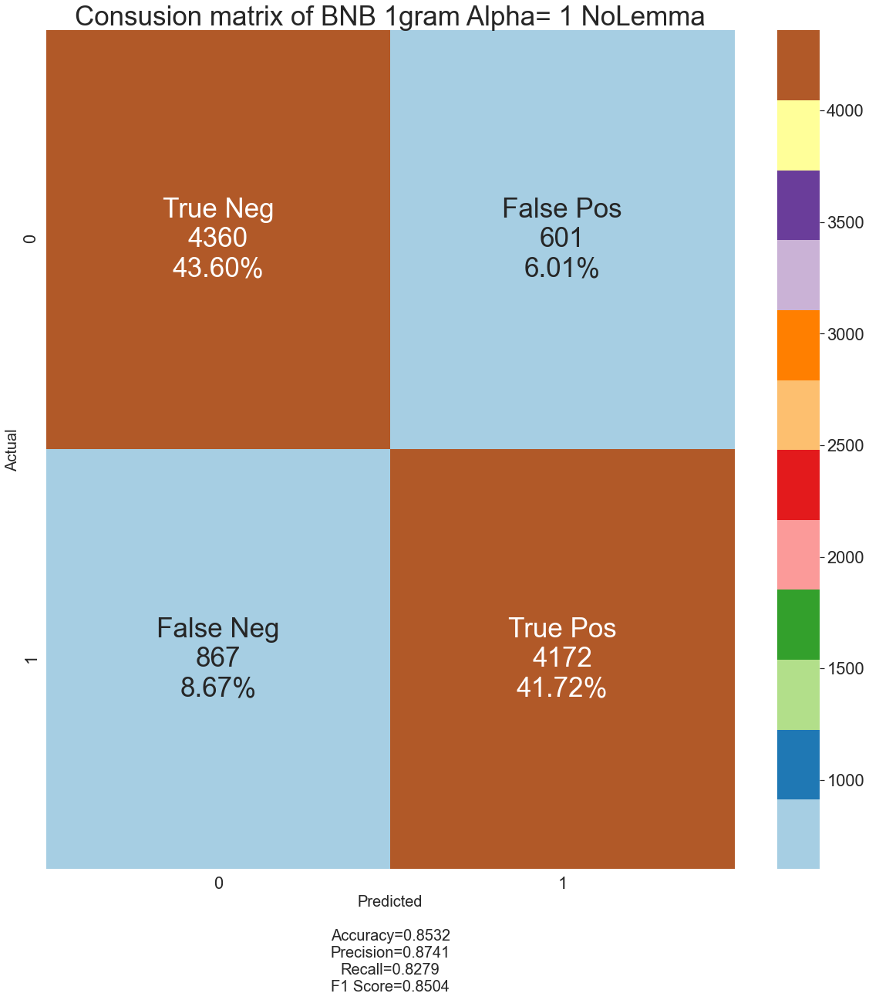

In [588]:
clfrMeasure().confusion_matrix(y_test, testing, "1gram", "BNB", alpha = 1)

## Optimization and Tuning

### * Without Lemma

*  Tuning `Alpha` and `ngrams`

In [8]:
# list of alpha
alpha_base = 0.00001
alphas = []
for i in range(10):
    alphas.append(alpha_base)
    alpha_base *= 10

method = ["accuracy", "precision", "recall", "f1"]
ngrams = [1,2,3]
algorithm = ["MNB", "CNB", "BNB"]


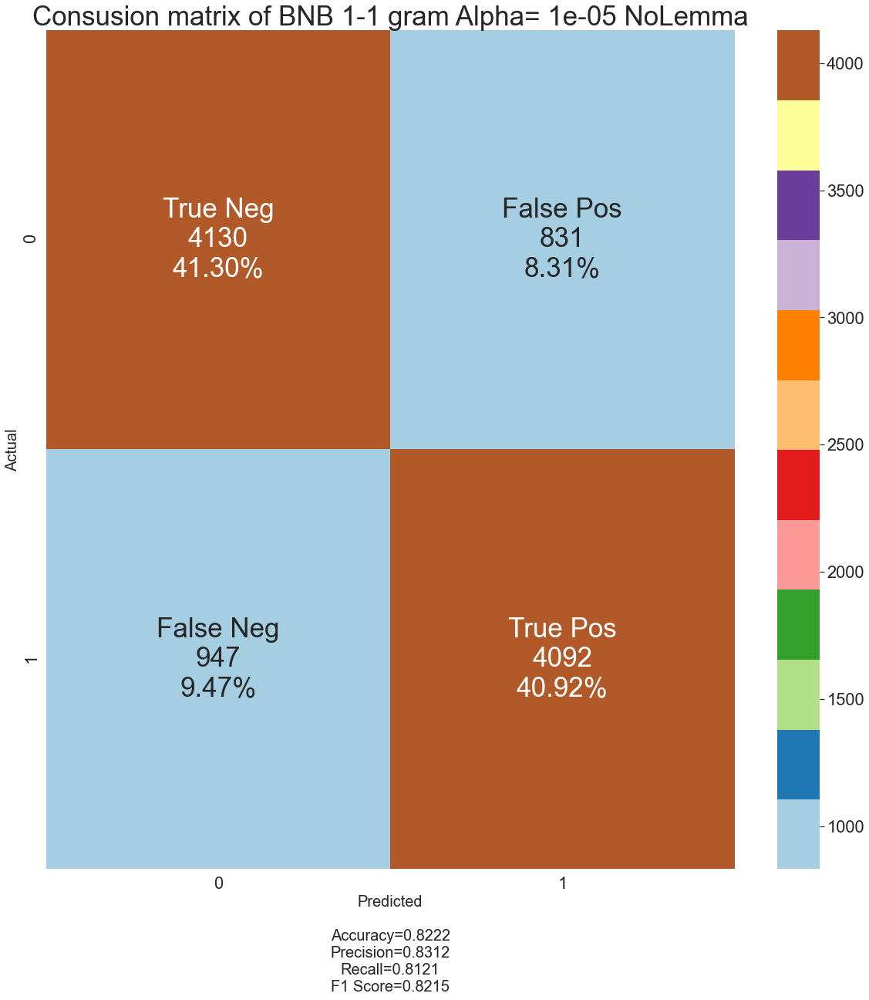

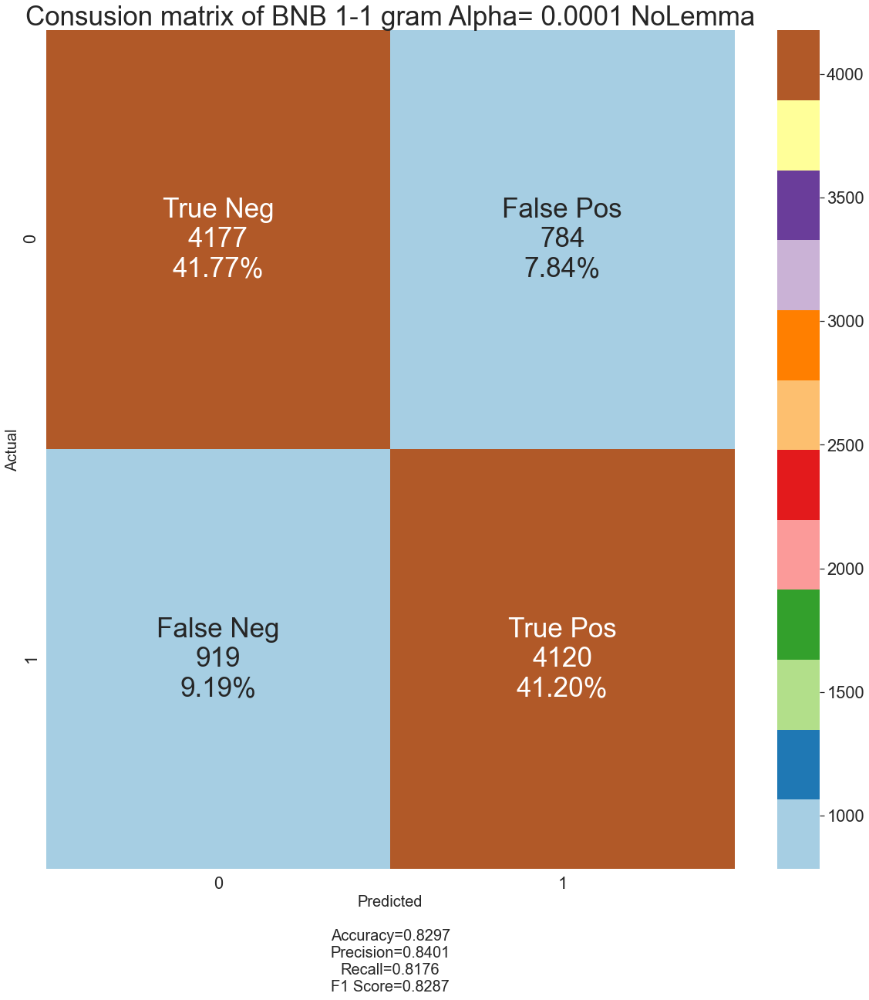

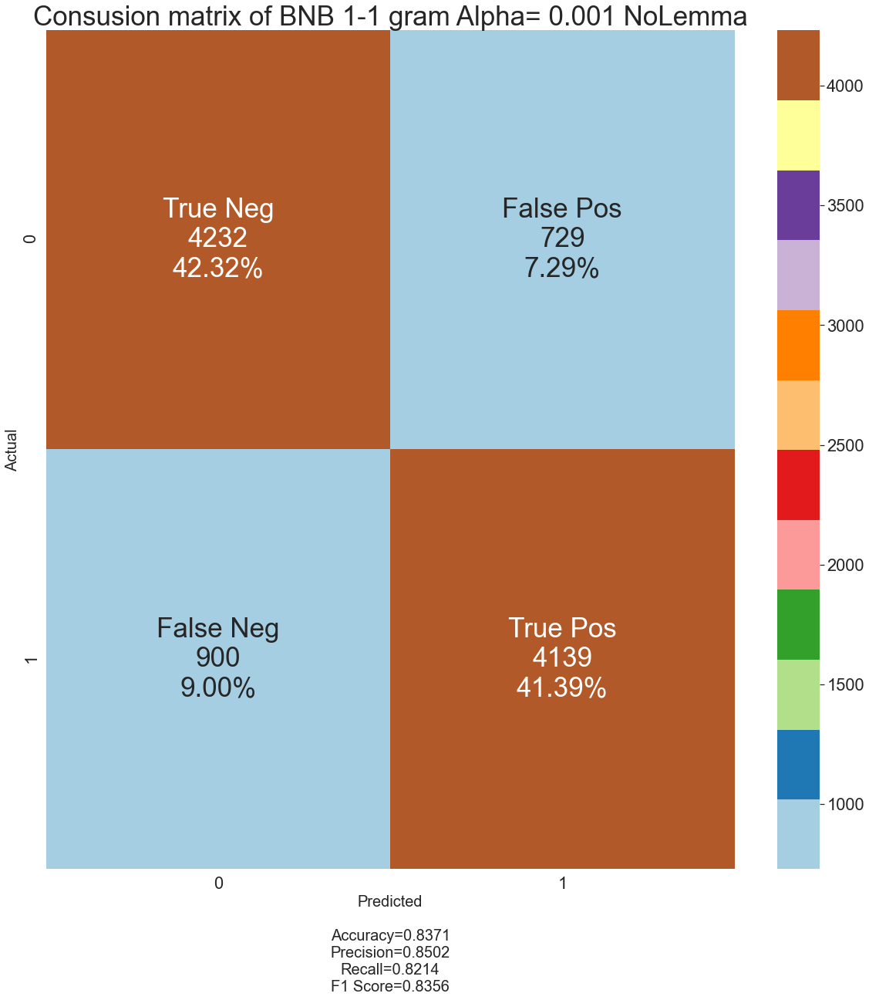

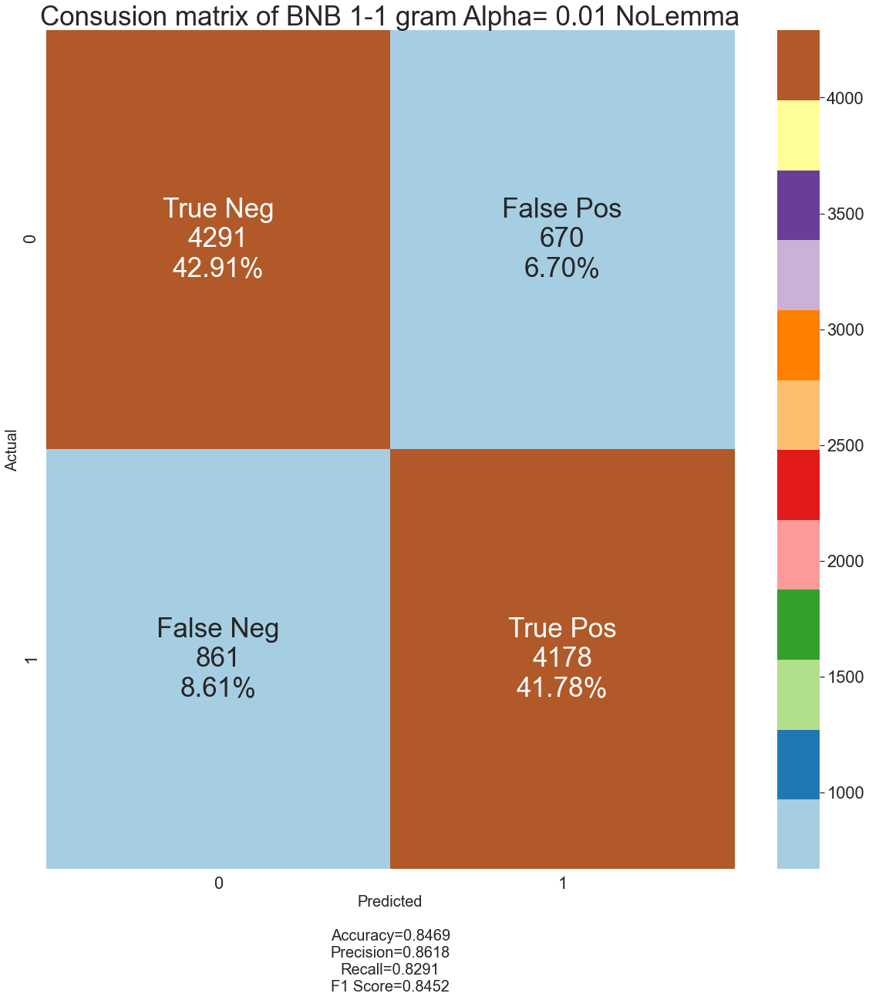

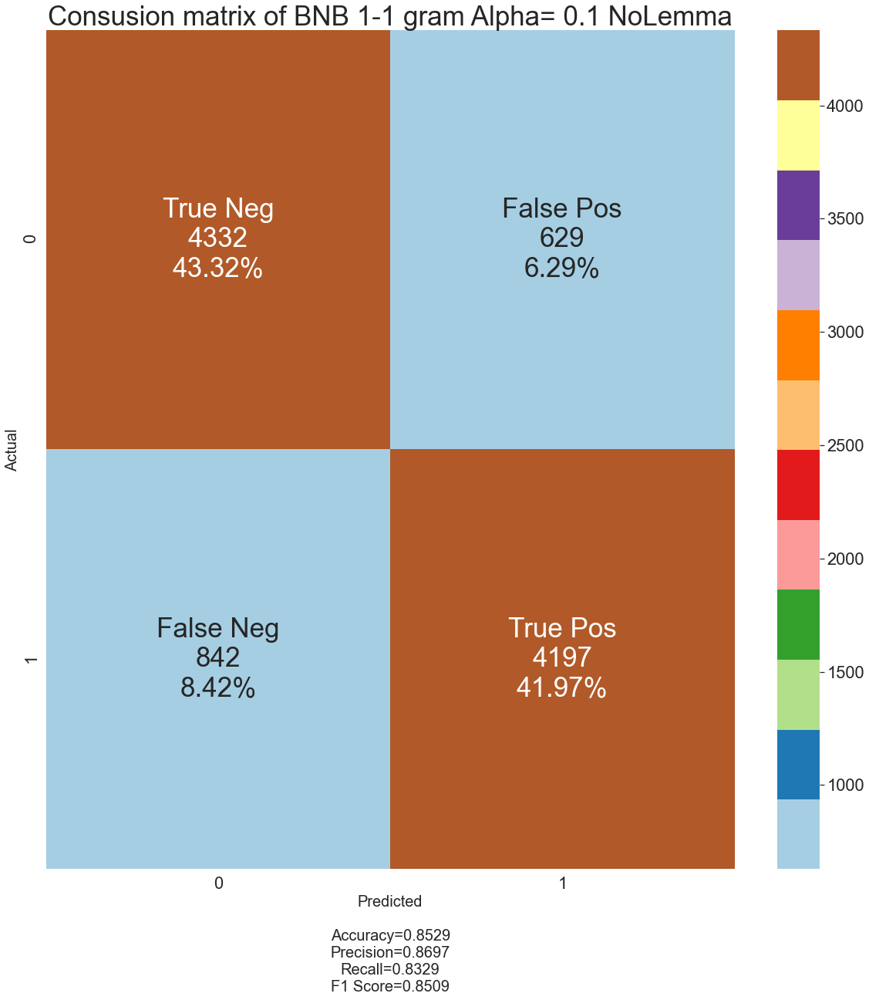

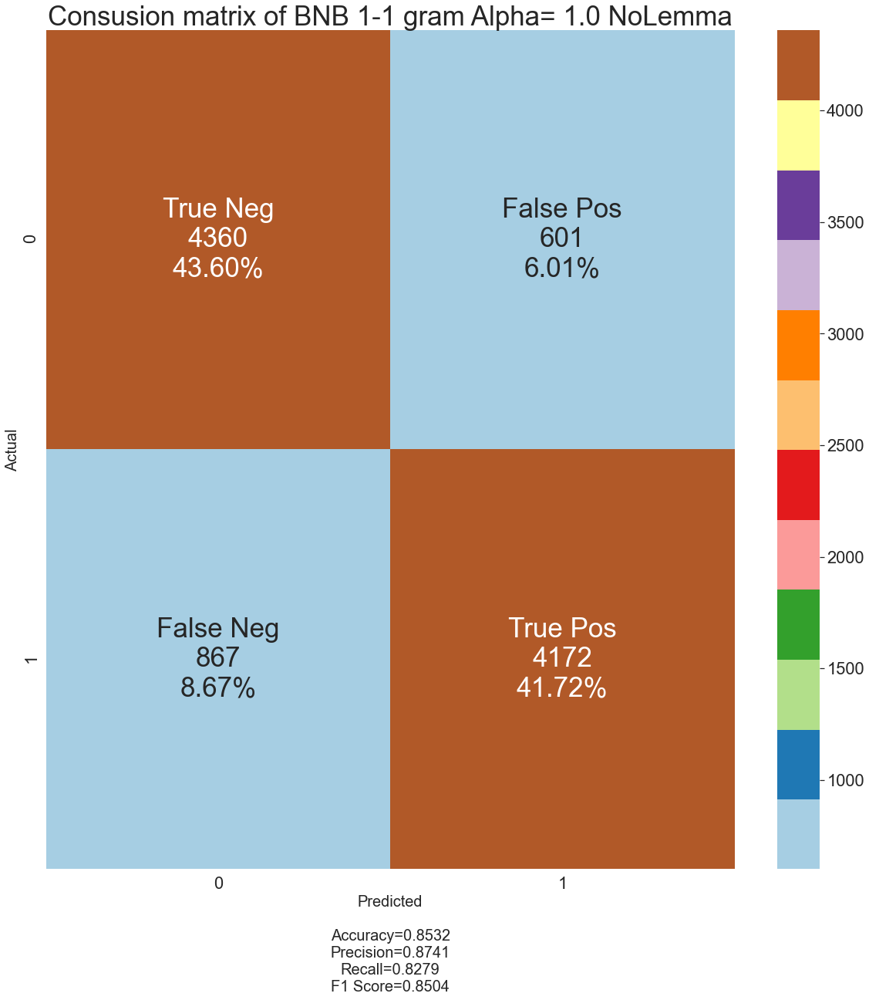

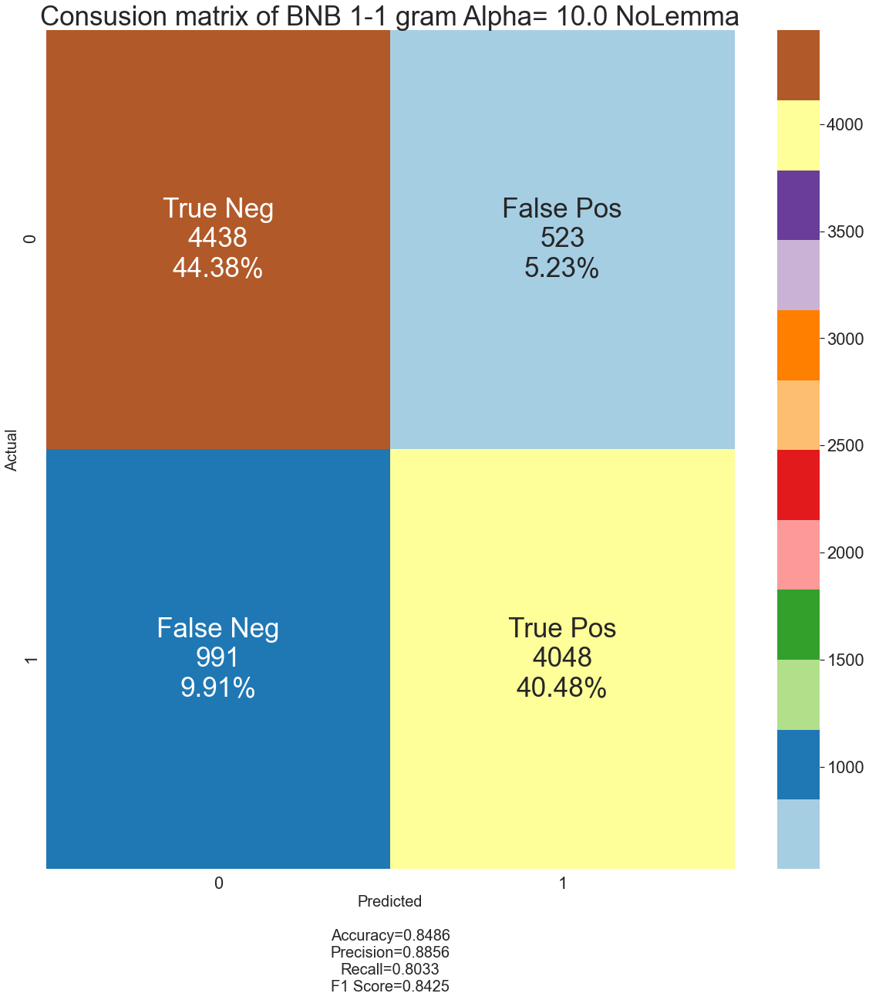

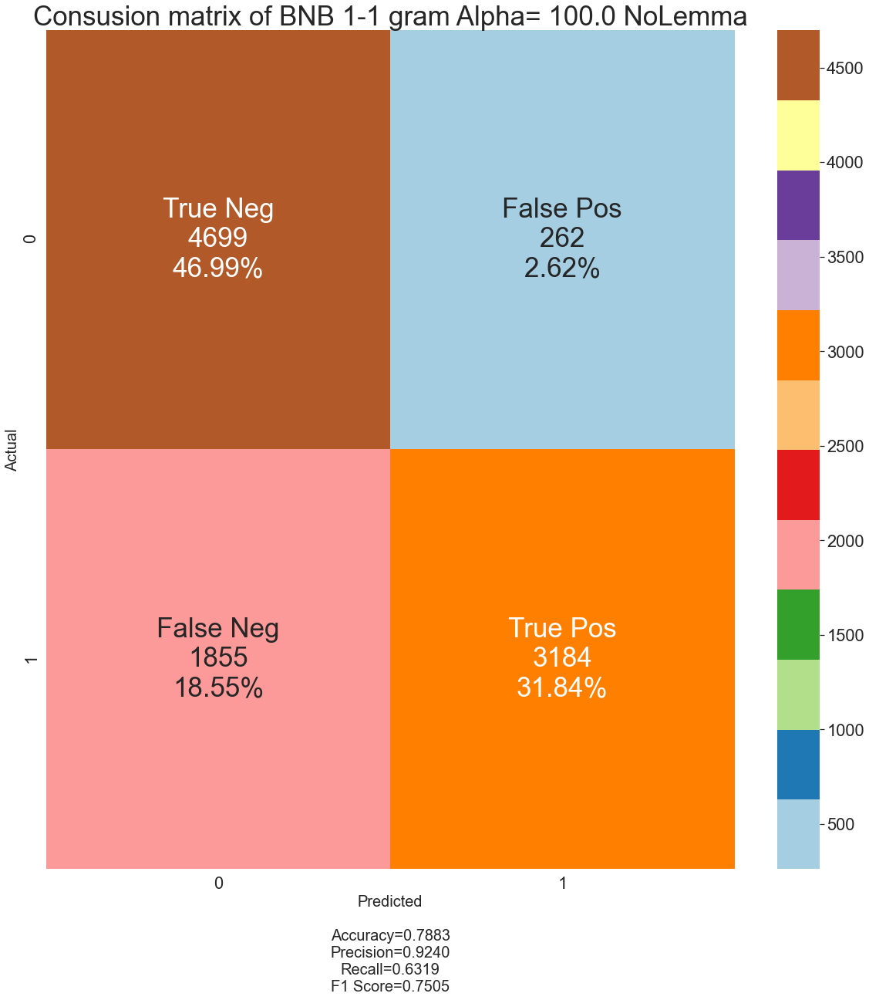

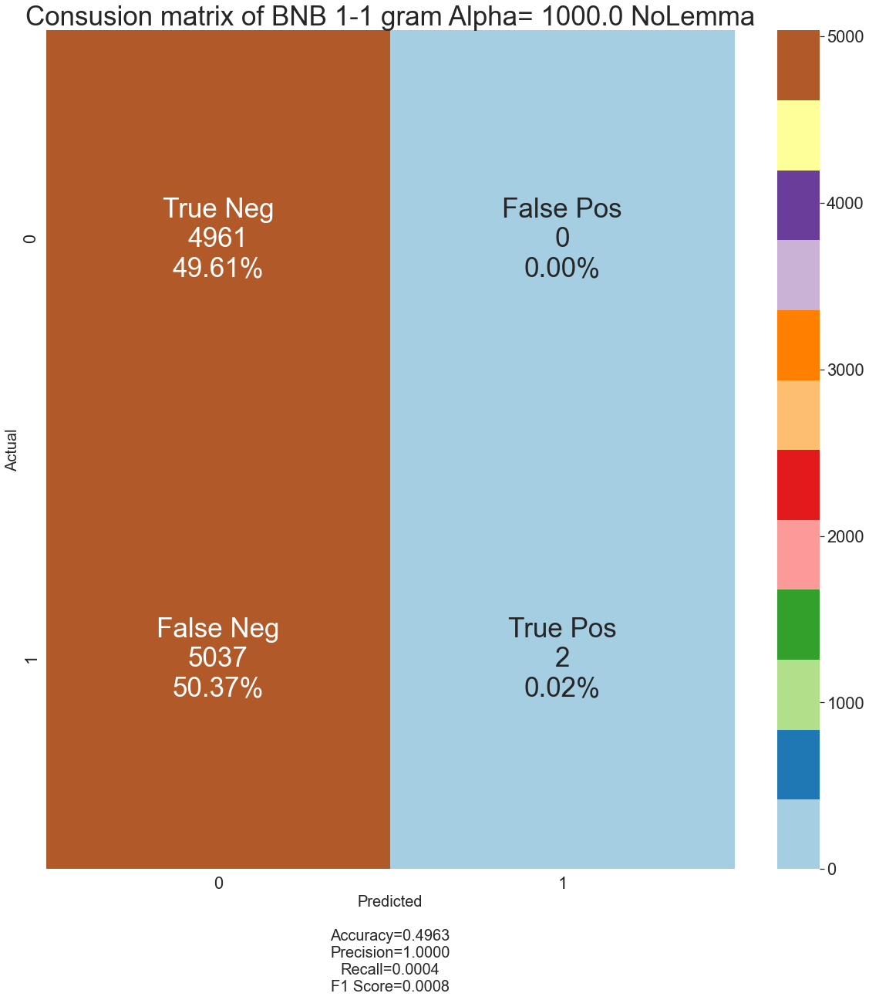

h:\projects\environment\tensorflow2.4\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-539-bc7732bd5ec7>:63: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP+FP)


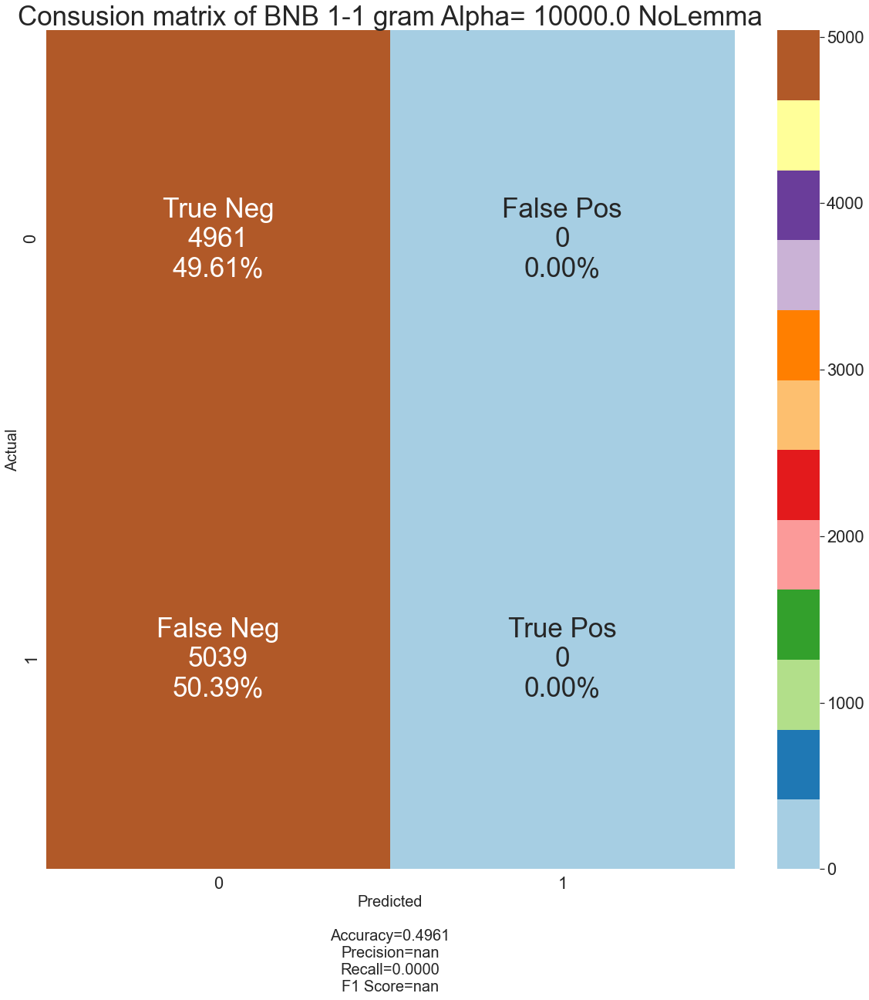

******************************
Finish BNB 1-1 grams


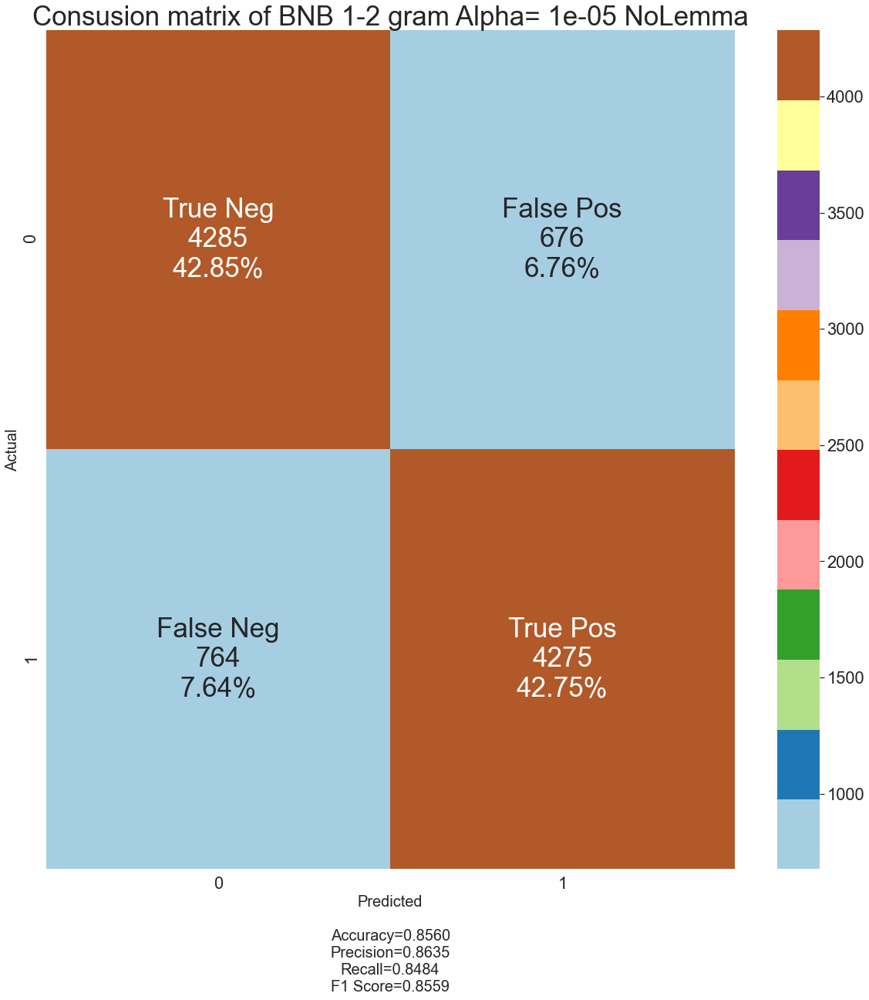

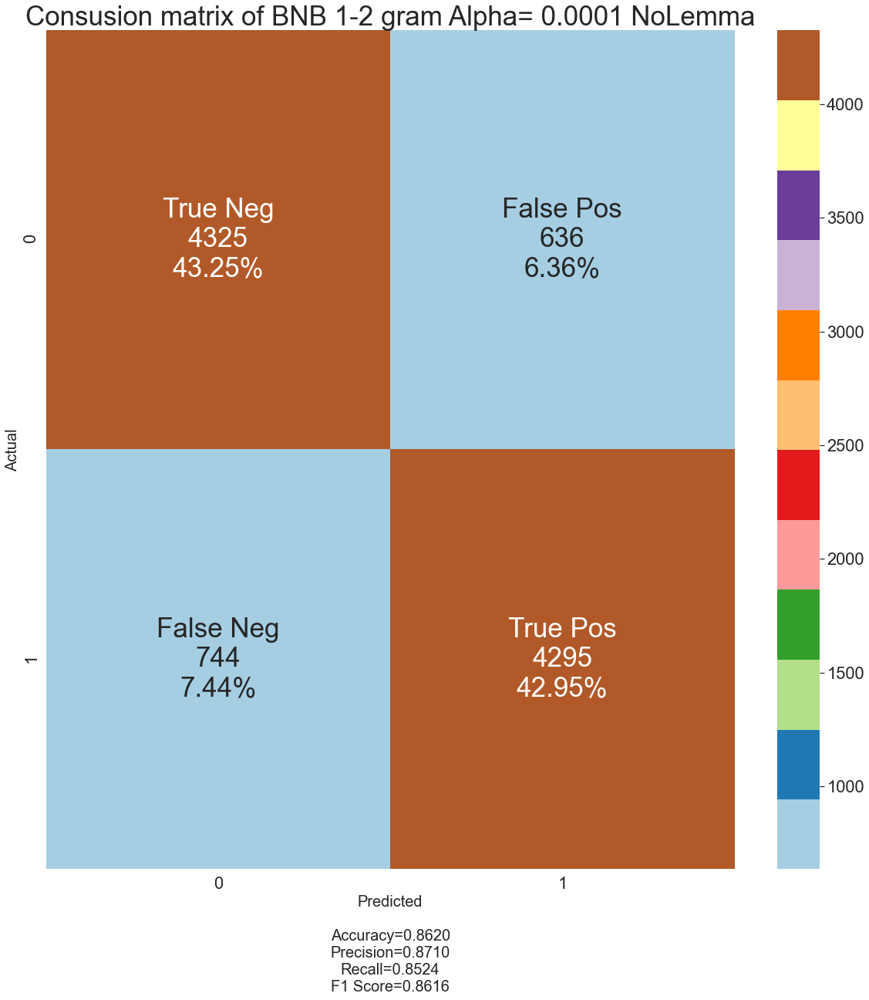

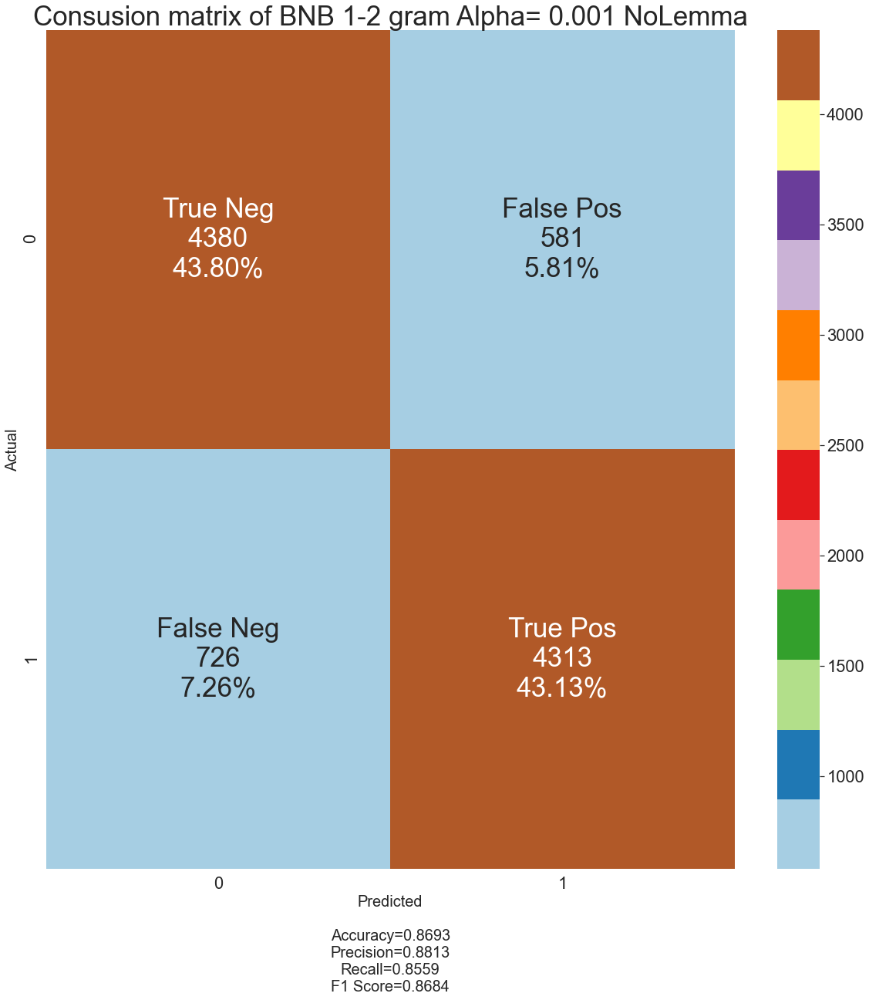

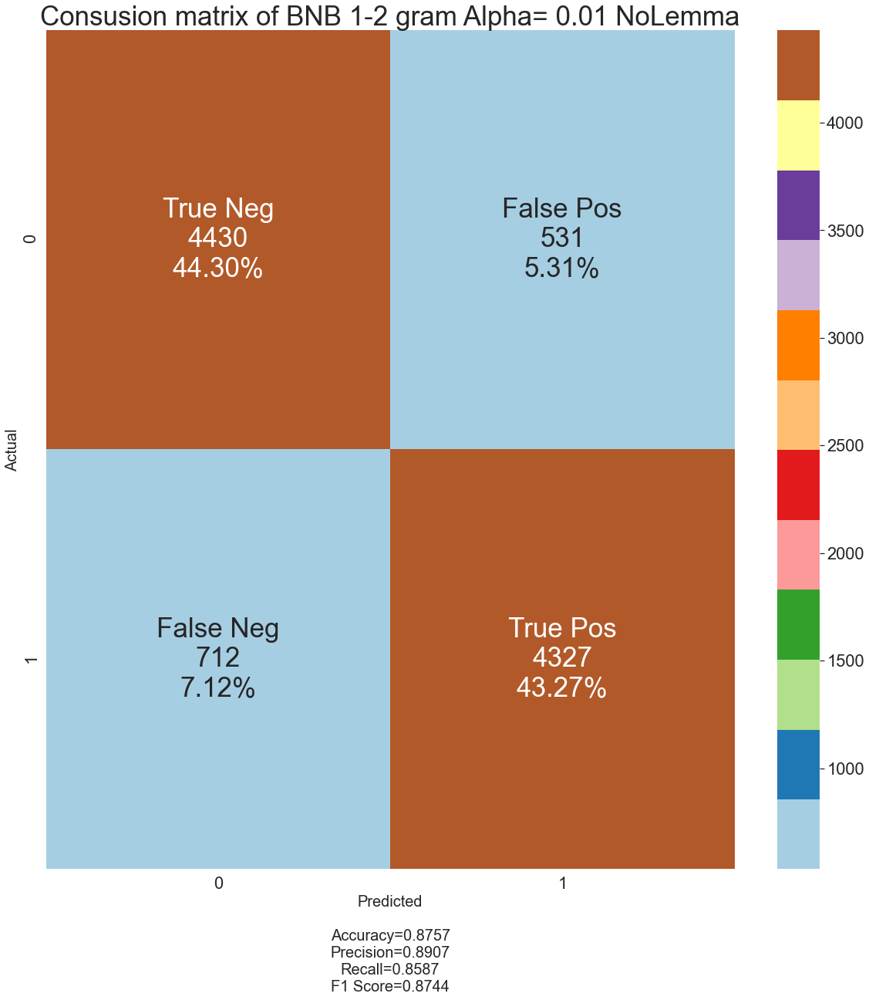

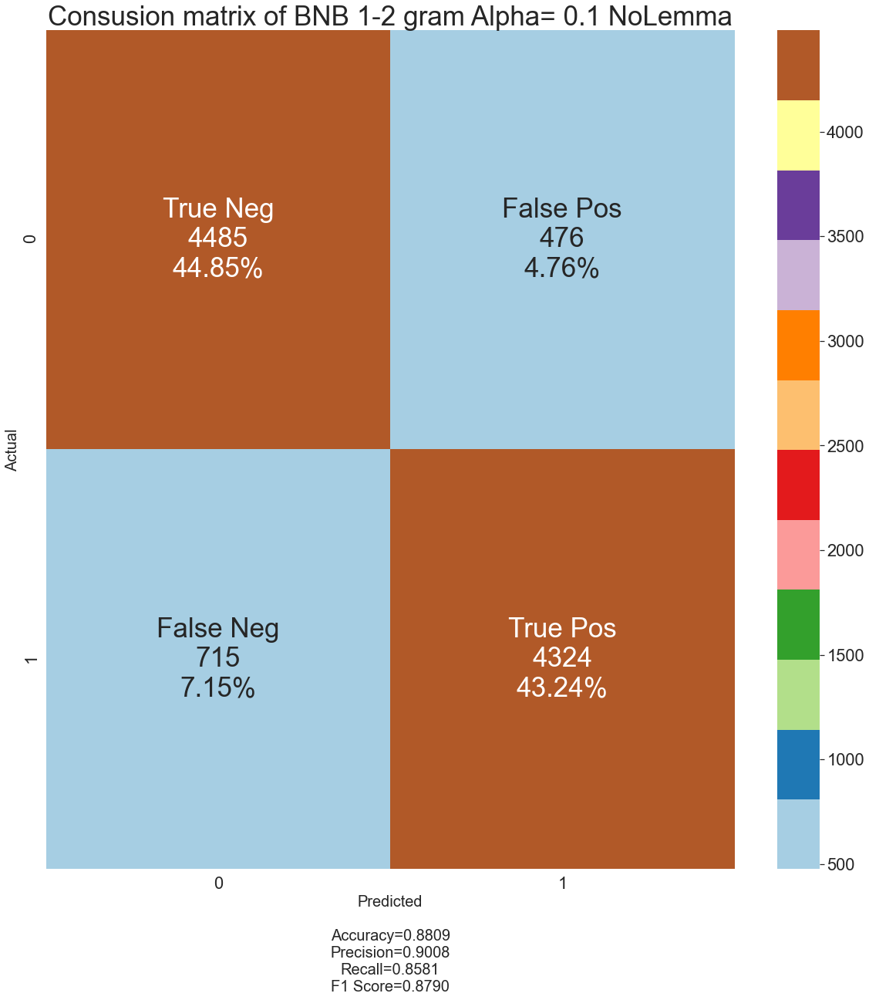

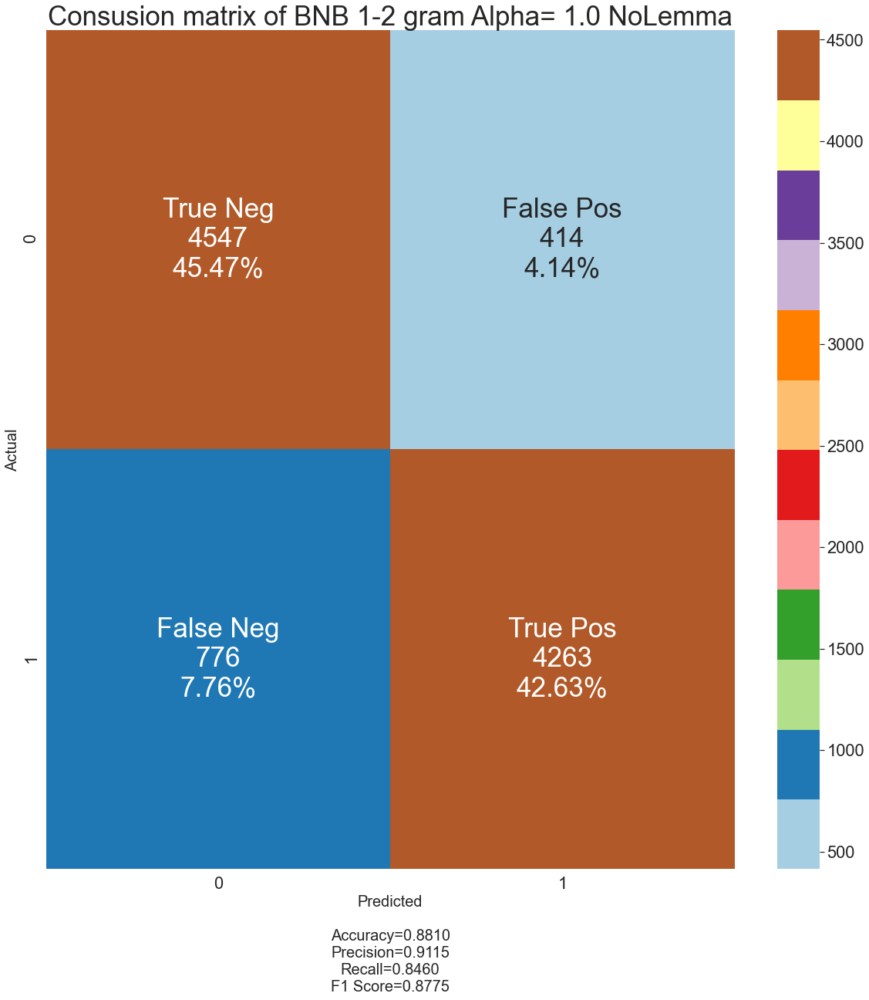

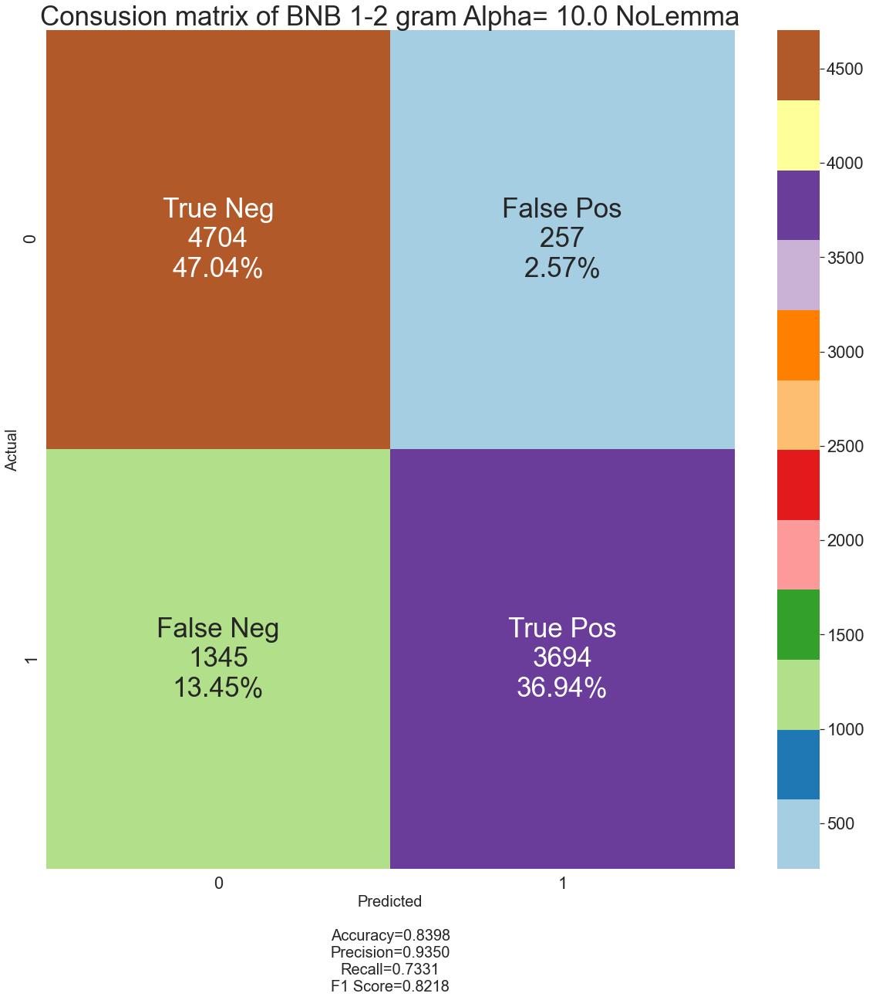

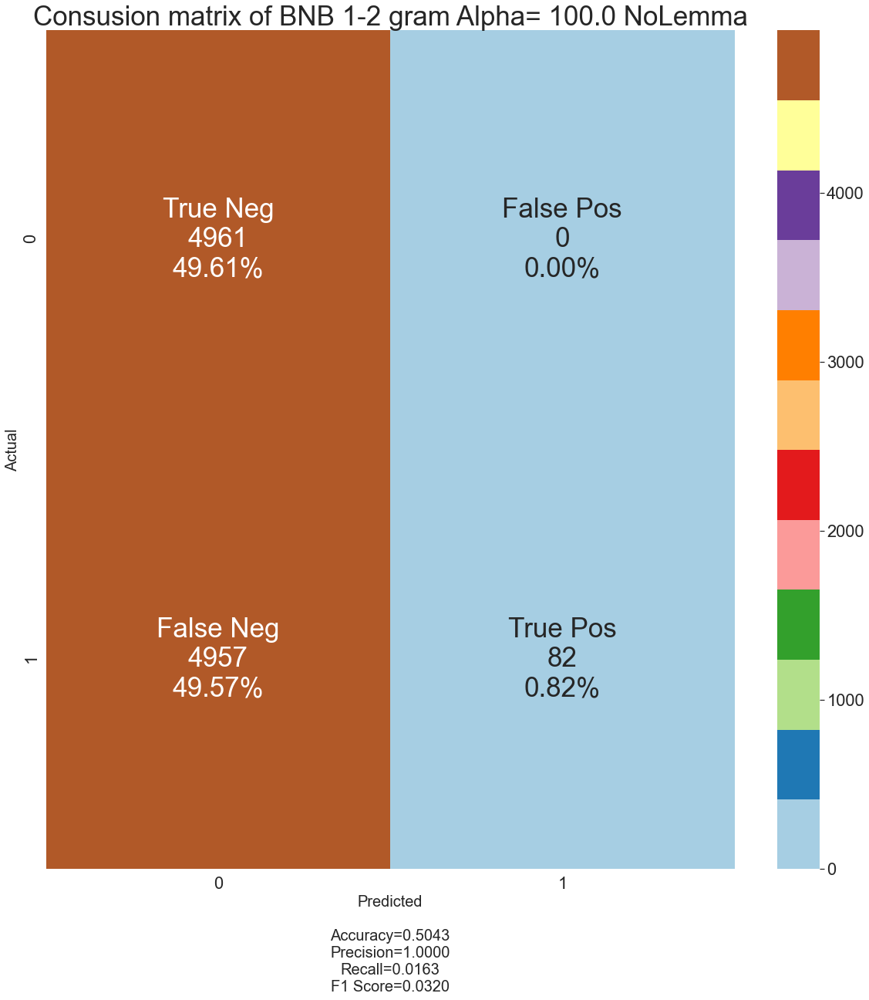

h:\projects\environment\tensorflow2.4\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-539-bc7732bd5ec7>:63: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP+FP)


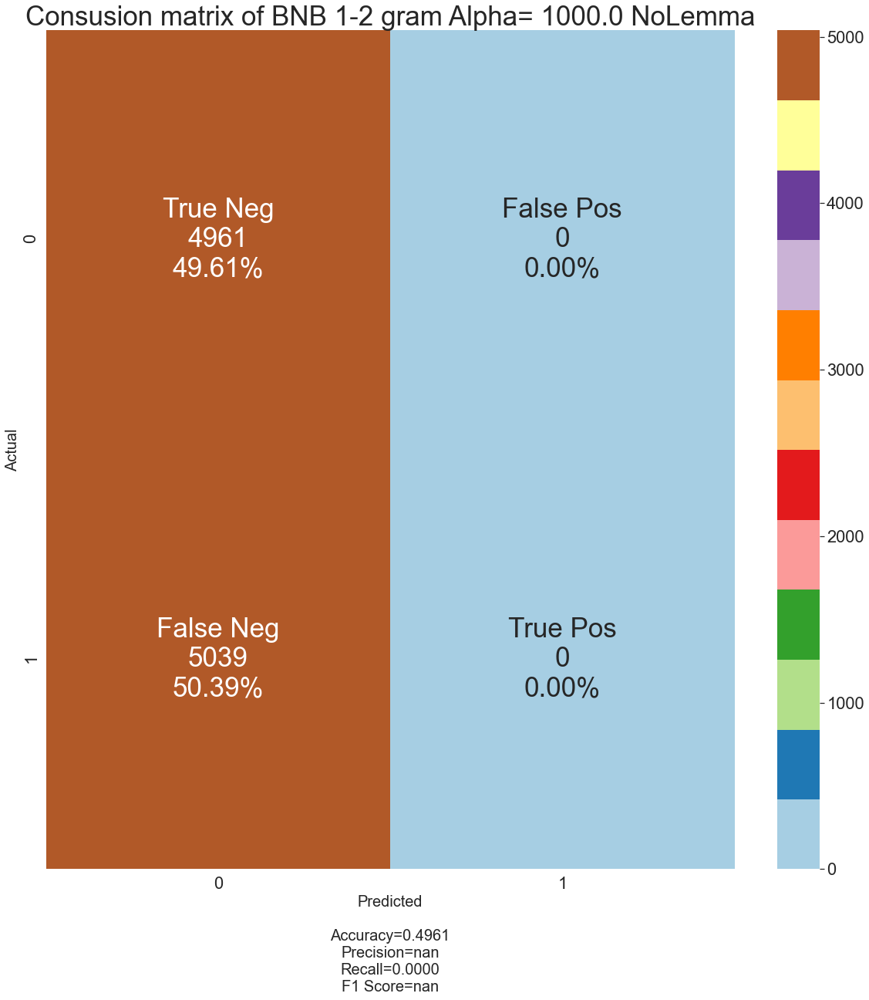

h:\projects\environment\tensorflow2.4\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-539-bc7732bd5ec7>:63: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP+FP)


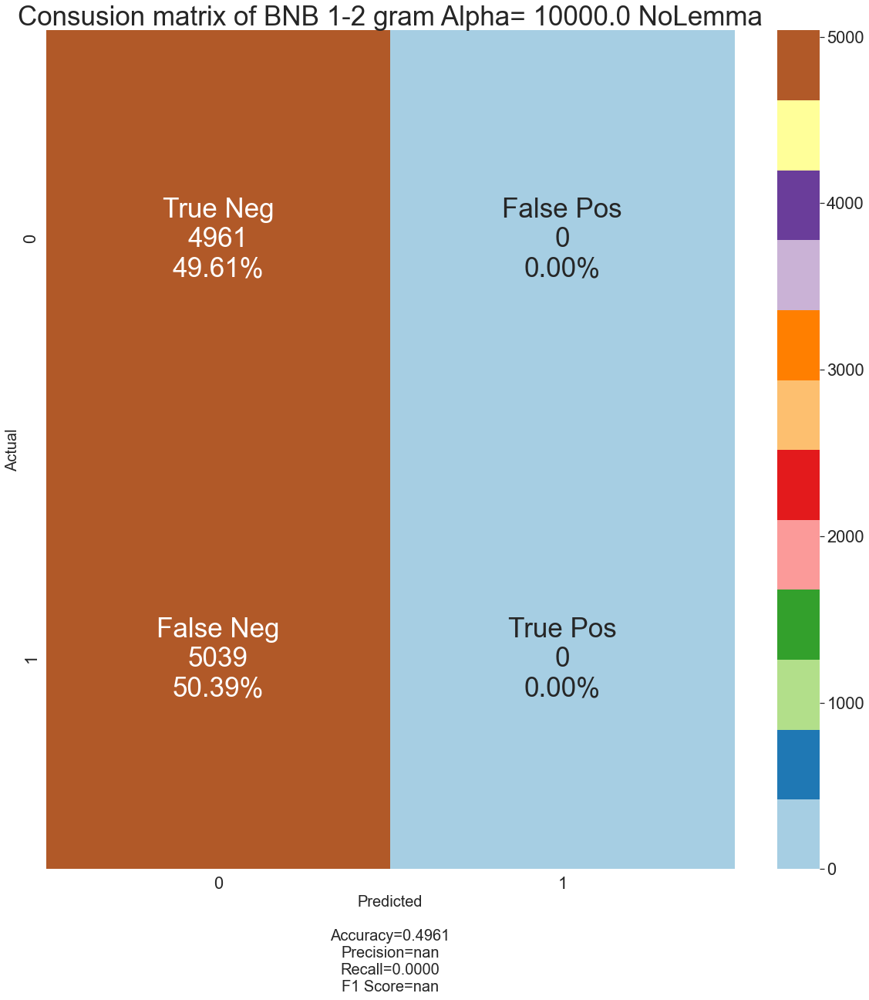

******************************
Finish BNB 1-2 grams


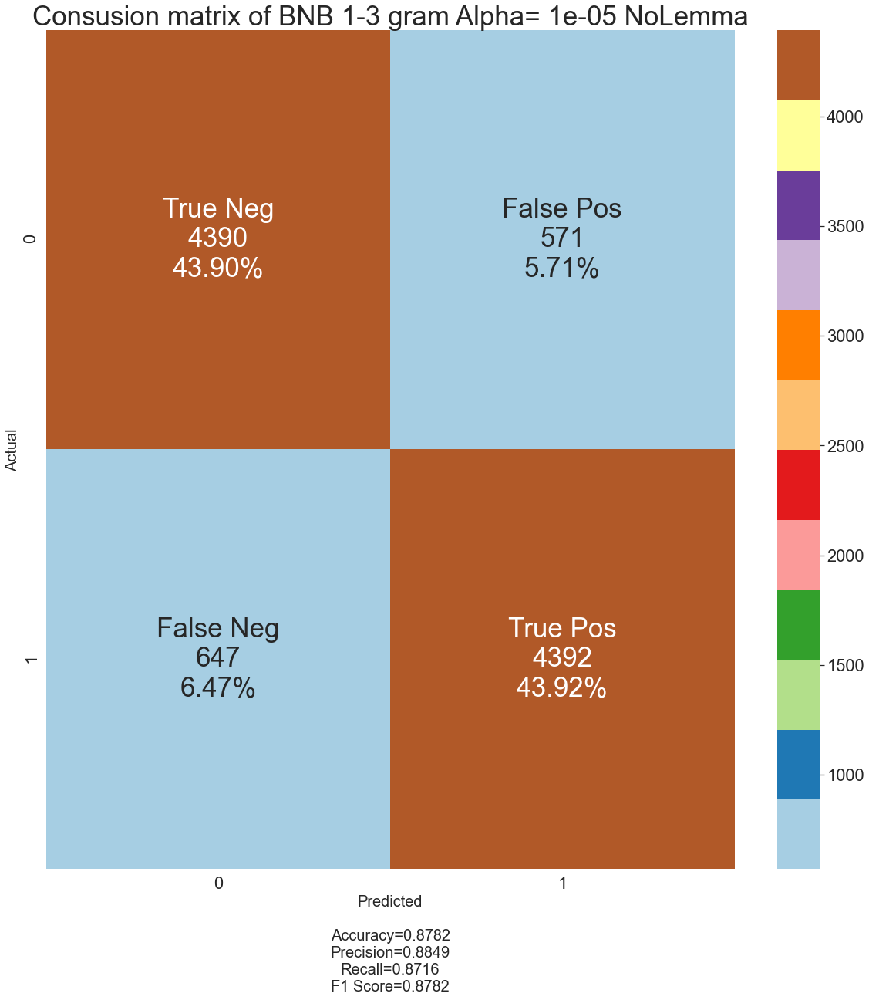

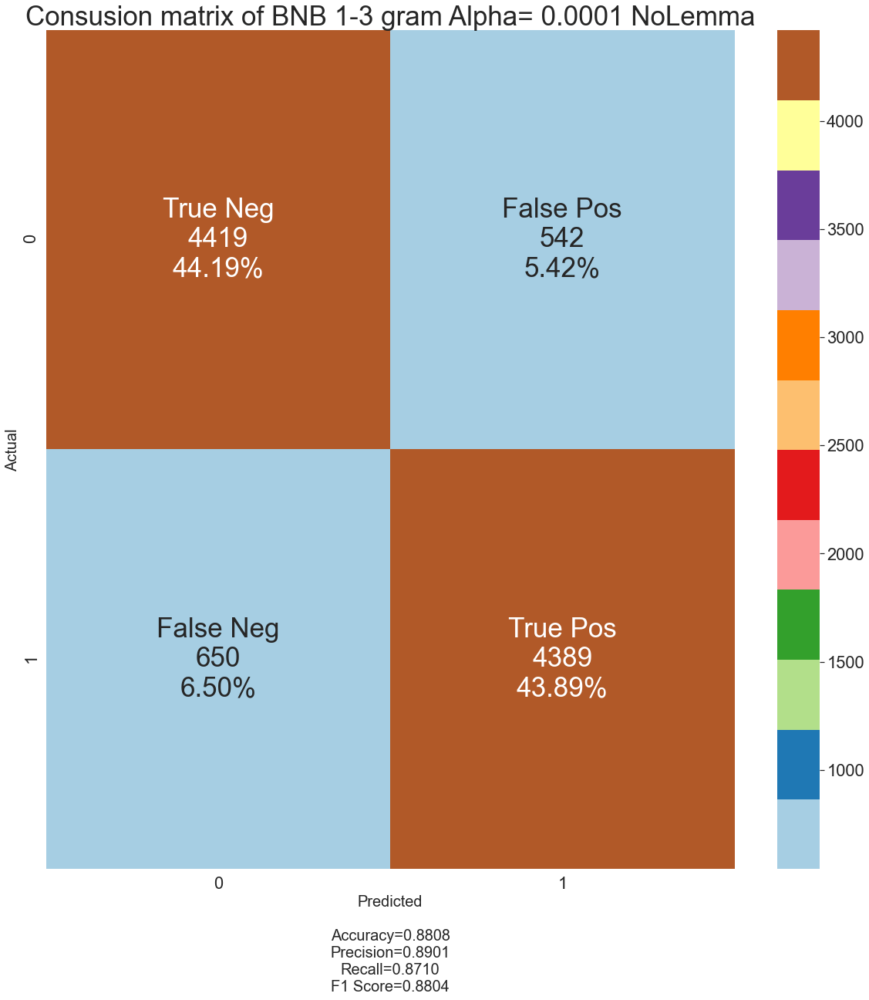

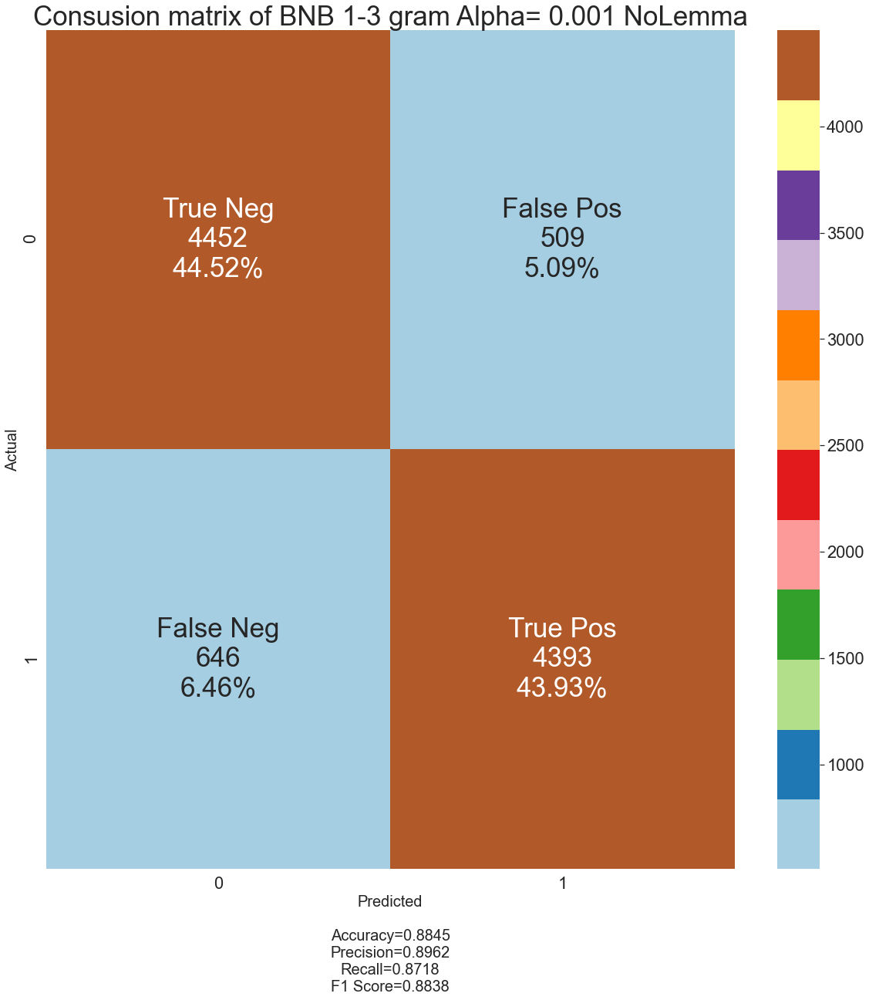

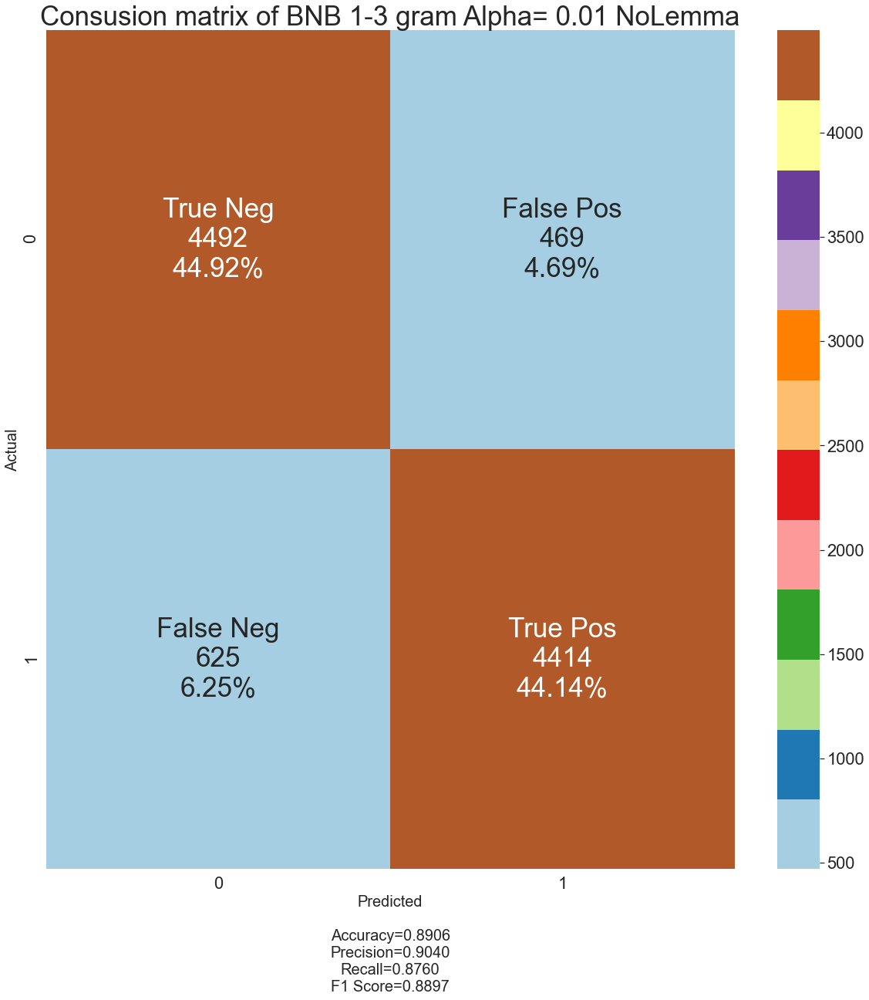

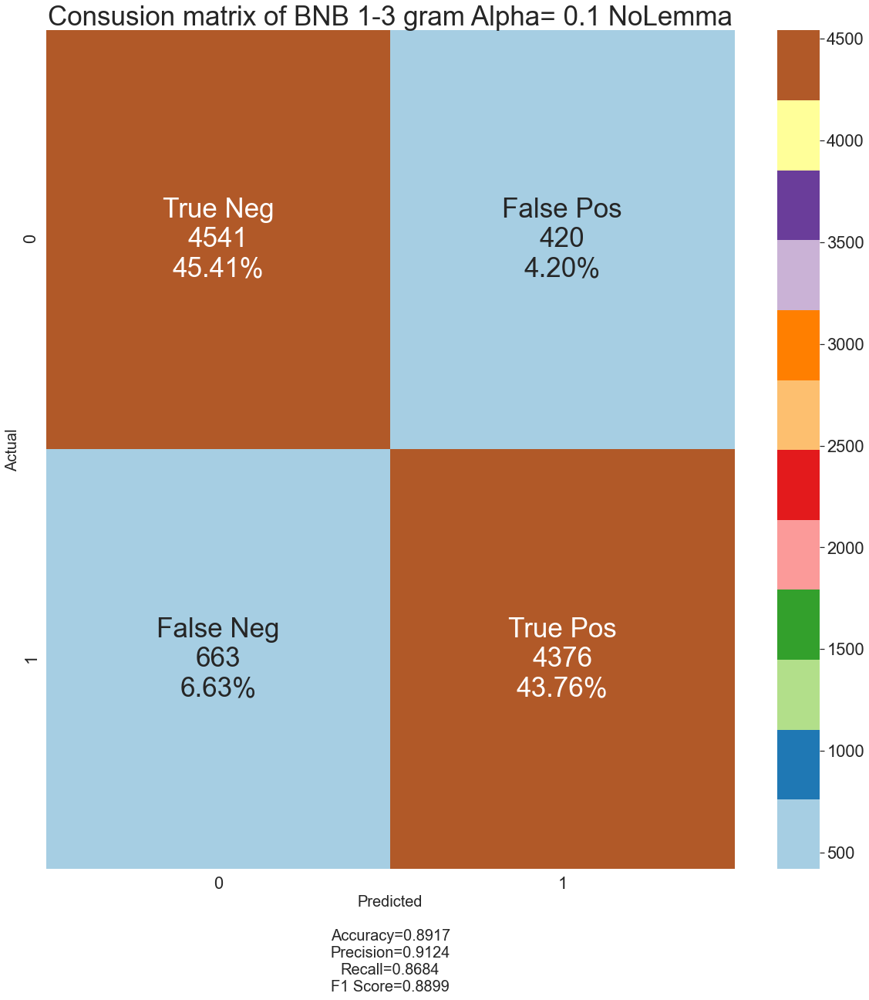

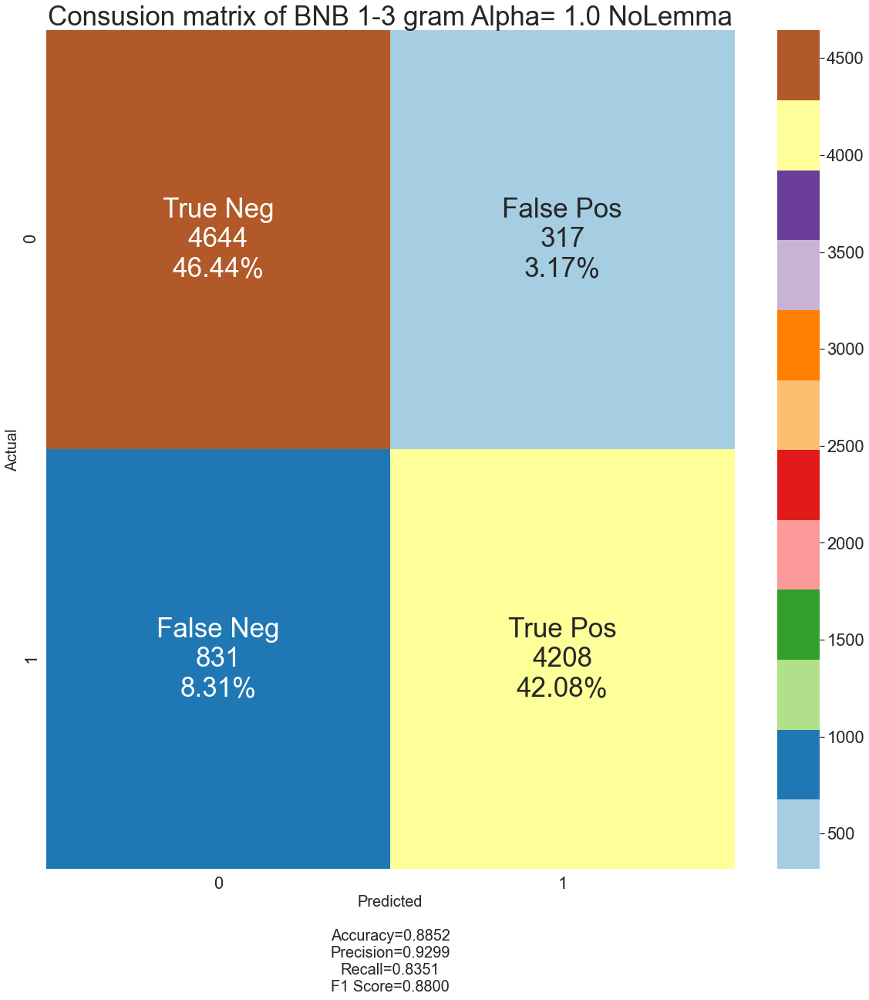

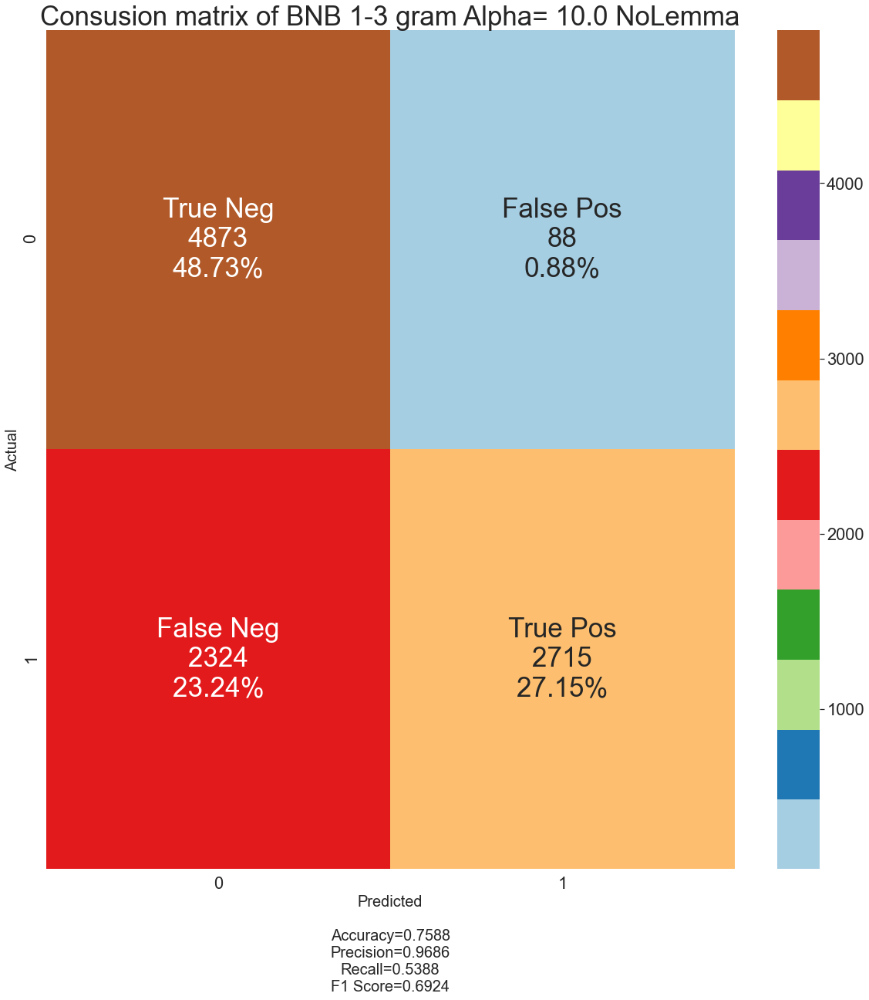

h:\projects\environment\tensorflow2.4\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-539-bc7732bd5ec7>:63: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP+FP)


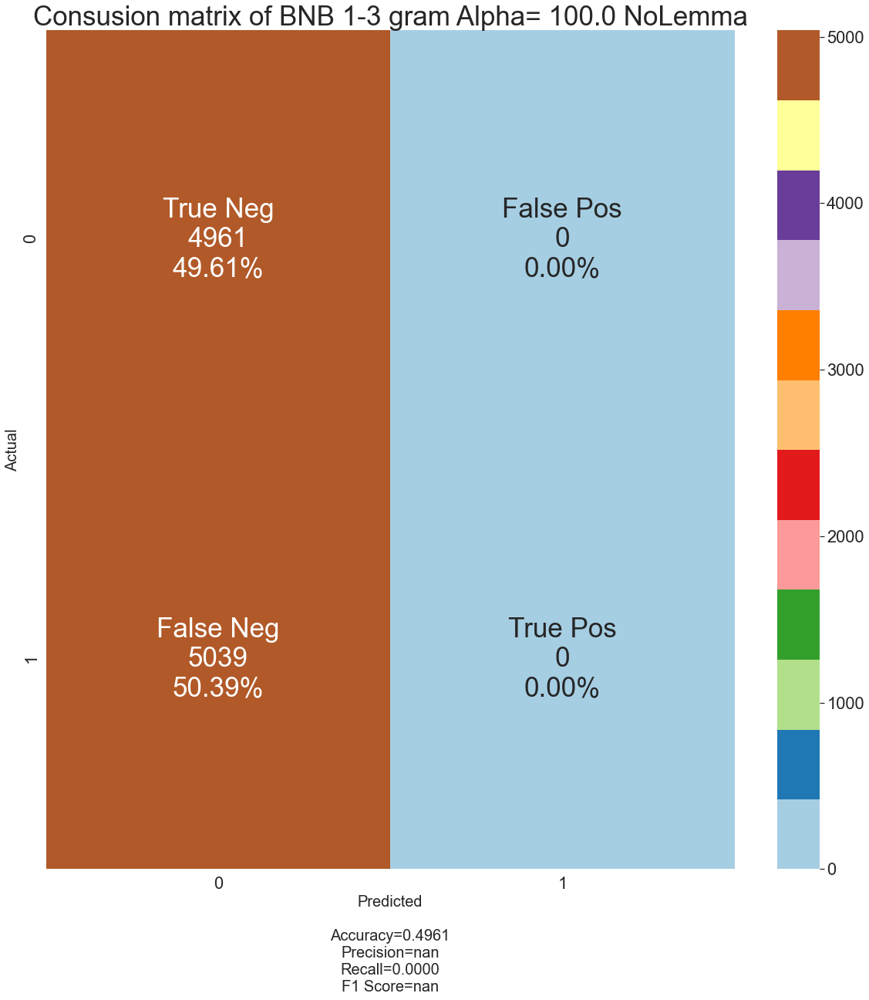

h:\projects\environment\tensorflow2.4\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-539-bc7732bd5ec7>:63: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP+FP)


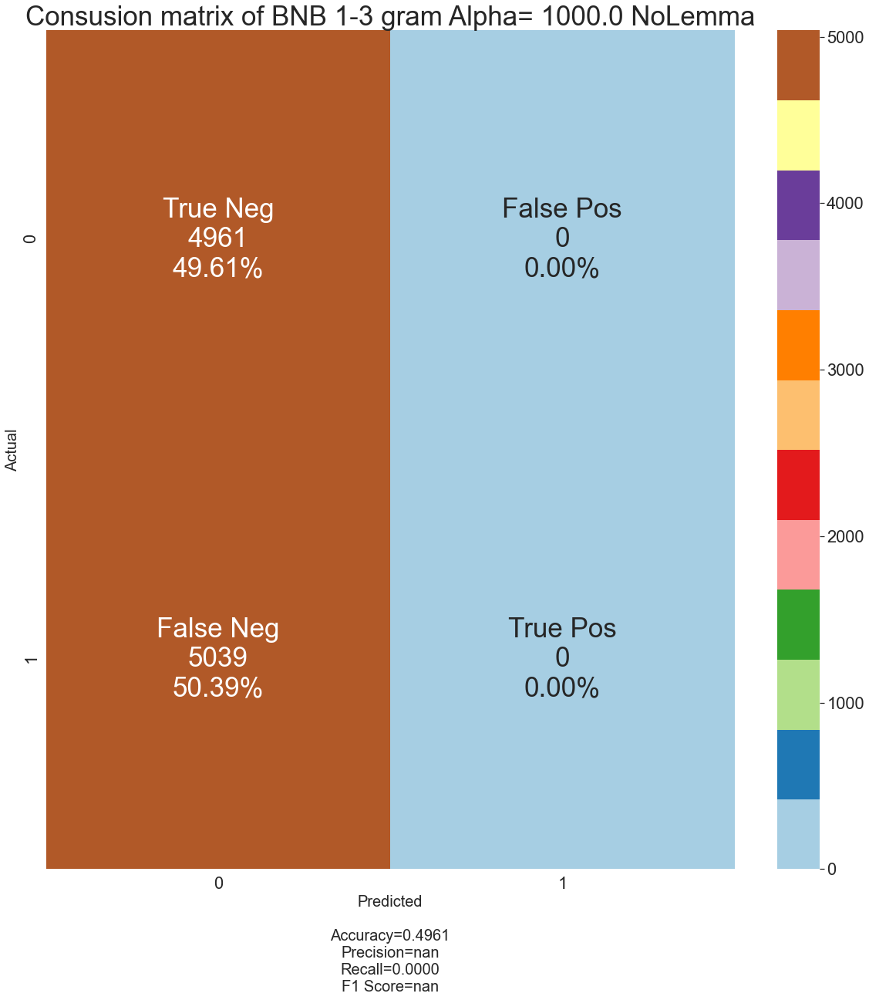

h:\projects\environment\tensorflow2.4\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-539-bc7732bd5ec7>:63: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP+FP)


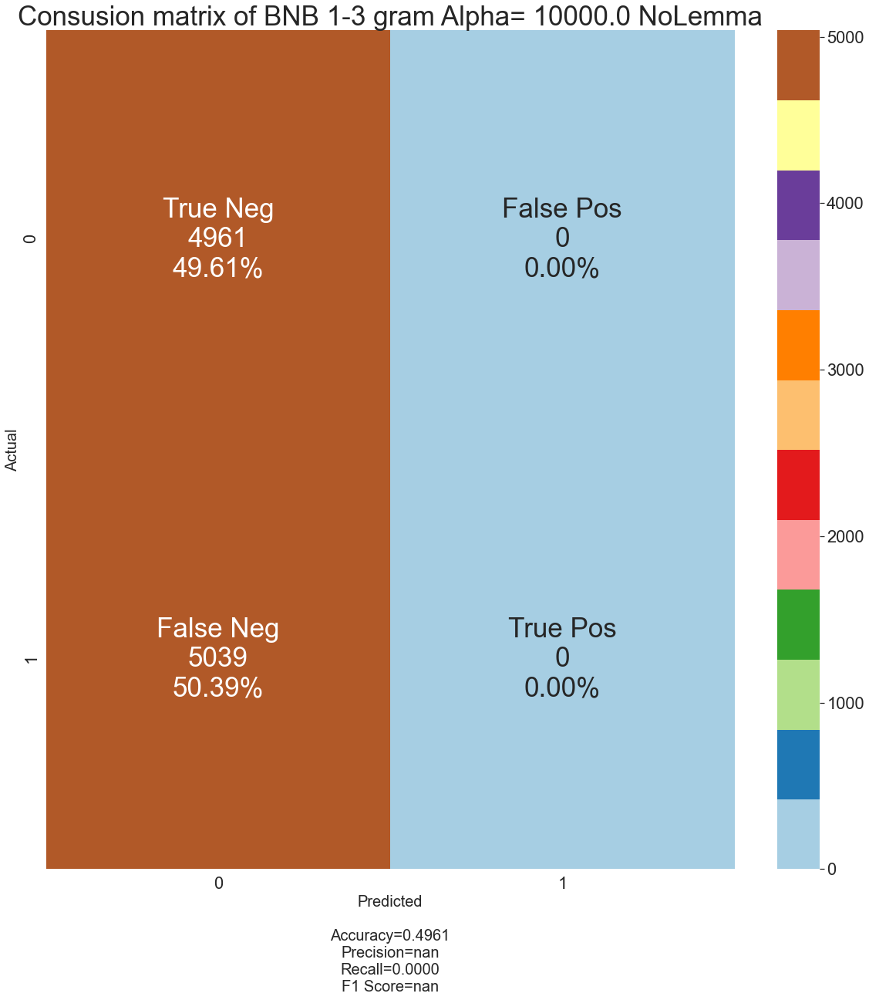

******************************
Finish BNB 1-3 grams


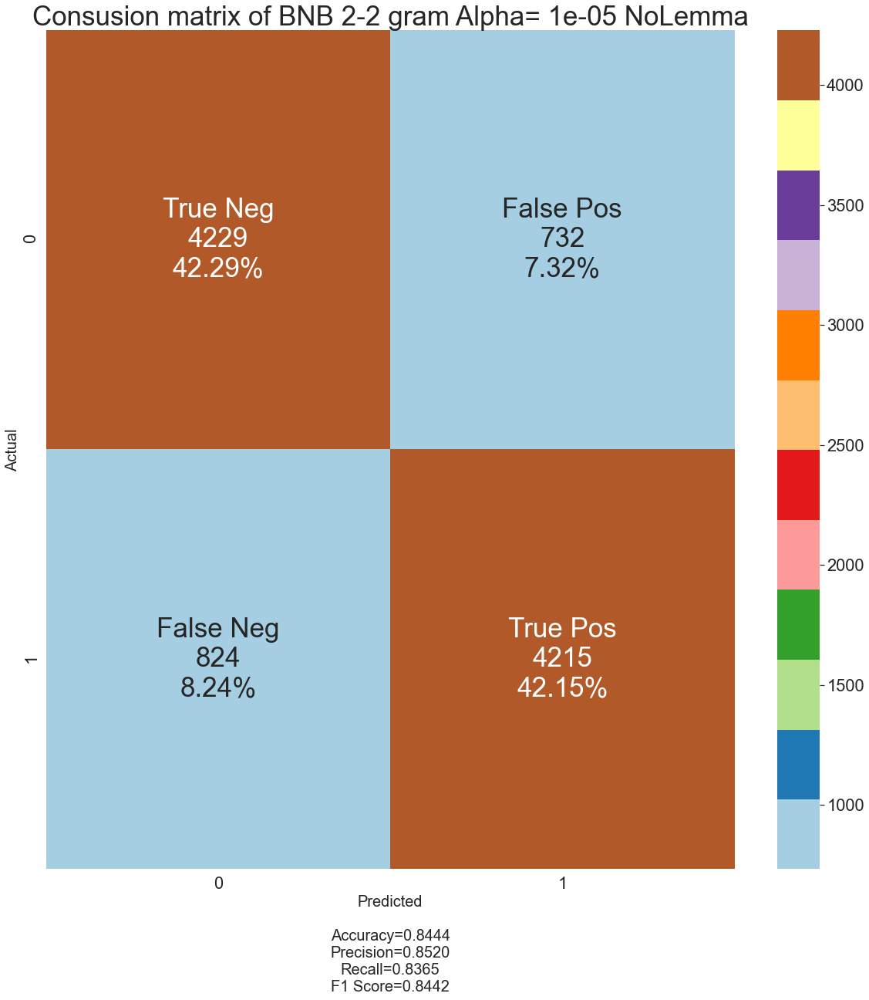

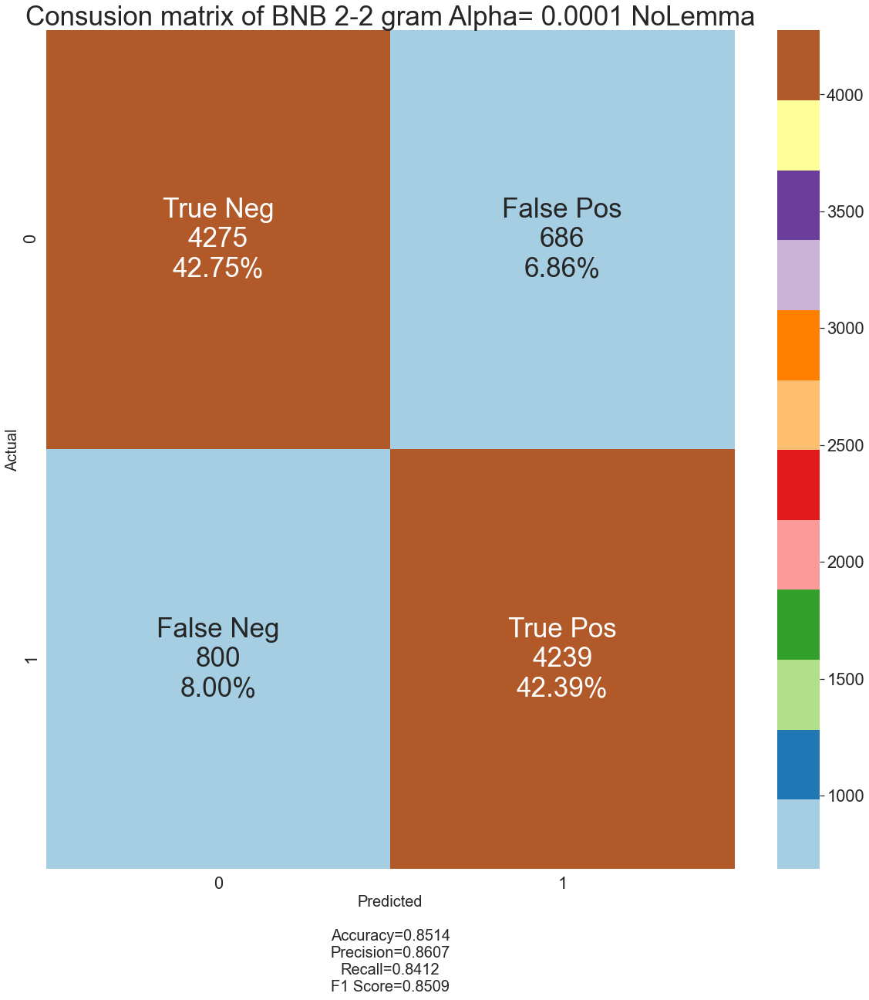

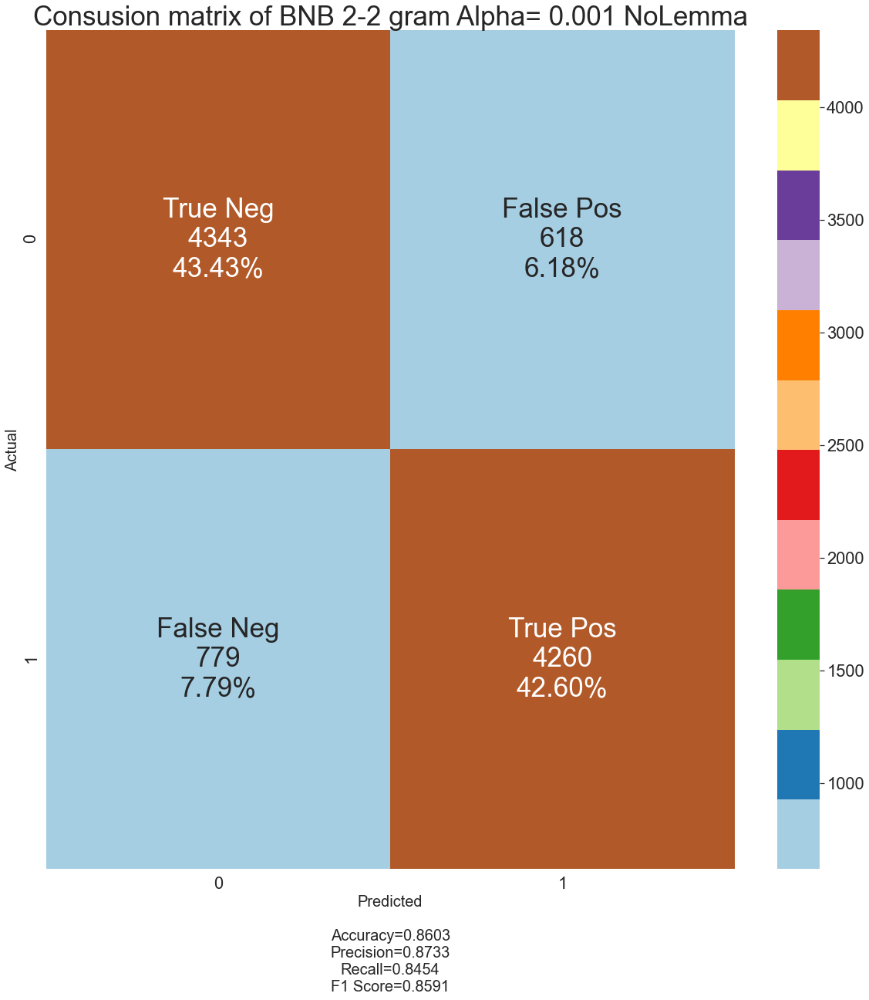

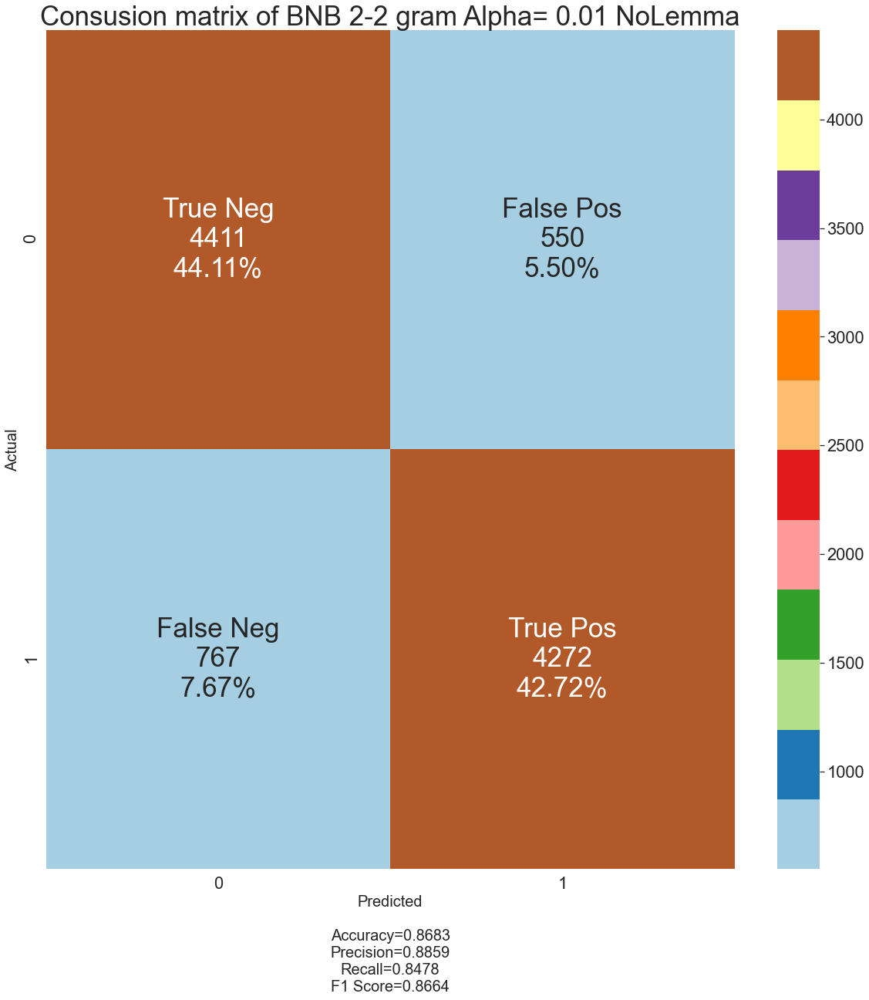

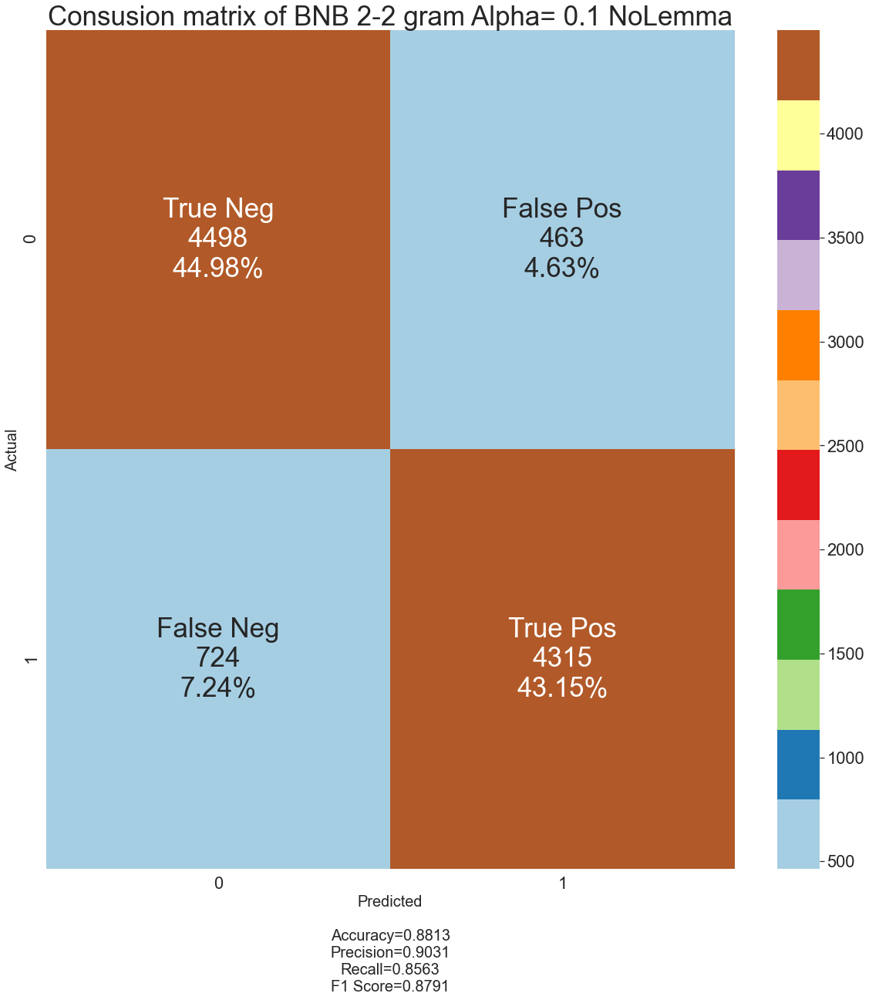

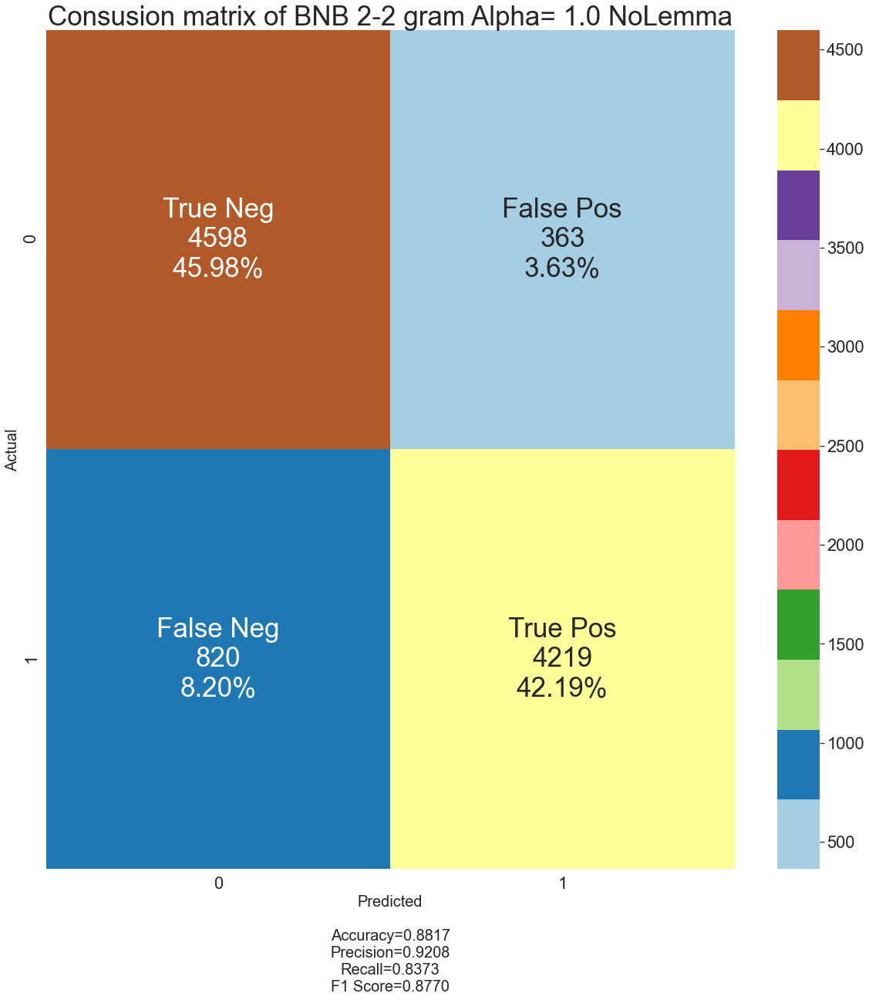

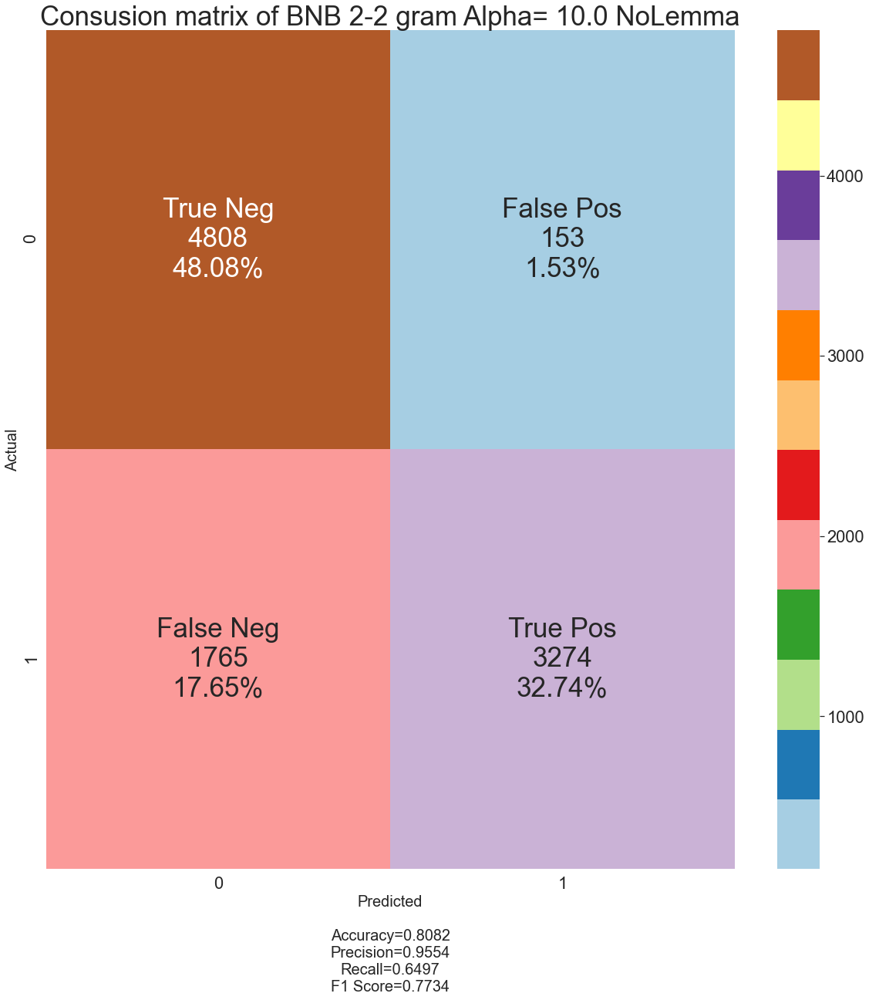

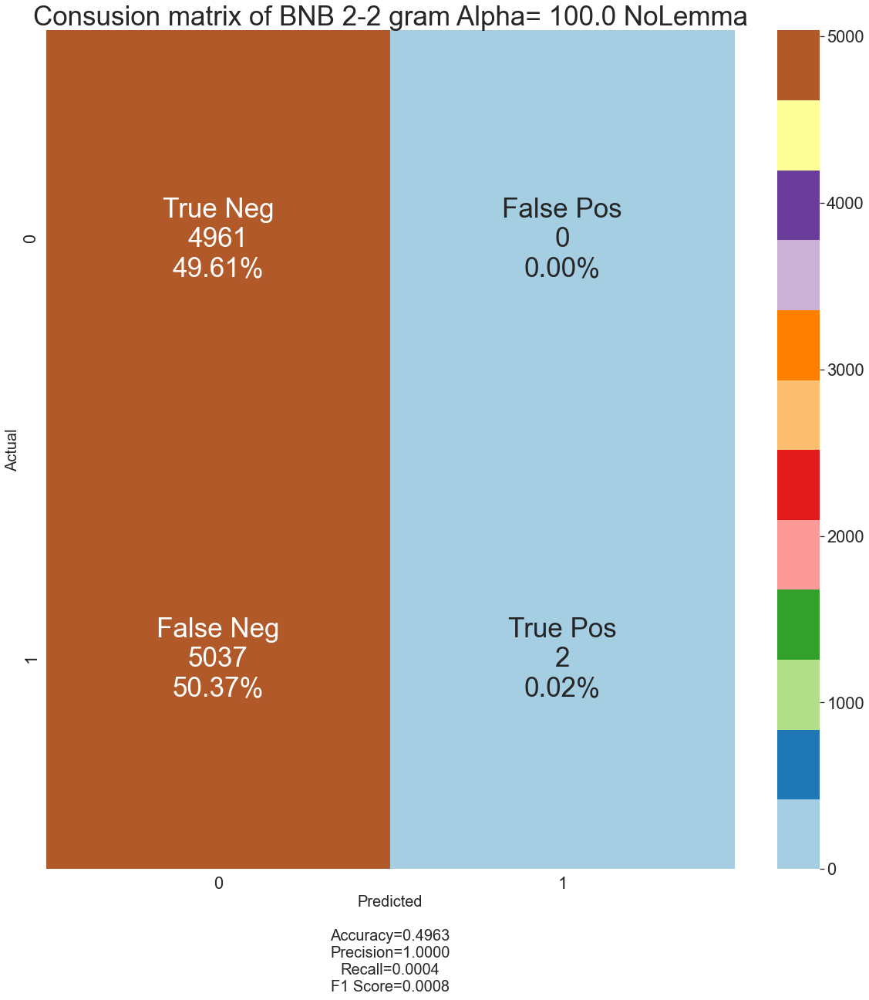

h:\projects\environment\tensorflow2.4\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-539-bc7732bd5ec7>:63: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP+FP)


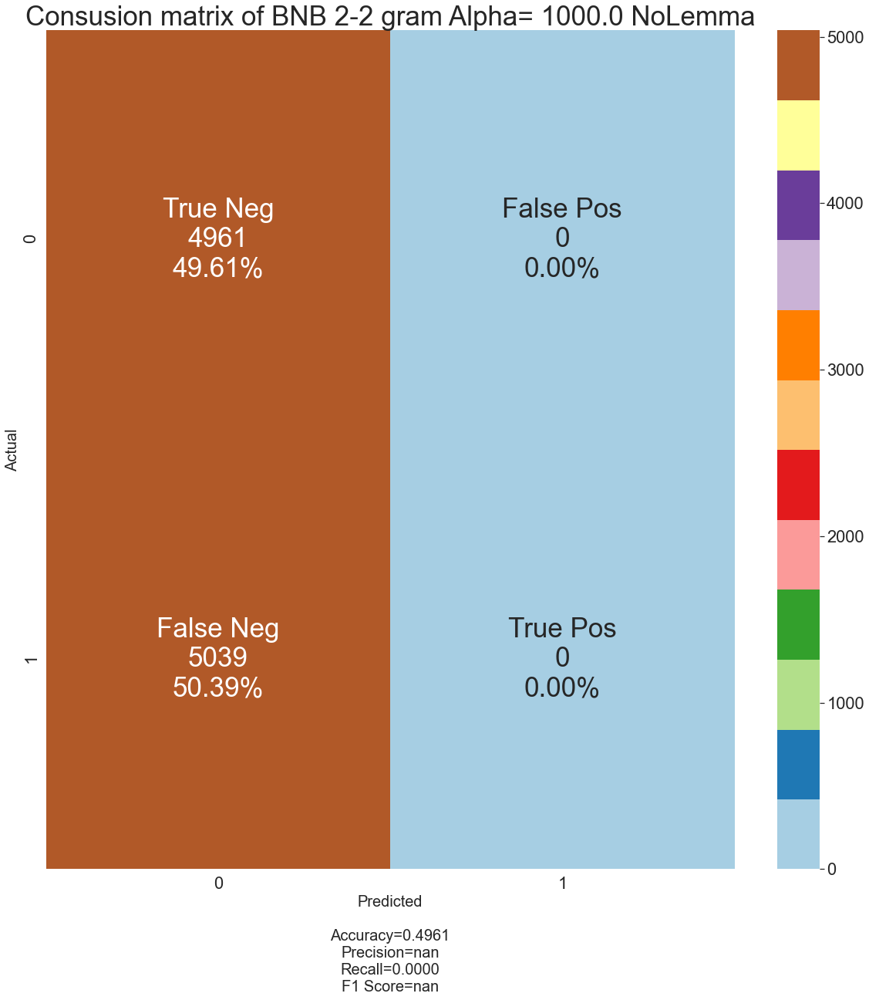

h:\projects\environment\tensorflow2.4\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-539-bc7732bd5ec7>:63: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP+FP)


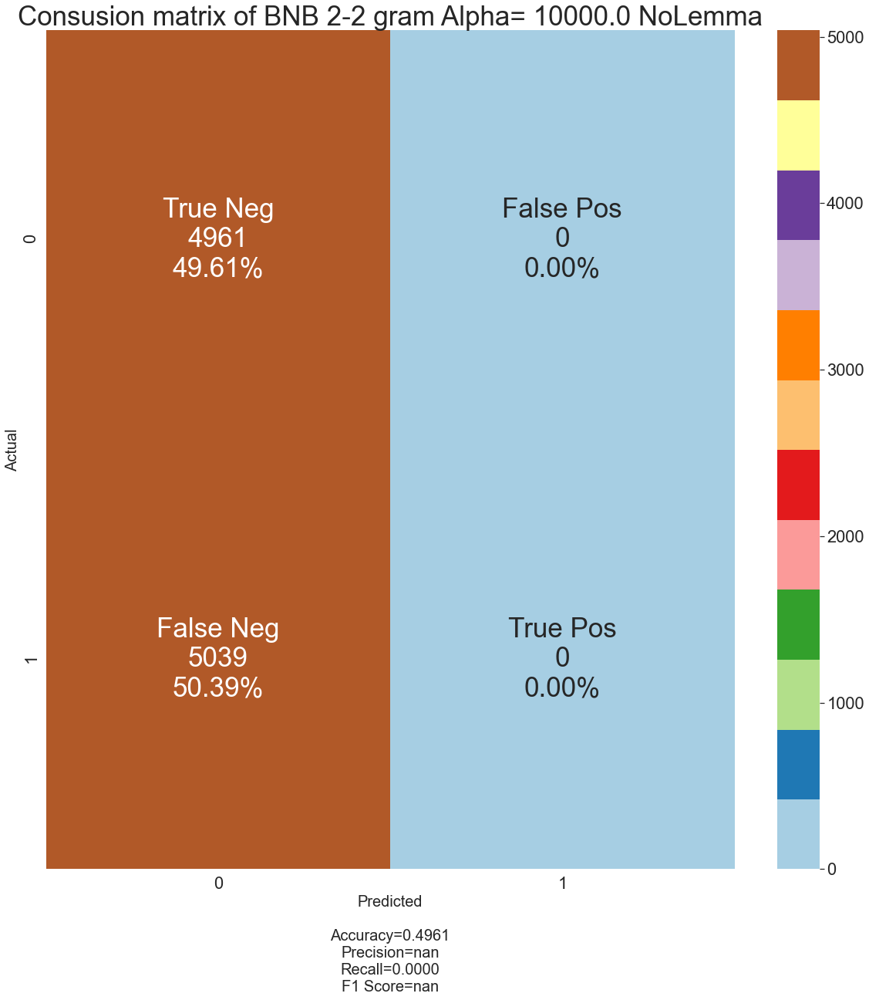

******************************
Finish BNB 2-2 grams


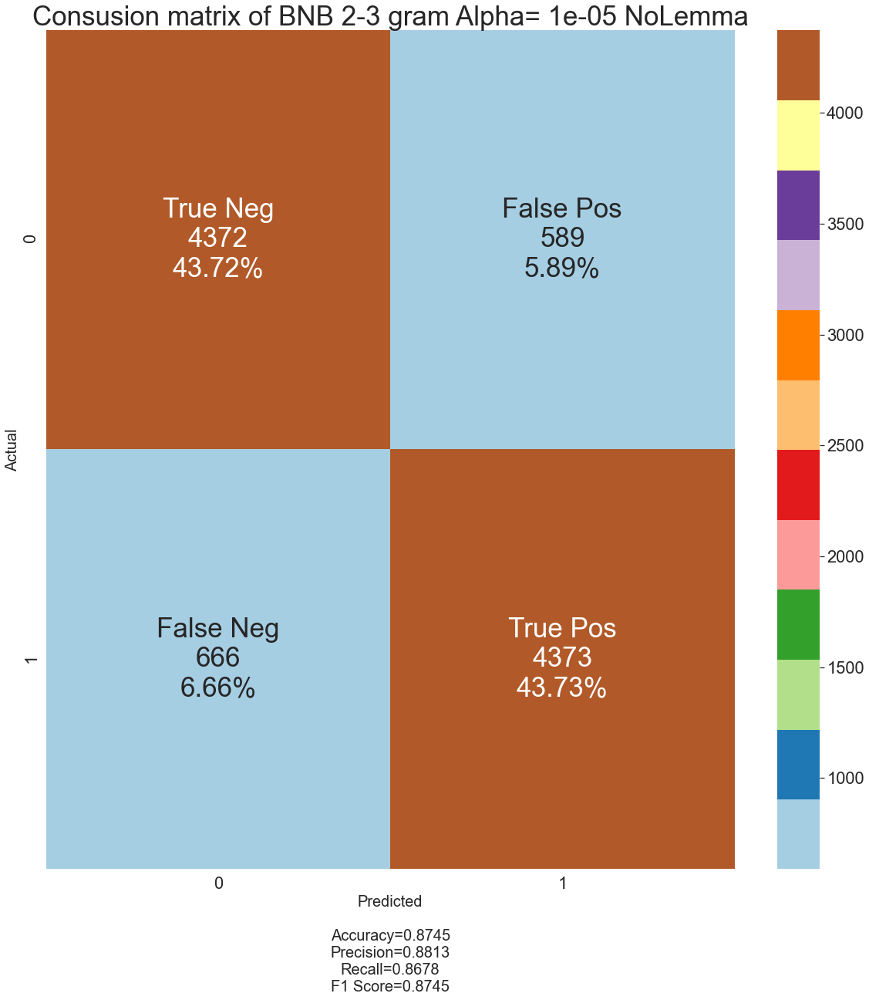

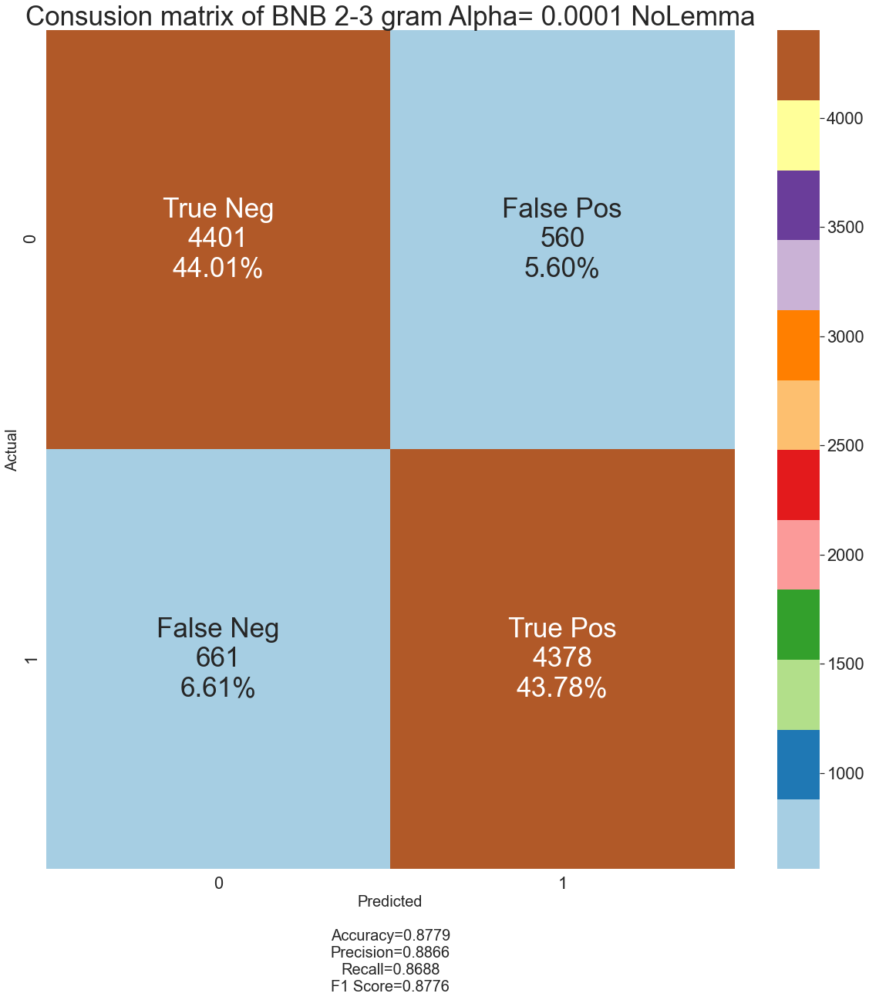

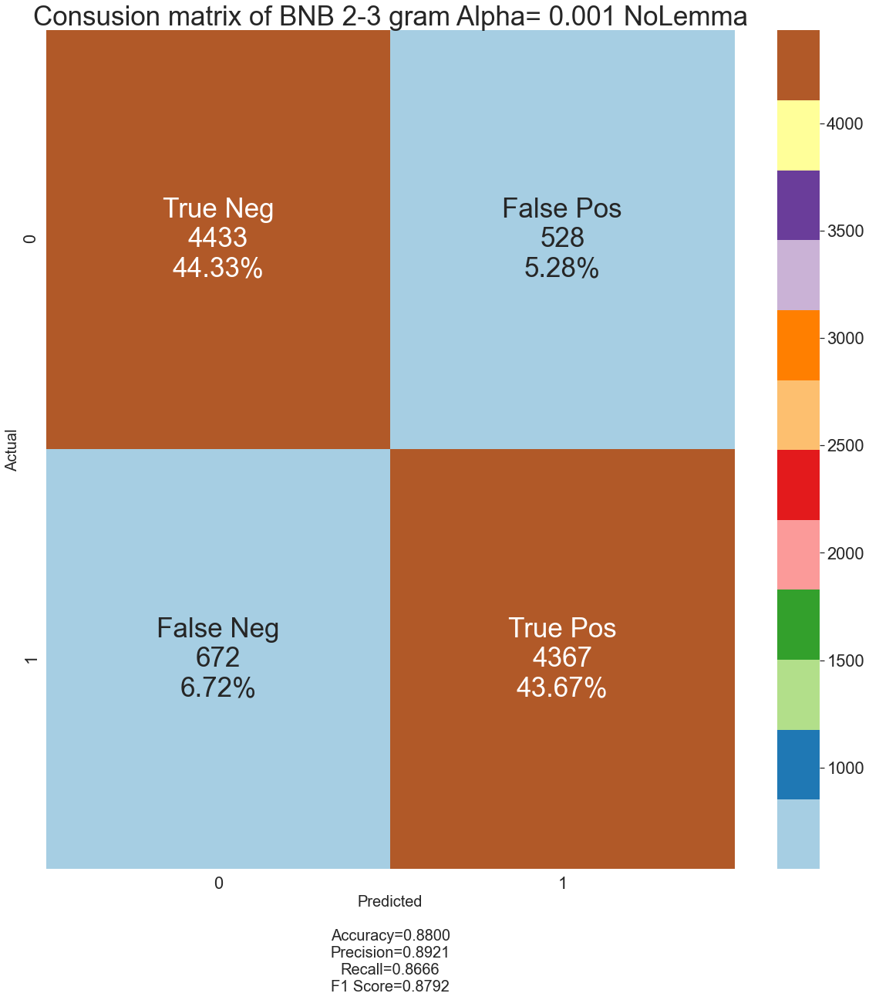

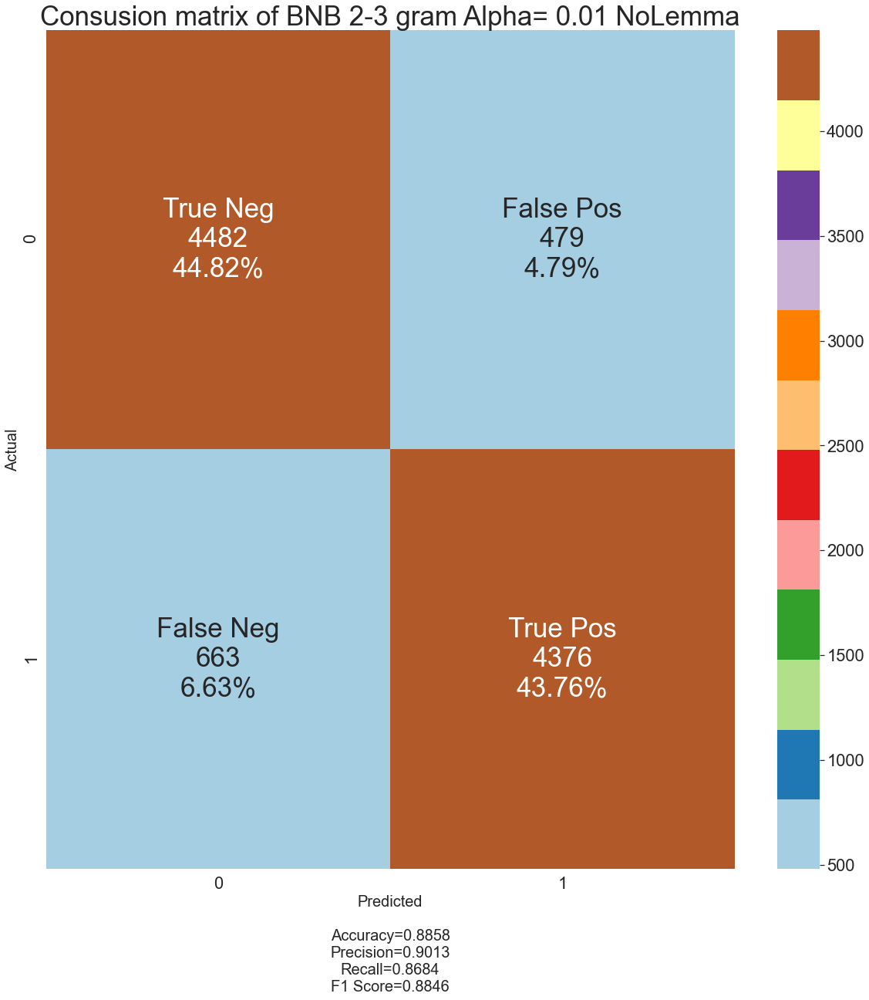

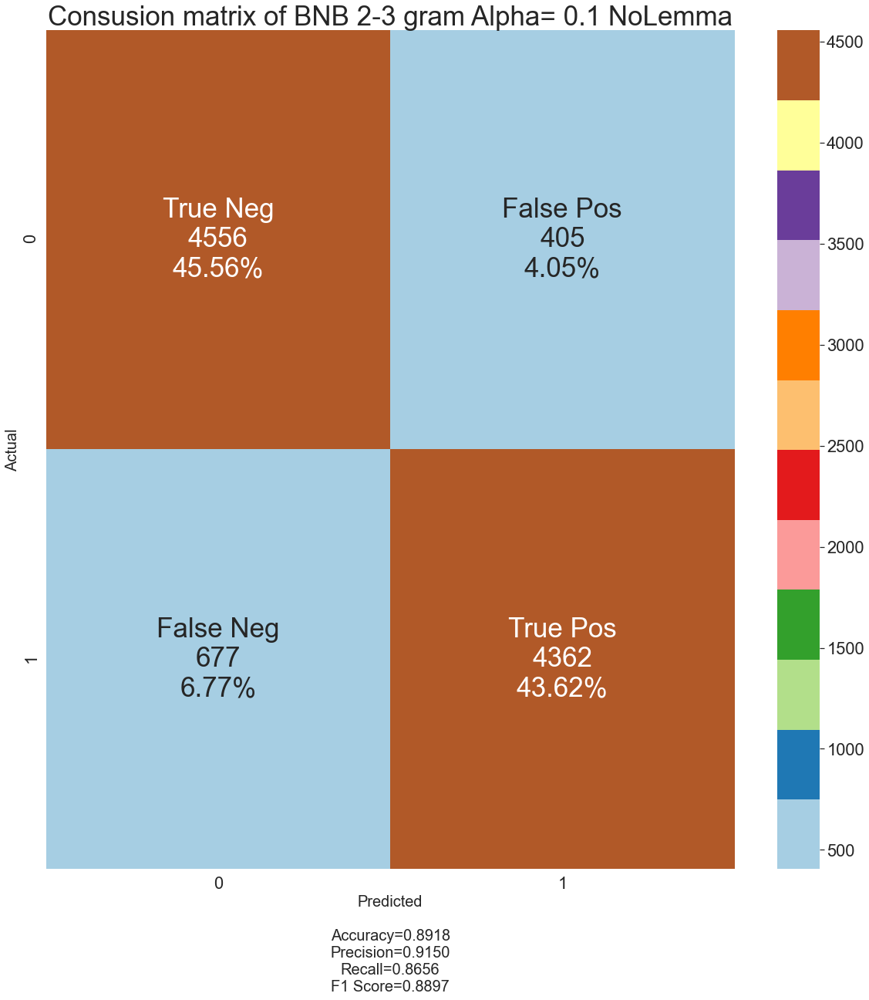

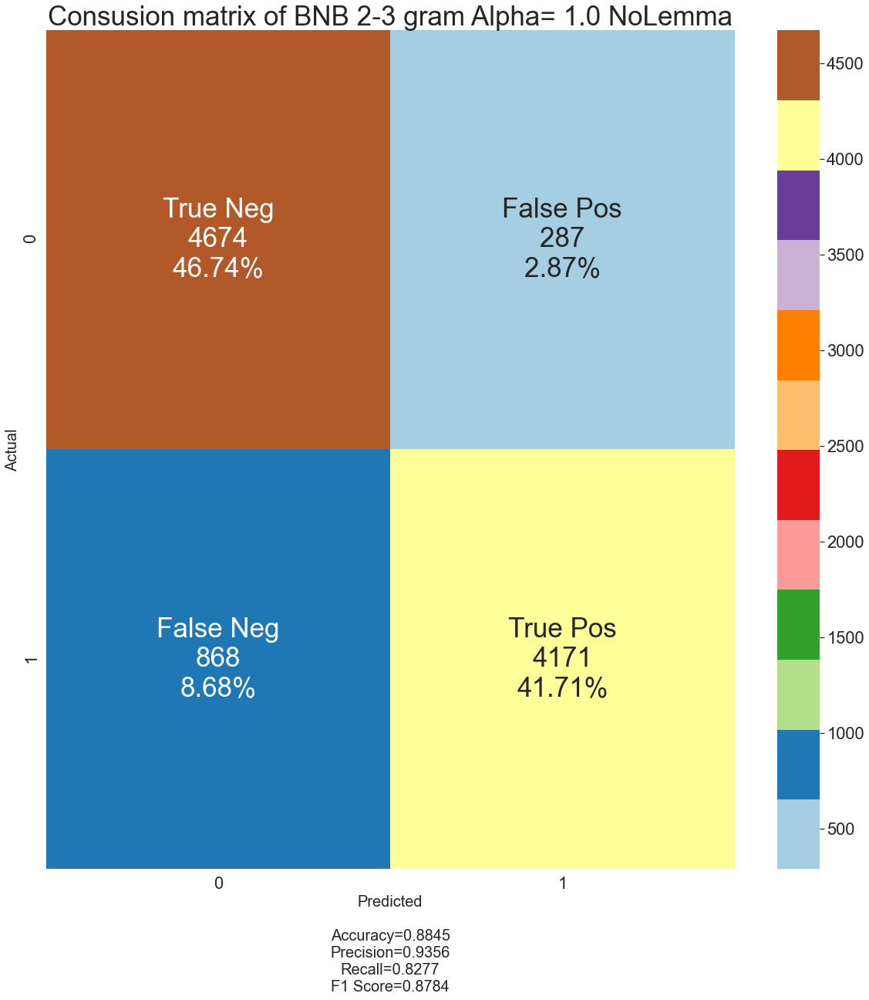

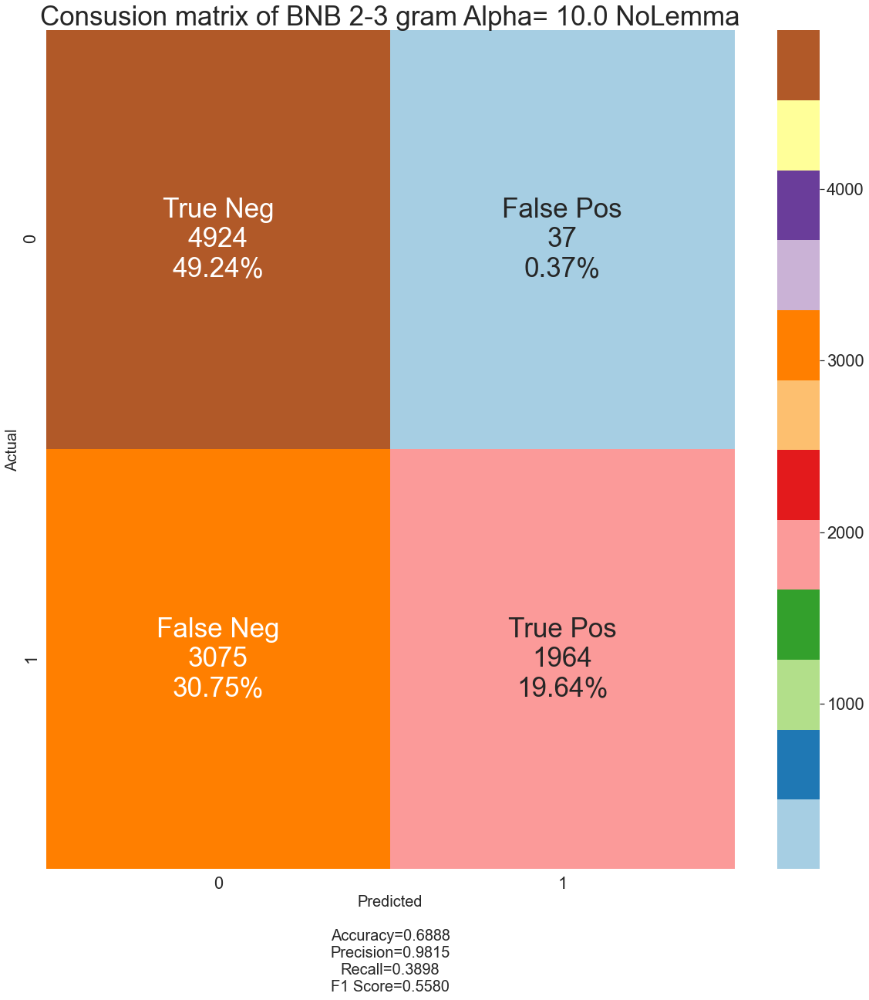

h:\projects\environment\tensorflow2.4\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-539-bc7732bd5ec7>:63: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP+FP)


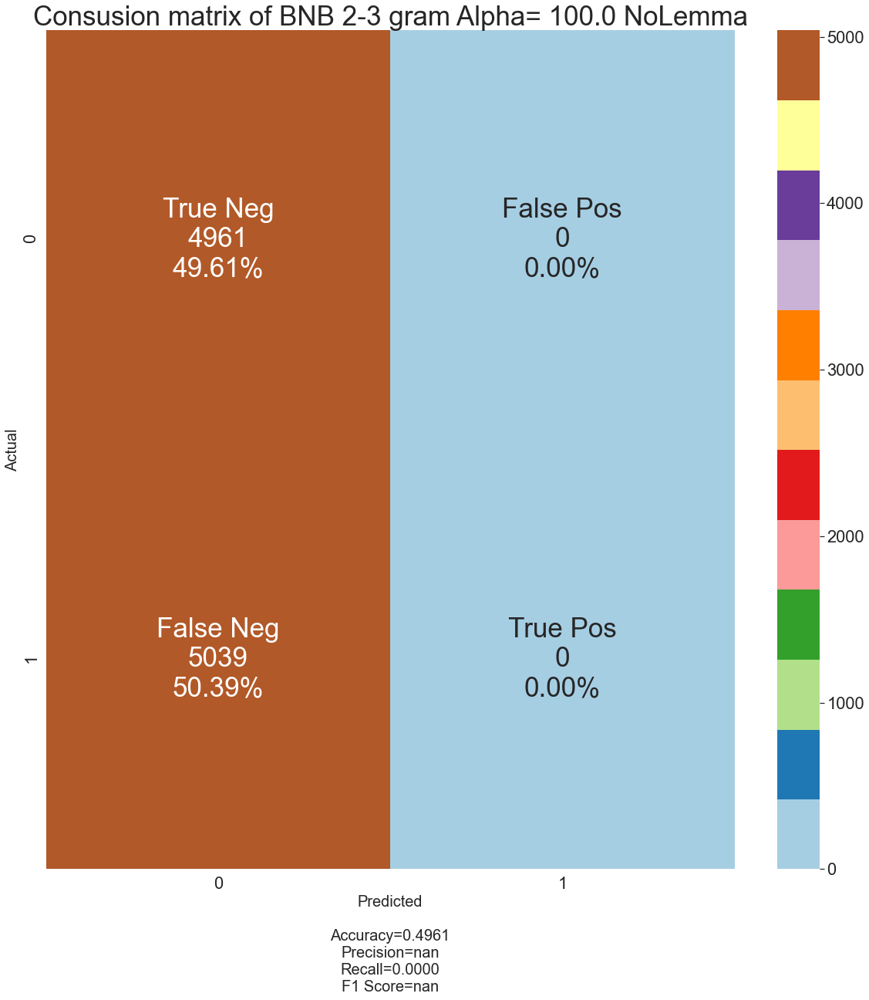

h:\projects\environment\tensorflow2.4\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-539-bc7732bd5ec7>:63: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP+FP)


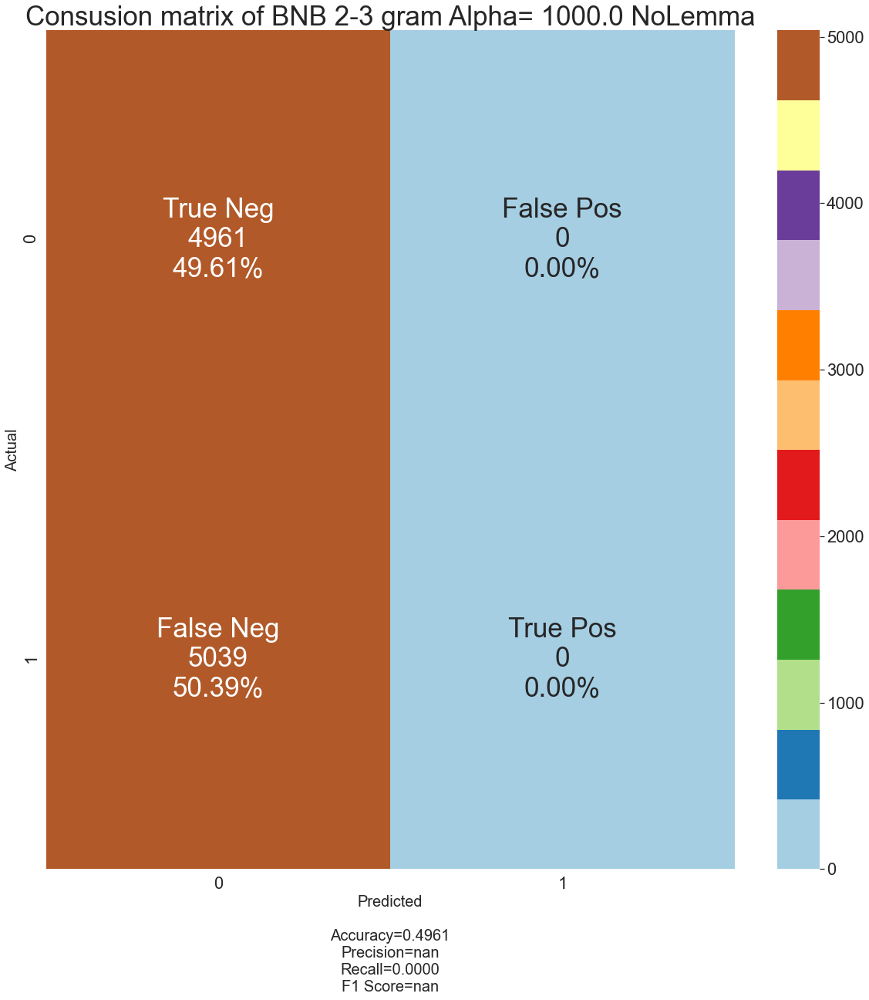

h:\projects\environment\tensorflow2.4\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-539-bc7732bd5ec7>:63: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP+FP)


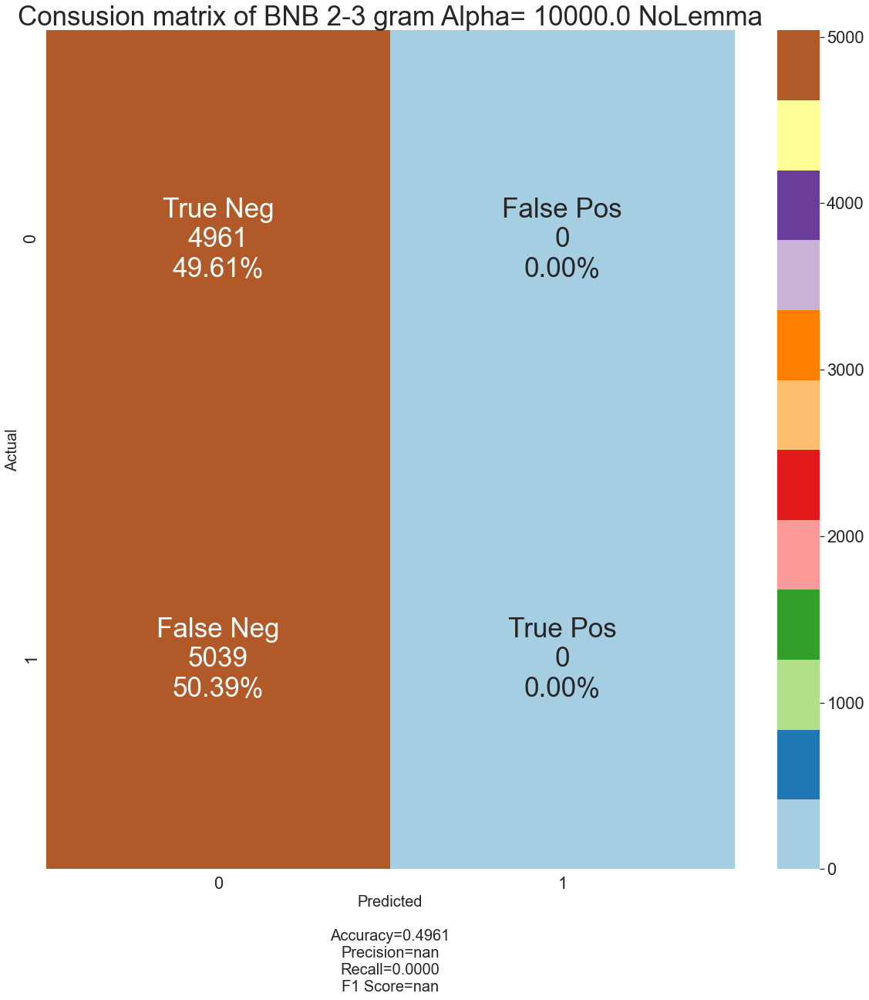

******************************
Finish BNB 2-3 grams


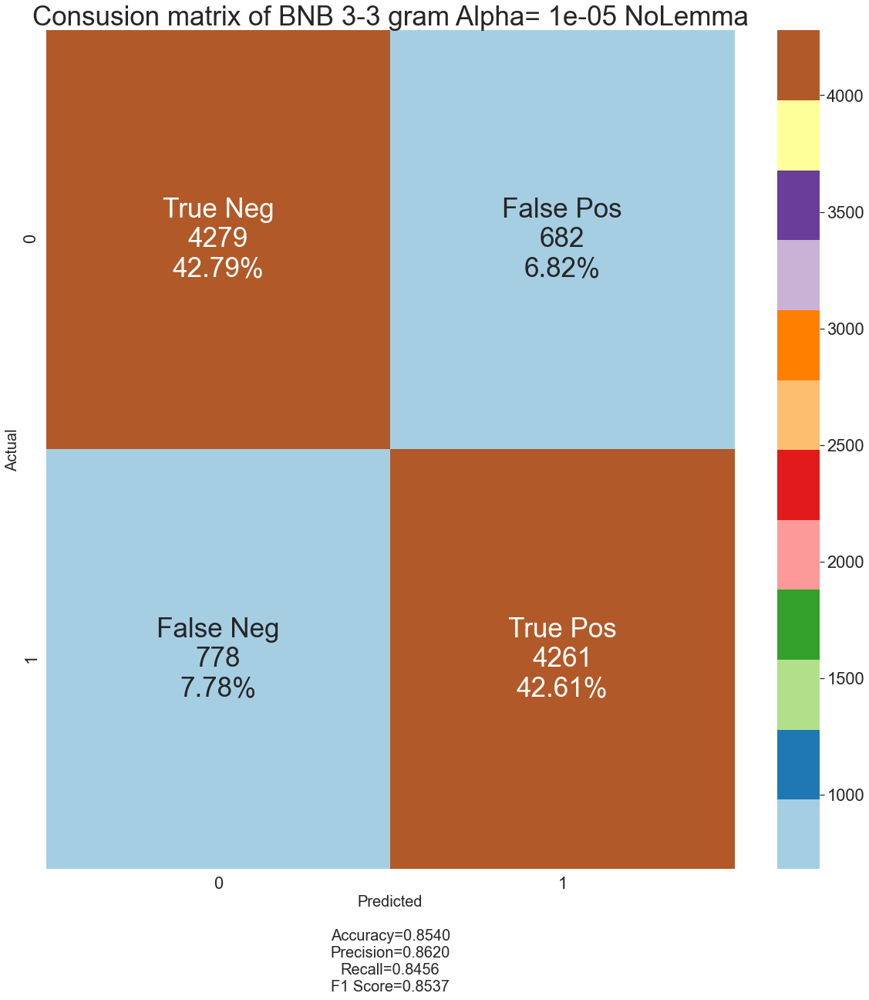

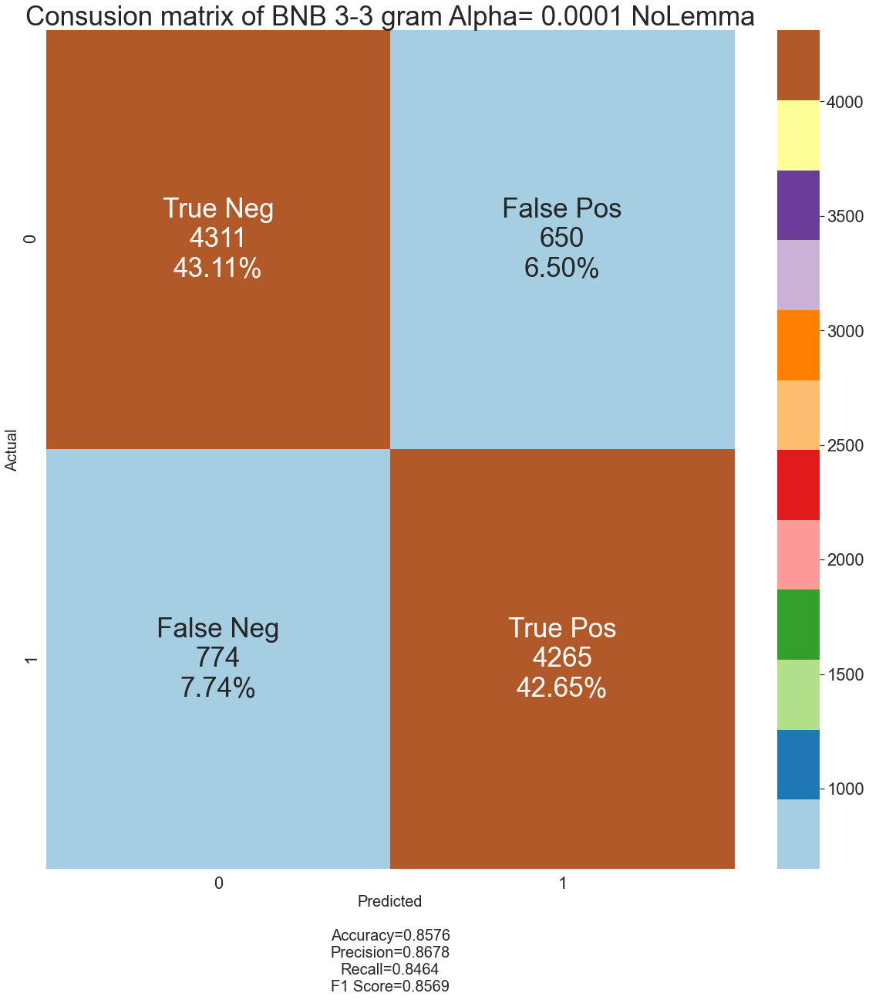

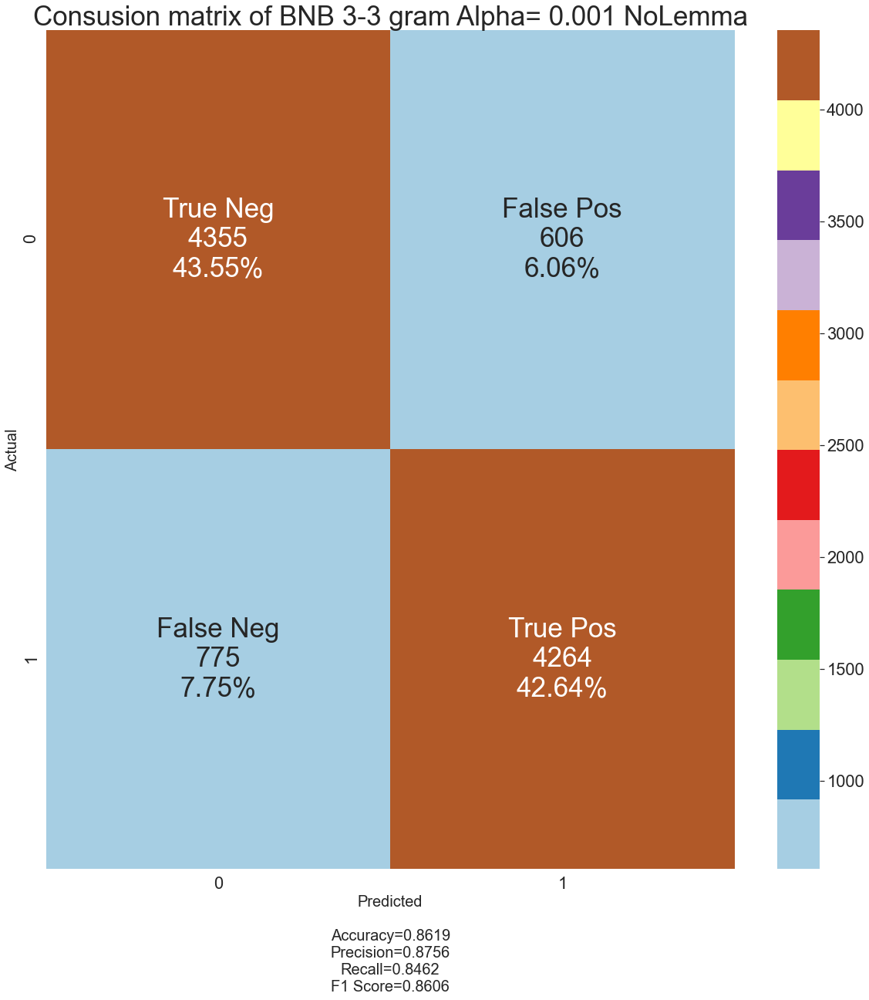

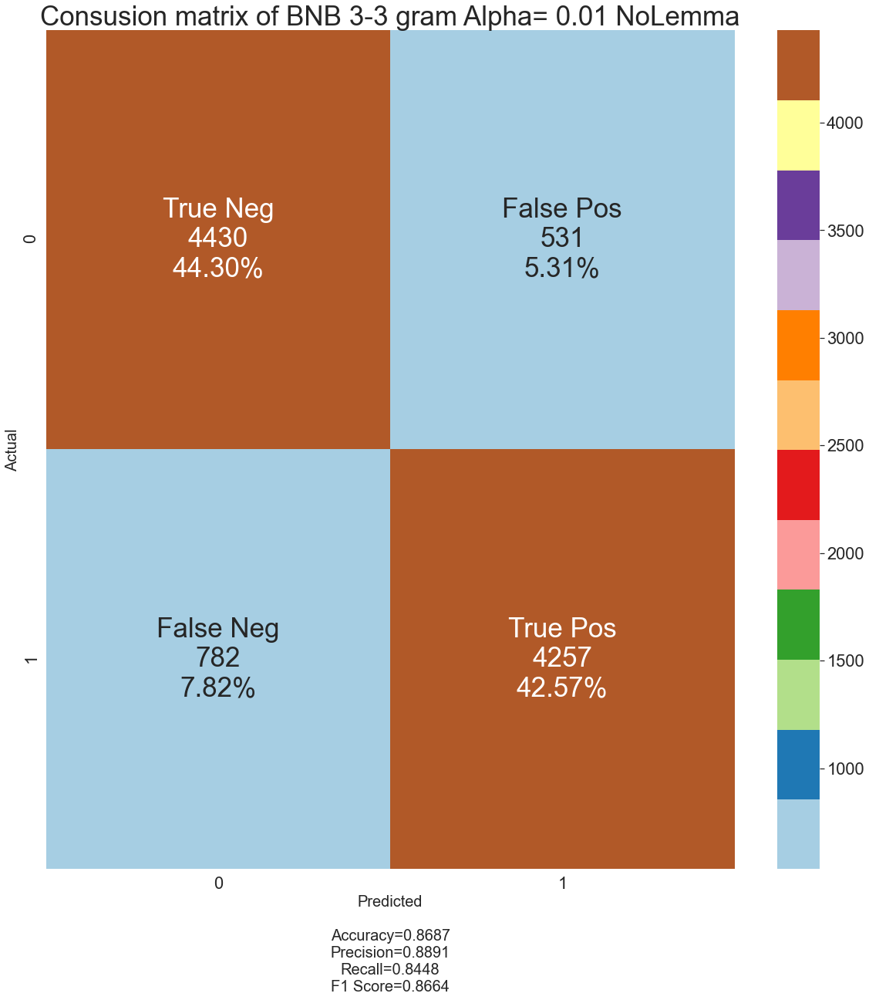

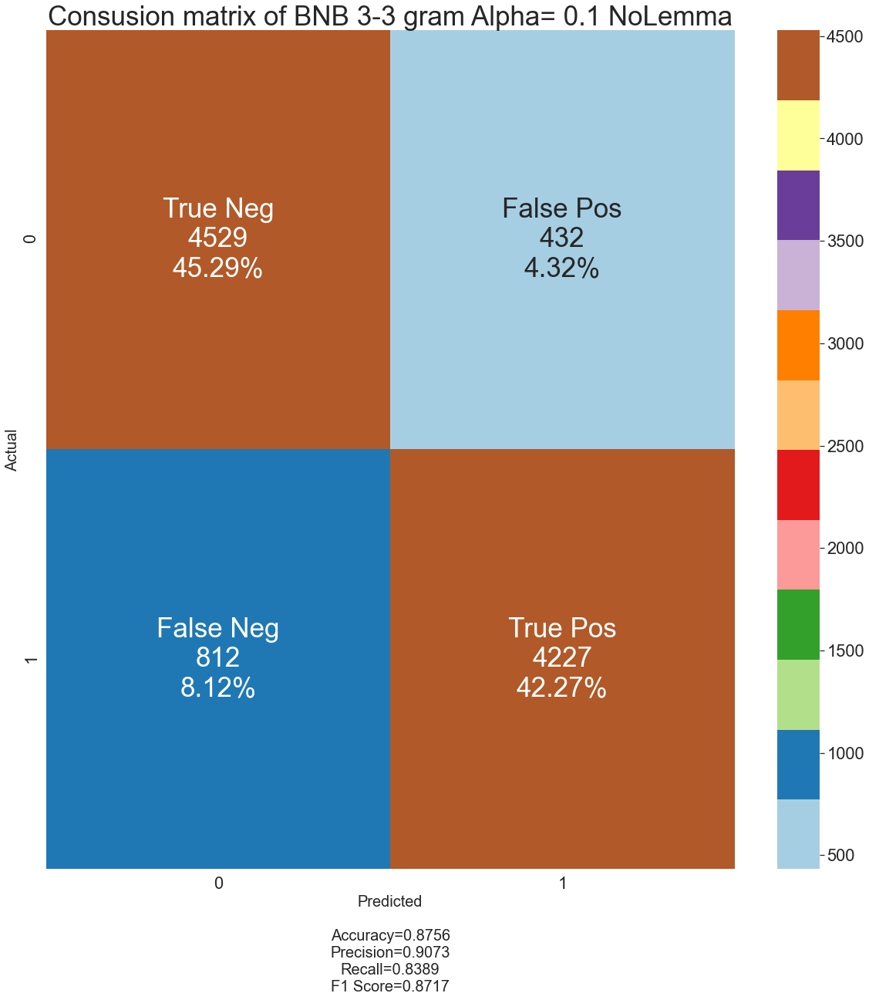

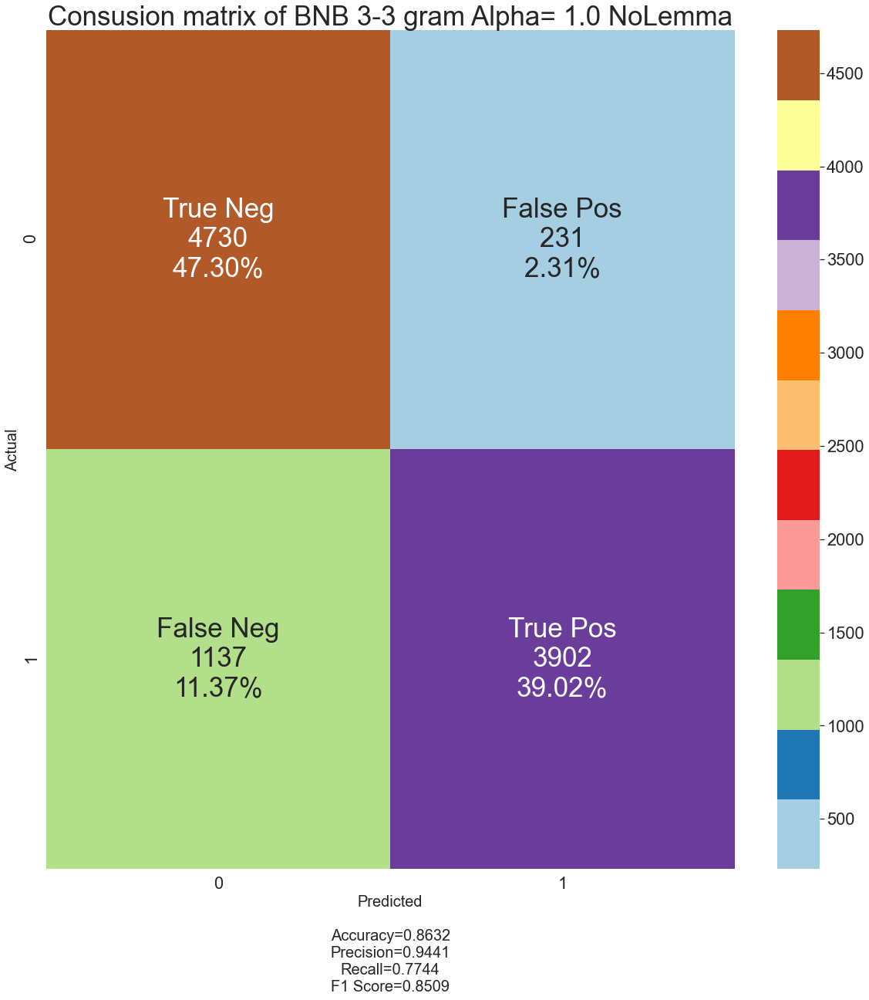

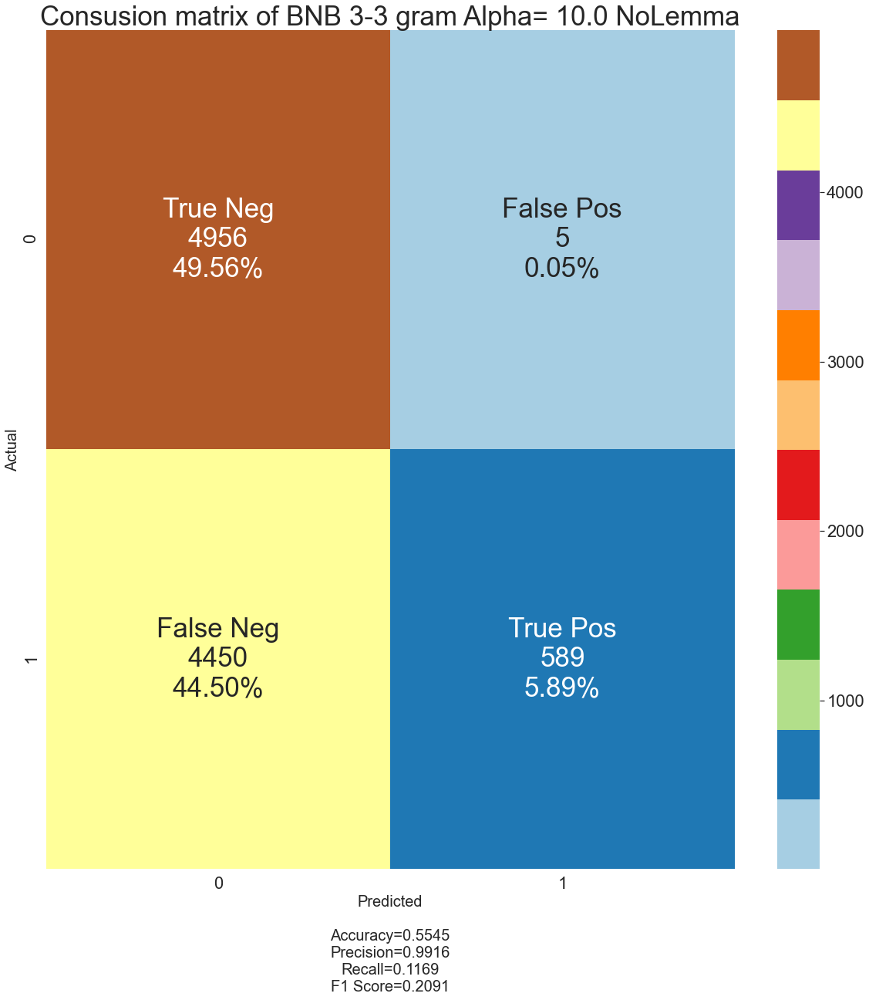

h:\projects\environment\tensorflow2.4\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-539-bc7732bd5ec7>:63: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP+FP)


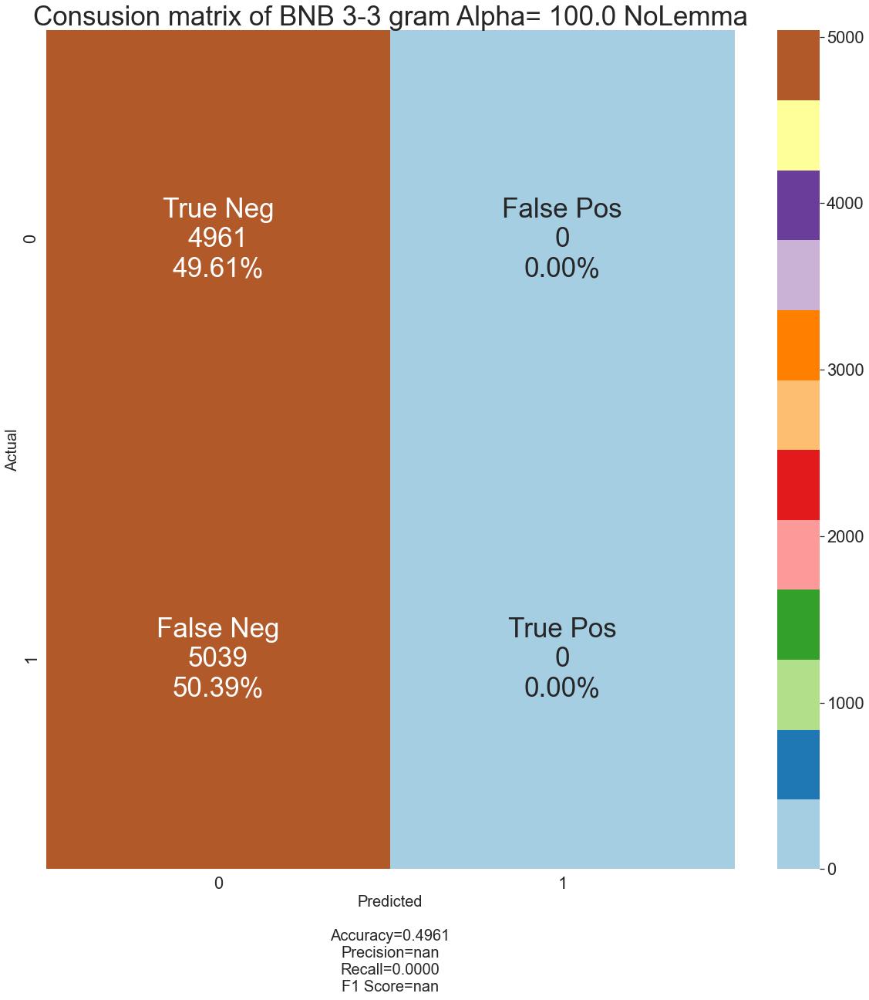

h:\projects\environment\tensorflow2.4\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-539-bc7732bd5ec7>:63: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP+FP)


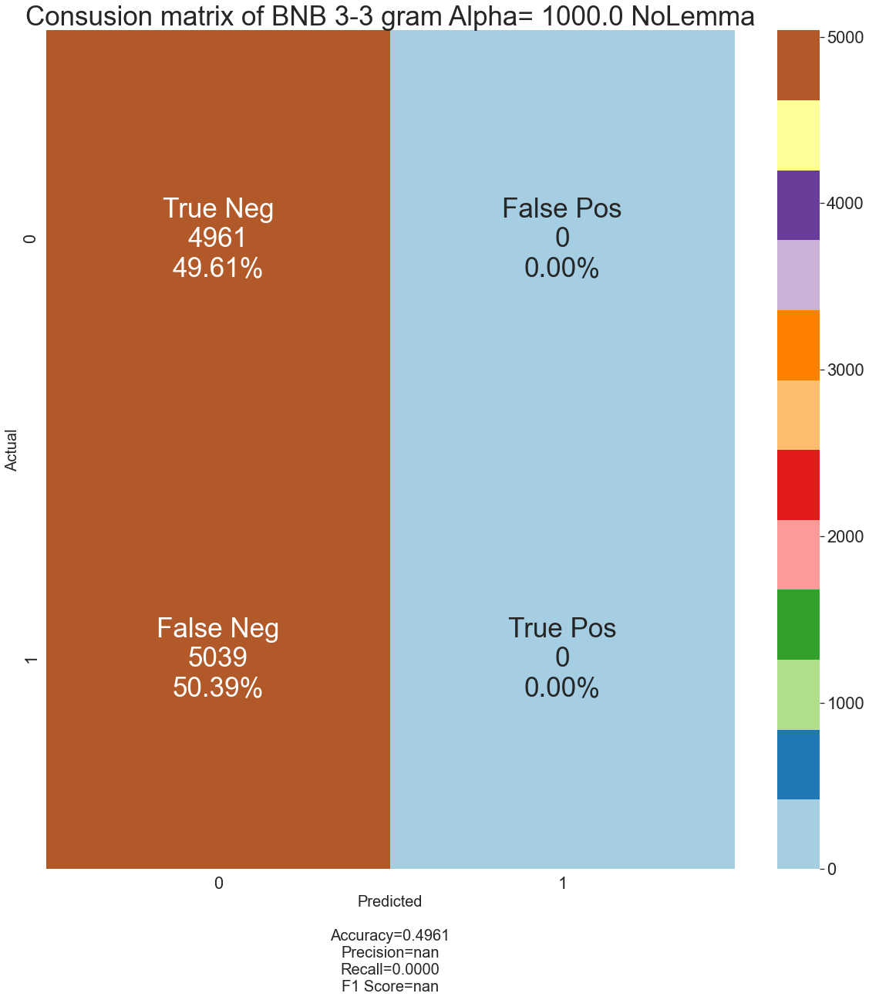

h:\projects\environment\tensorflow2.4\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-539-bc7732bd5ec7>:63: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP+FP)


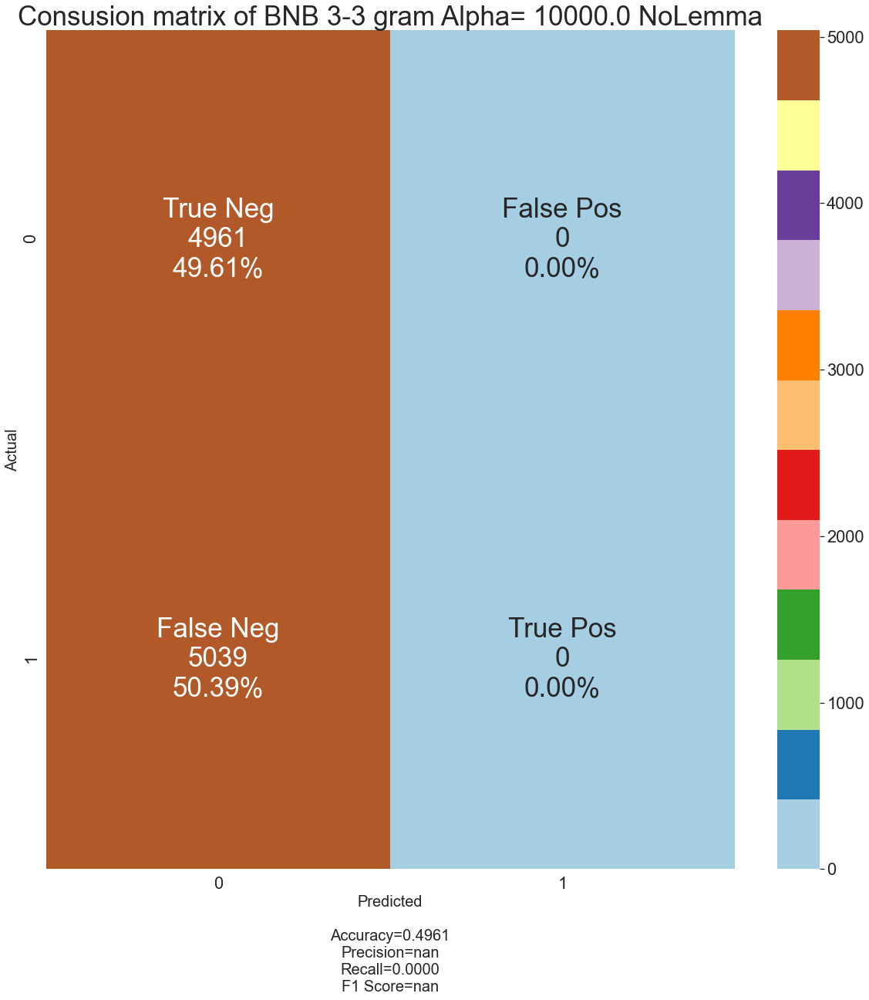

******************************
Finish BNB 3-3 grams
Wall time: 6min 6s


In [590]:
%%time
tuning(X_train, X_test, y_train, y_test, ["BNB"], ngrams, alphas)

** **
** **
### Data Preprocessing with removing stopwords

* load stopwords library

In [431]:
with open(".\data\Exports\master_sw.data", "rb") as file:
    master_sw = set(pickle.load(file))


In [442]:
def data_preprocessing_lemma(df):
    df = df.copy()
    
    # Replace sentiment col to numeric data
    df['sentiment'] = np.where(df['sentiment']=="positive", 1, 0)
    
    # lower case reviews
    df['review'] = df['review'].str.lower()
    
    # remove <br>
    df['review']= df['review'].str.replace('<.*?>', "")
    
    # remove ' ,puncuation and symbols
    df['review'] = df['review'].str.replace("'", "")

    df['review'] = df['review'].str.replace("[^\w\s]"," ")
    
    # remove stopwords
    df['review'] = df['review'].apply(lambda x: " ".join([word for word in x.split() if word not in master_sw]))
    
    # Lemmatization
    WNlemma = nltk.WordNetLemmatizer()
    df['review'] = df['review'].apply(lambda x: " ".join([WNlemma.lemmatize(word) for word in x.split()]))
    
    return df

In [527]:
%%time
data_lm = data_preprocessing_lemma(imdb)
data_lm.head()

<ipython-input-442-751aae45b09c>:11: FutureWarning: The default value of regex will change from True to False in a future version.
  df['review']= df['review'].str.replace('<.*?>', "")
<ipython-input-442-751aae45b09c>:16: FutureWarning: The default value of regex will change from True to False in a future version.
  df['review'] = df['review'].str.replace("[^\w\s]"," ")


Wall time: 17.3 s


,review,sentiment
0,reviewer mentioned watching 1 oz episode youll...,1
1,wonderful little production filming technique ...,1
2,thought wonderful way spend time hot summer we...,1
3,basically there family little boy jake think t...,0
4,petter matteis love time money visually stunni...,1


## Run the code

* Split data for training and testing

In [486]:
X_lm_train, X_lm_test, y_lm_train, y_lm_test = train_test_split(data_lm["review"],
                                                    data_lm["sentiment"],
                                                    random_state = 42,
                                                    train_size = 0.8
                                                   )

* Fit CountVectorizer to data

In [487]:
X_lm_train_cv, X_lm_test_cv = fit_transform(X_lm_train, X_lm_test, ngram=[1,1])

### Unigram

* get prediction

In [449]:
%%time
predictions_lm = MNB_predict(X_lm_train_cv, X_lm_test_cv, y_lm_train, alpha=1)
predictions_lm[:100]

Wall time: 27.9 ms


array([1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1,
       1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1,
       1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1])

* get evaluation

In [458]:
method = ["accuracy", "precision", "recall", "f1"]

results_lm = clfrMeasure().evaluation(y_lm_test, predictions_lm, method)
results_lm

{'accuracy': 0.8561, 'precision': 0.8698, 'recall': 0.8402, 'f1': 0.8547}

* Confusion Matrix

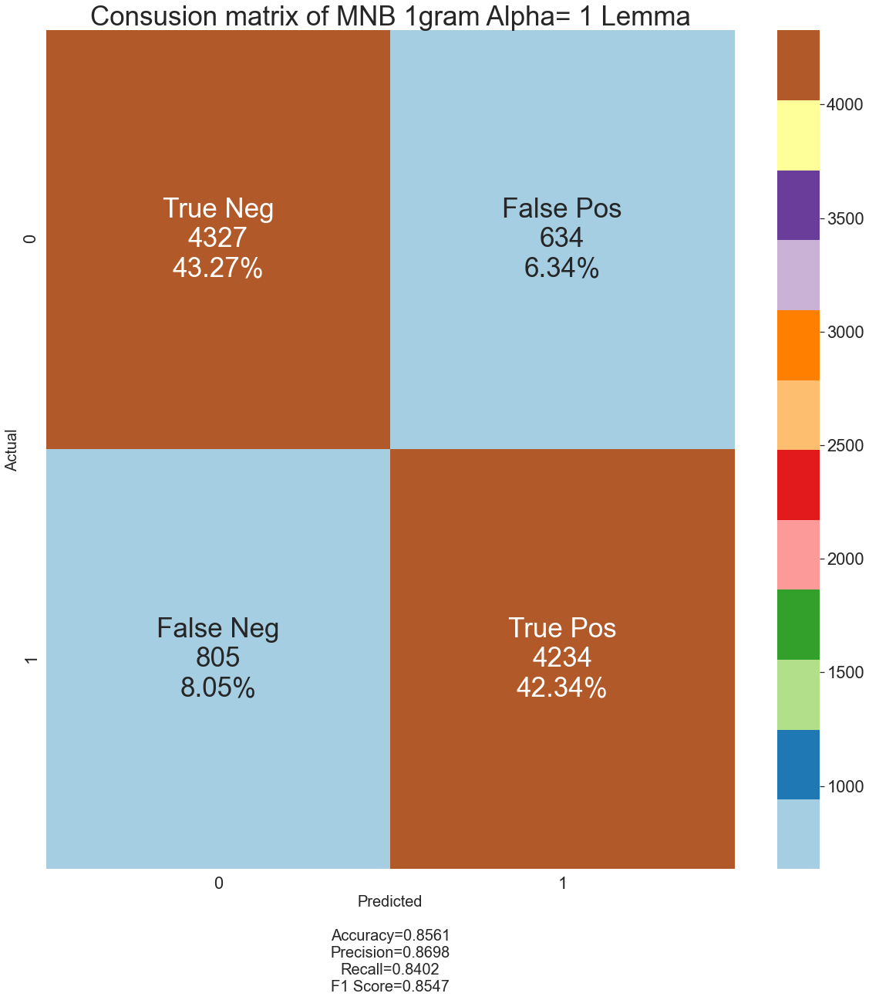

In [493]:
clfrMeasure().confusion_matrix(y_lm_test, predictions_lm, "1gram", "MNB", alpha = 1, lemma=True)

## Optimization and Tuning

*  Tuning `Alpha` and `ngrams`

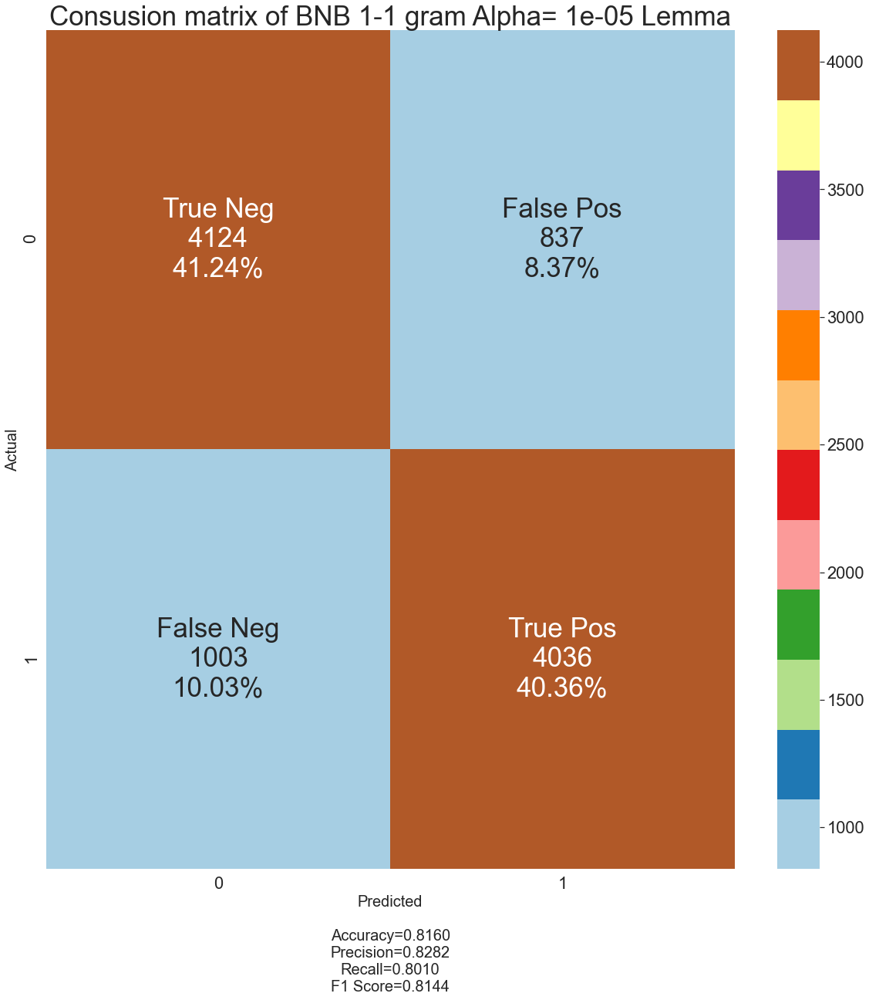

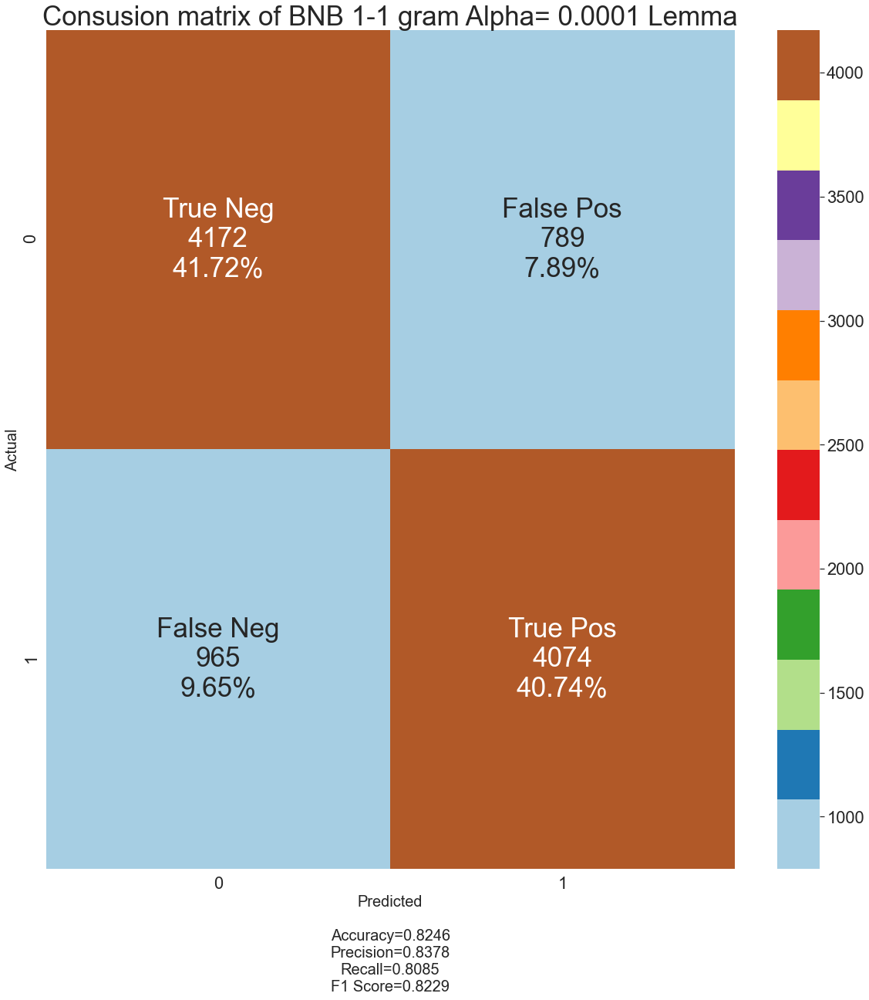

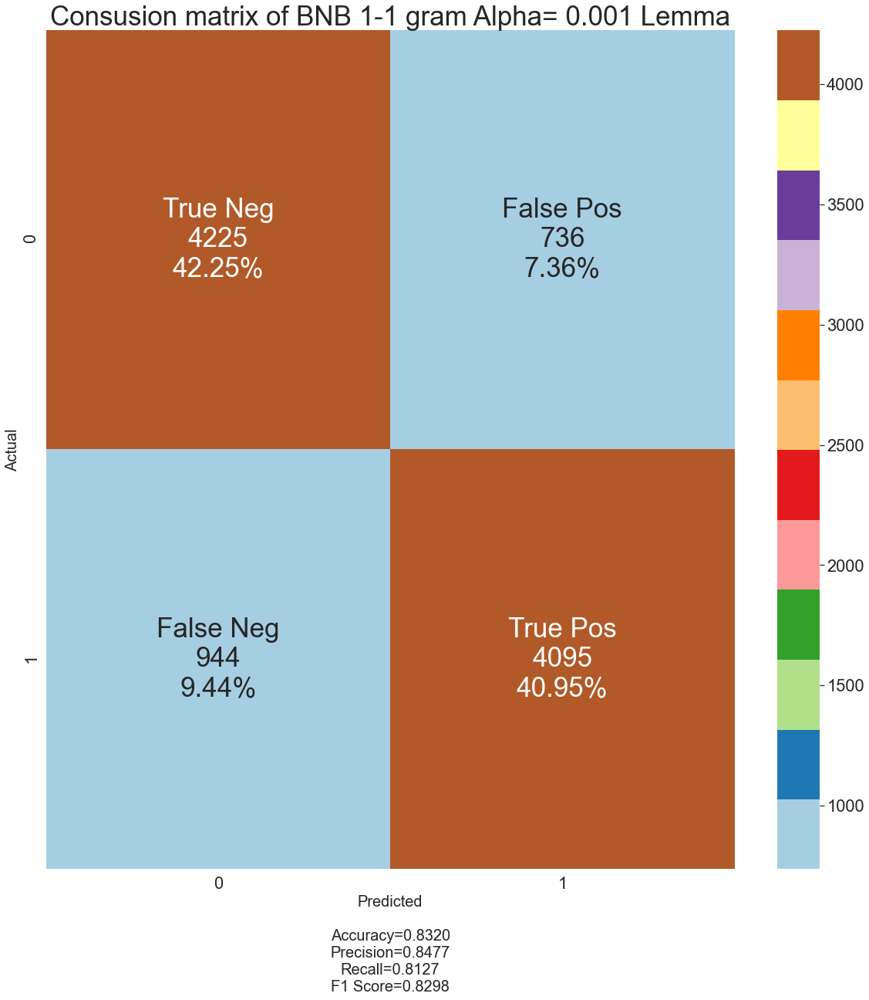

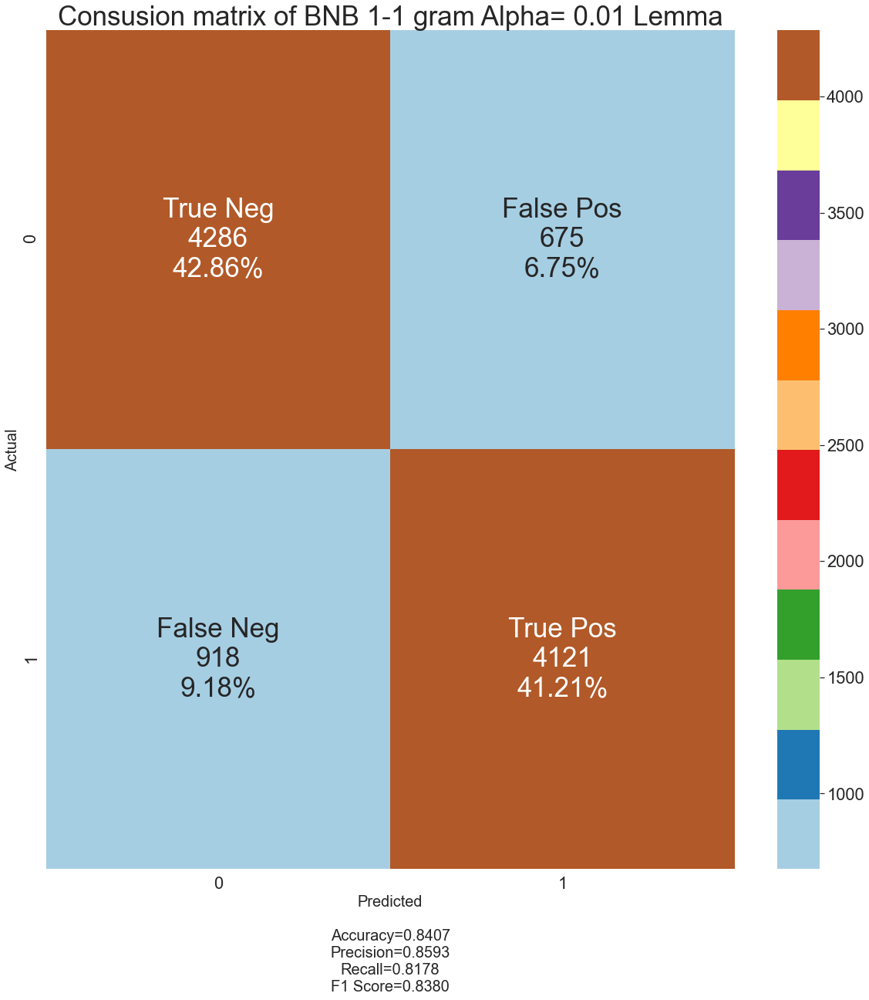

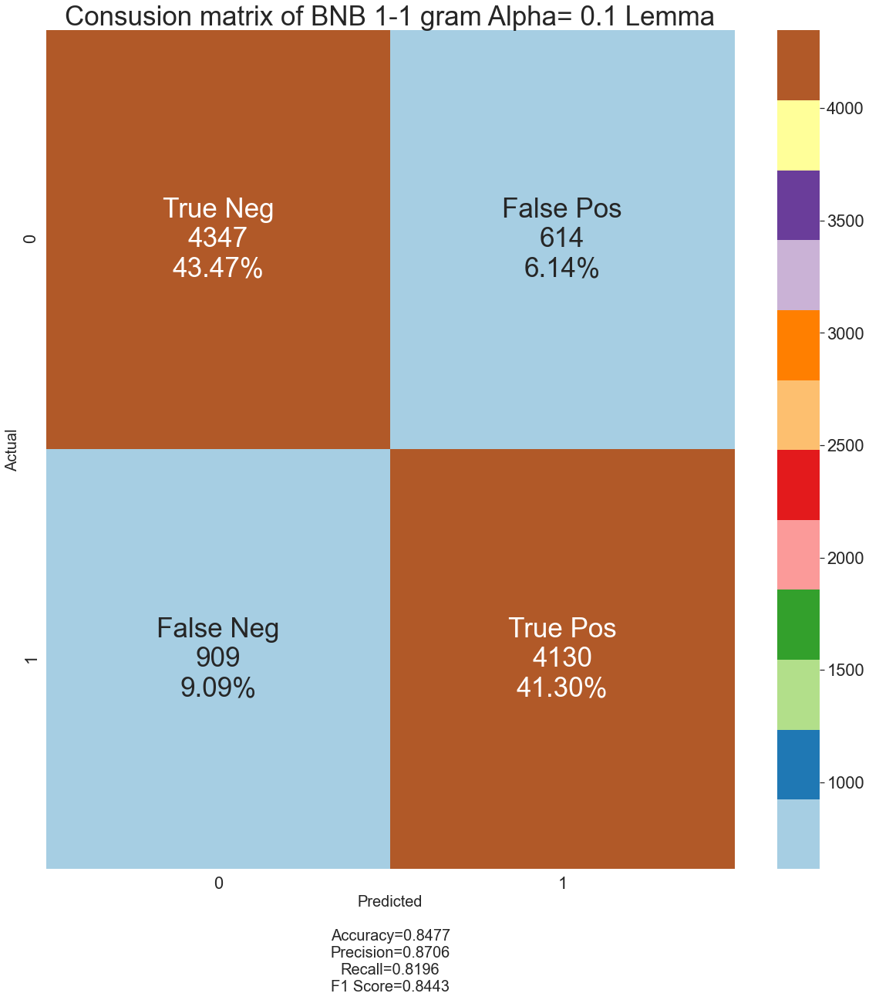

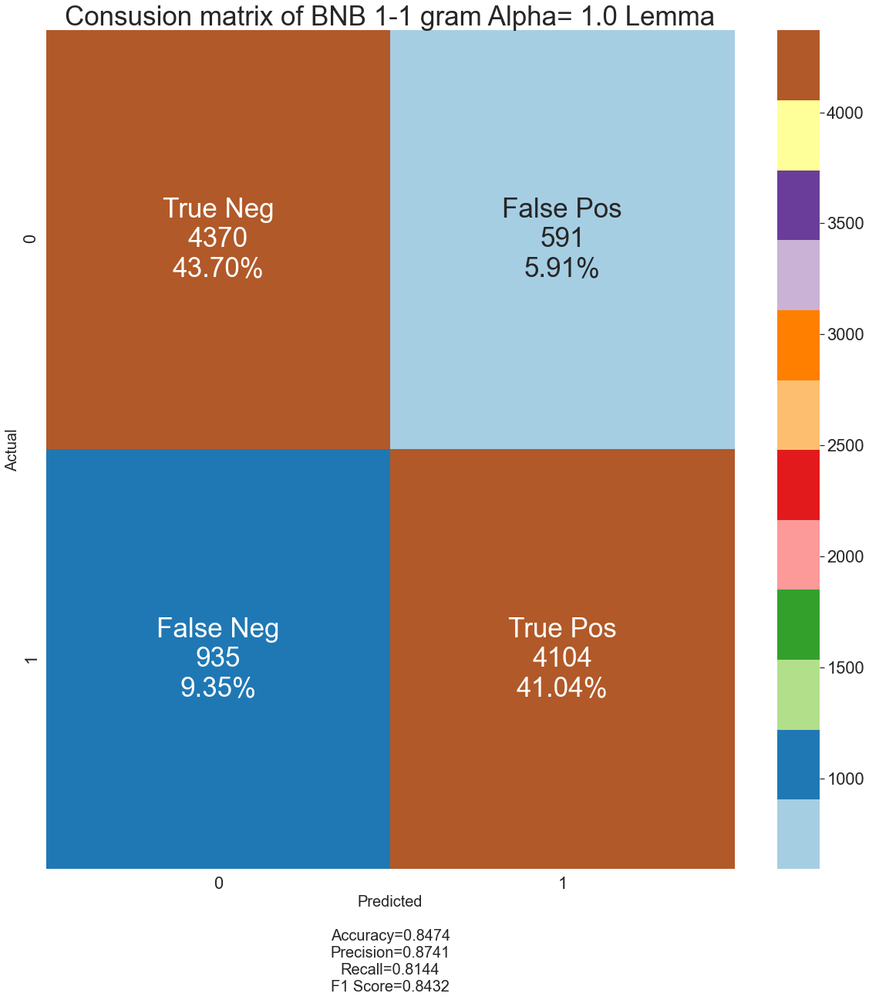

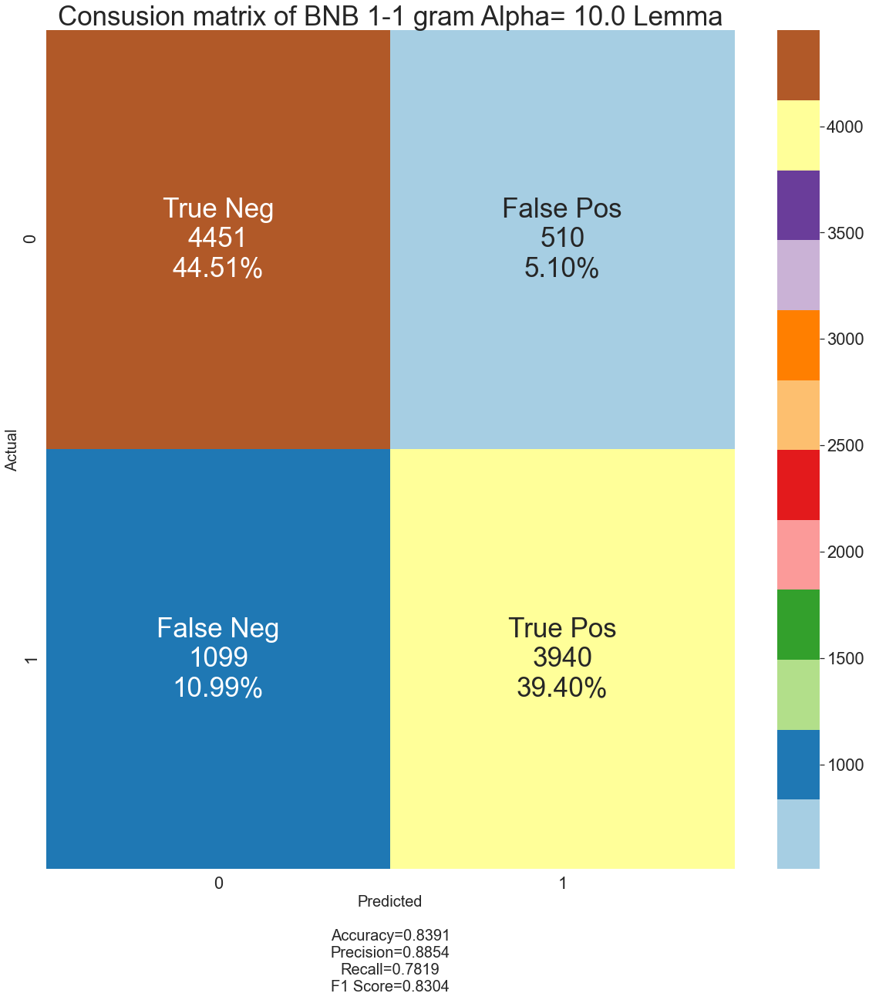

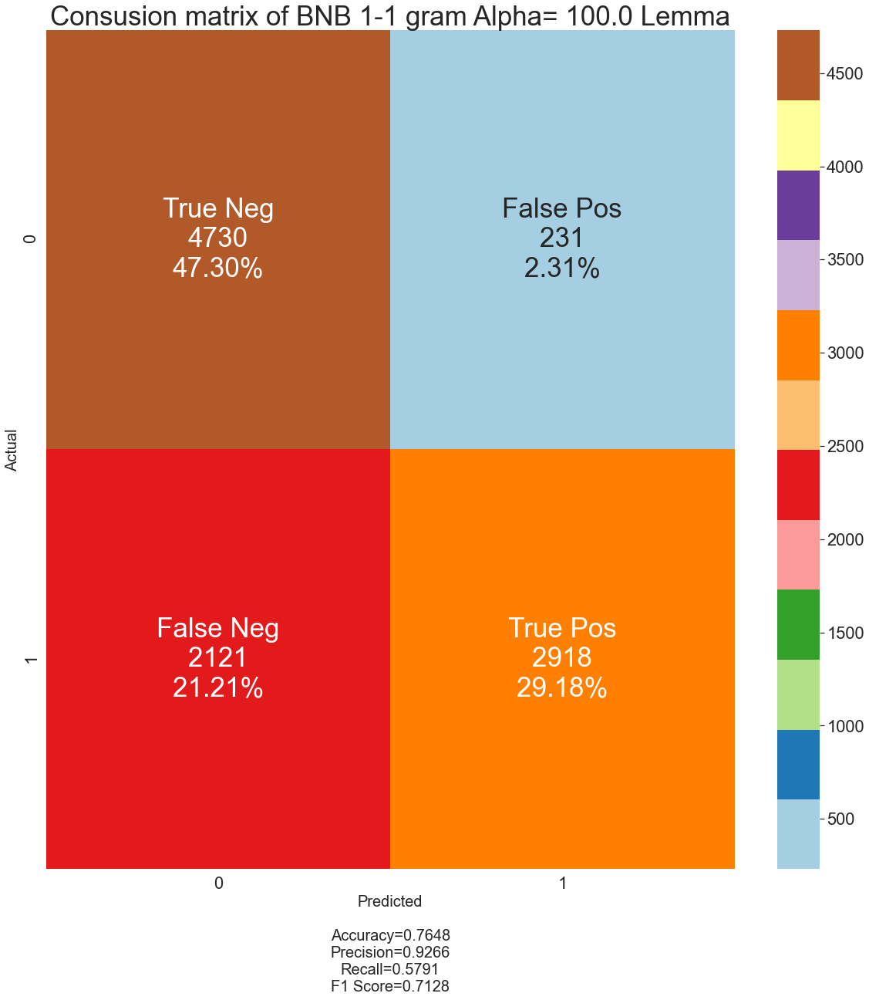

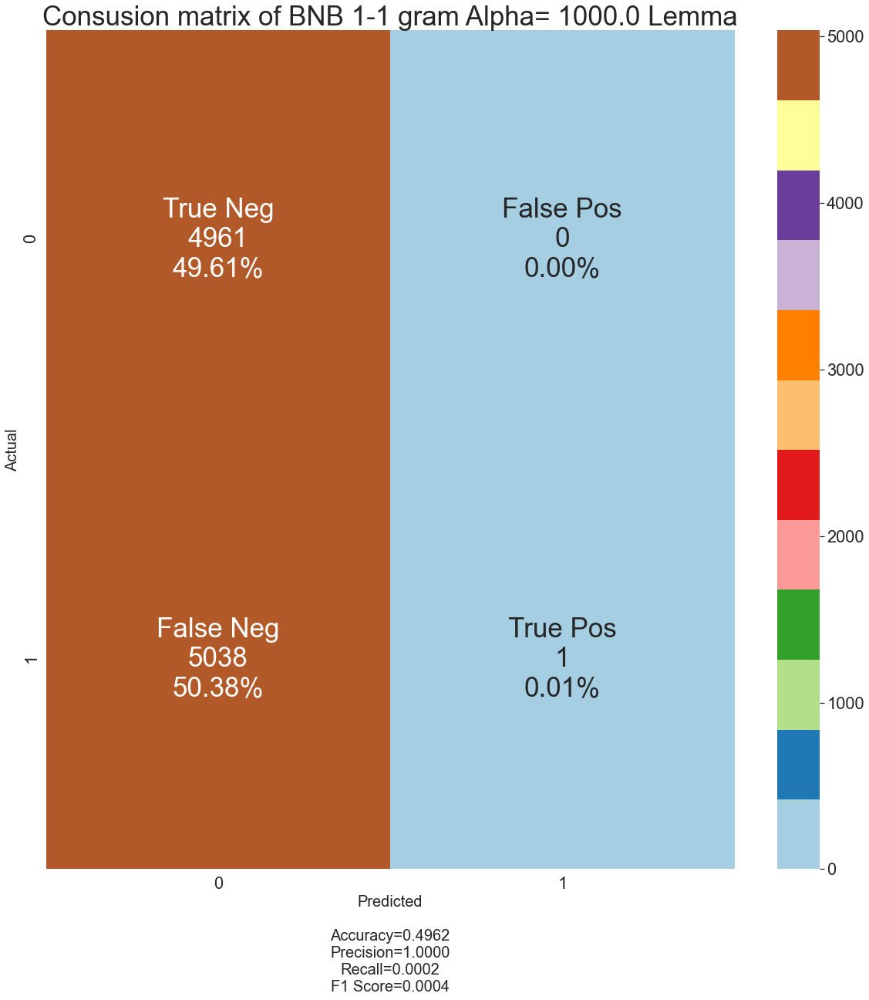

h:\projects\environment\tensorflow2.4\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-539-bc7732bd5ec7>:63: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP+FP)


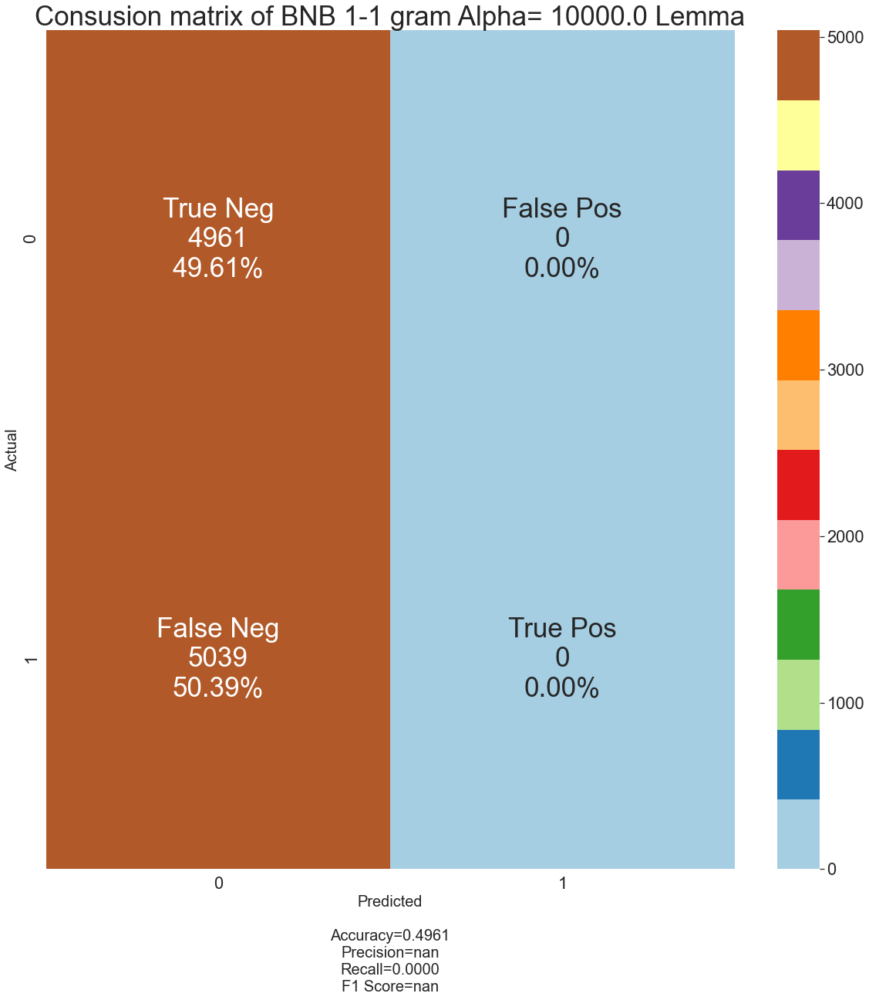

******************************
Finish BNB 1-1 grams


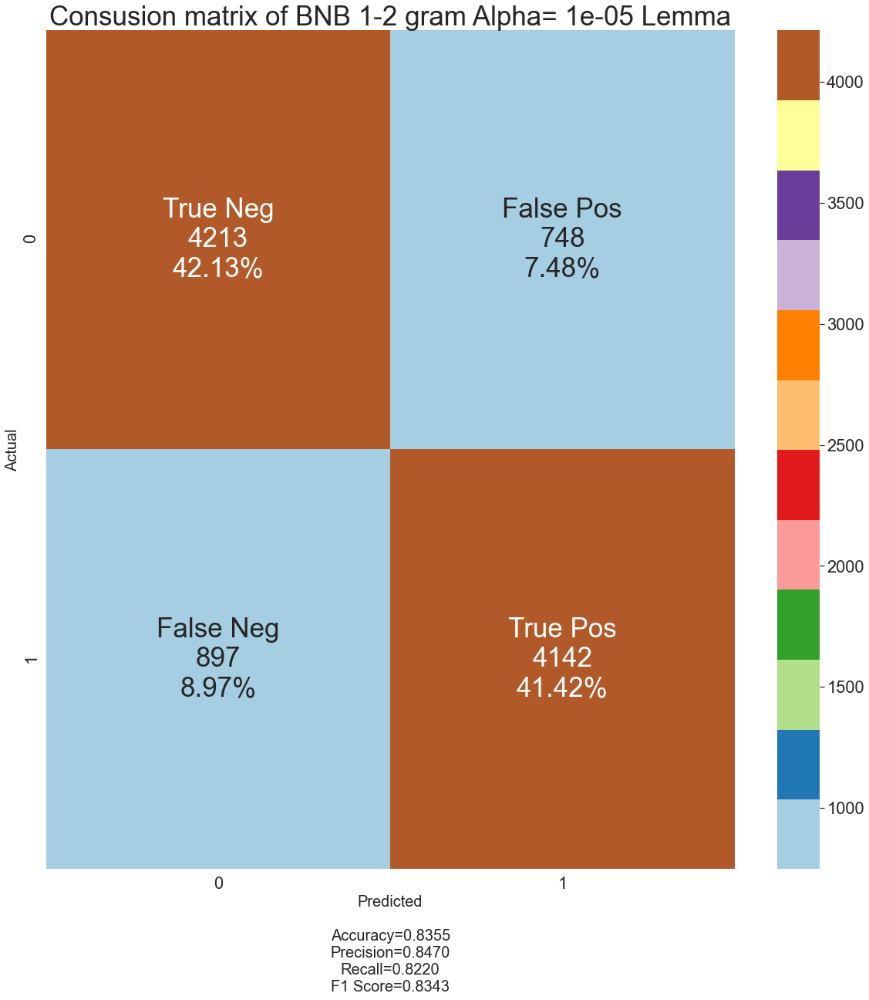

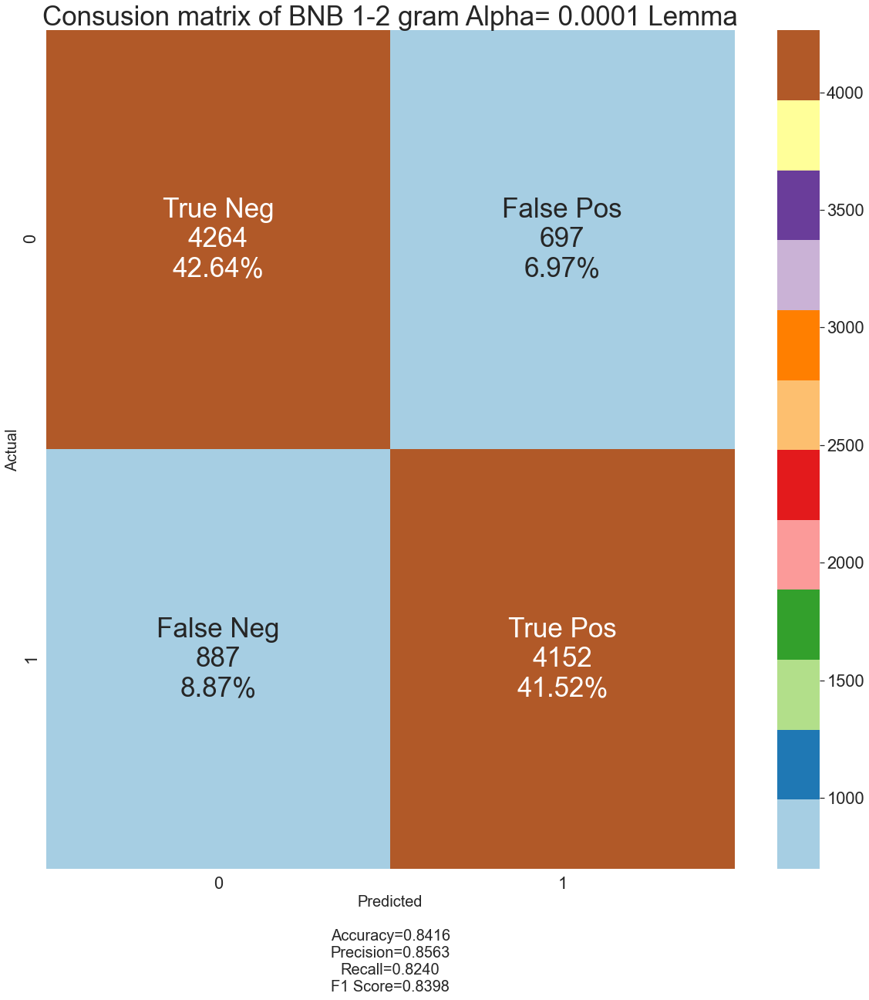

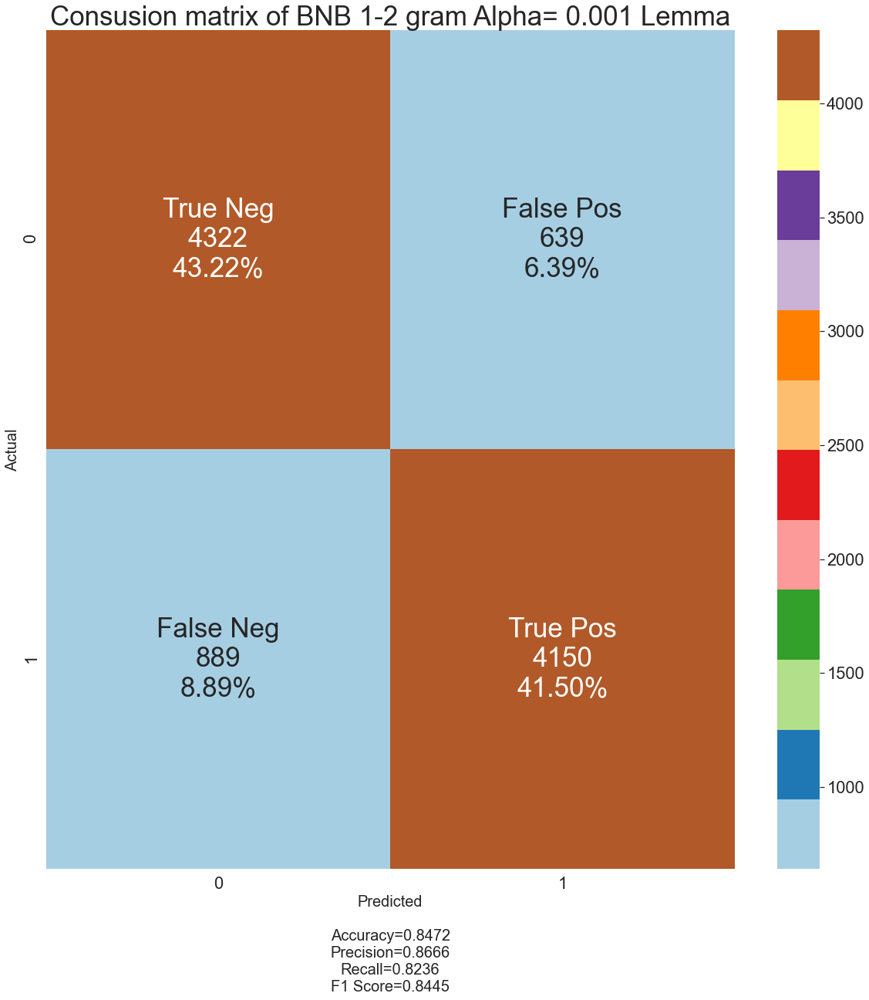

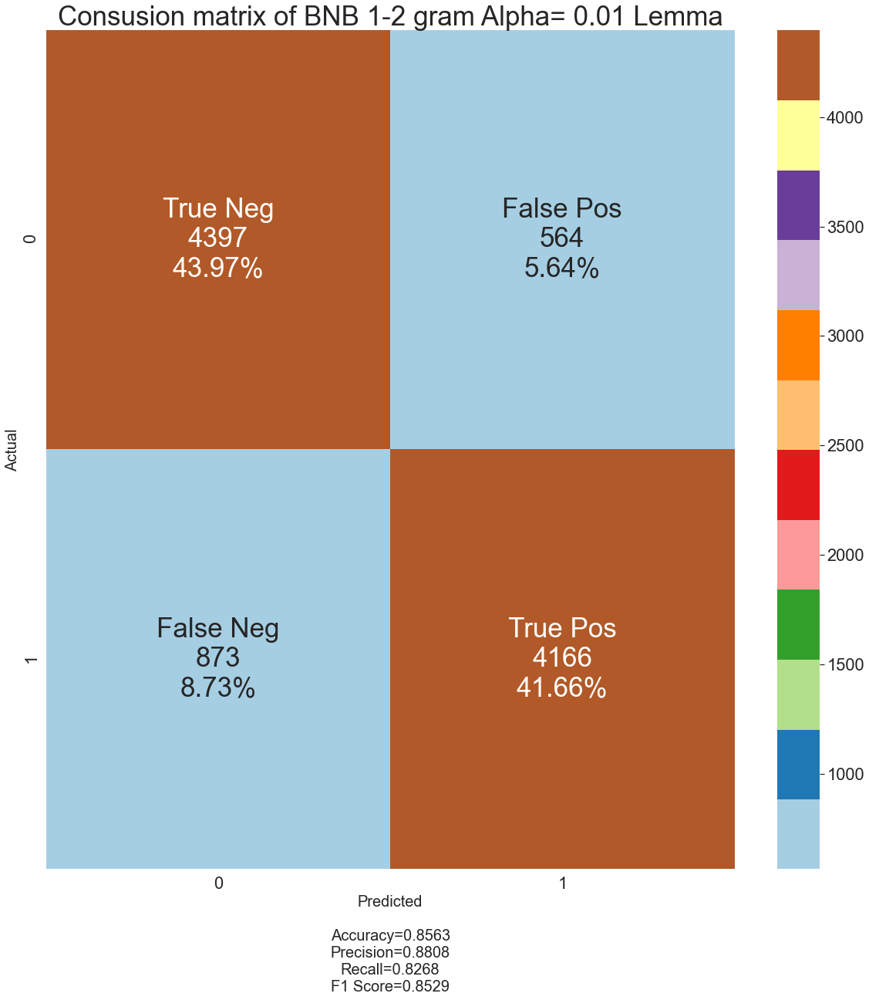

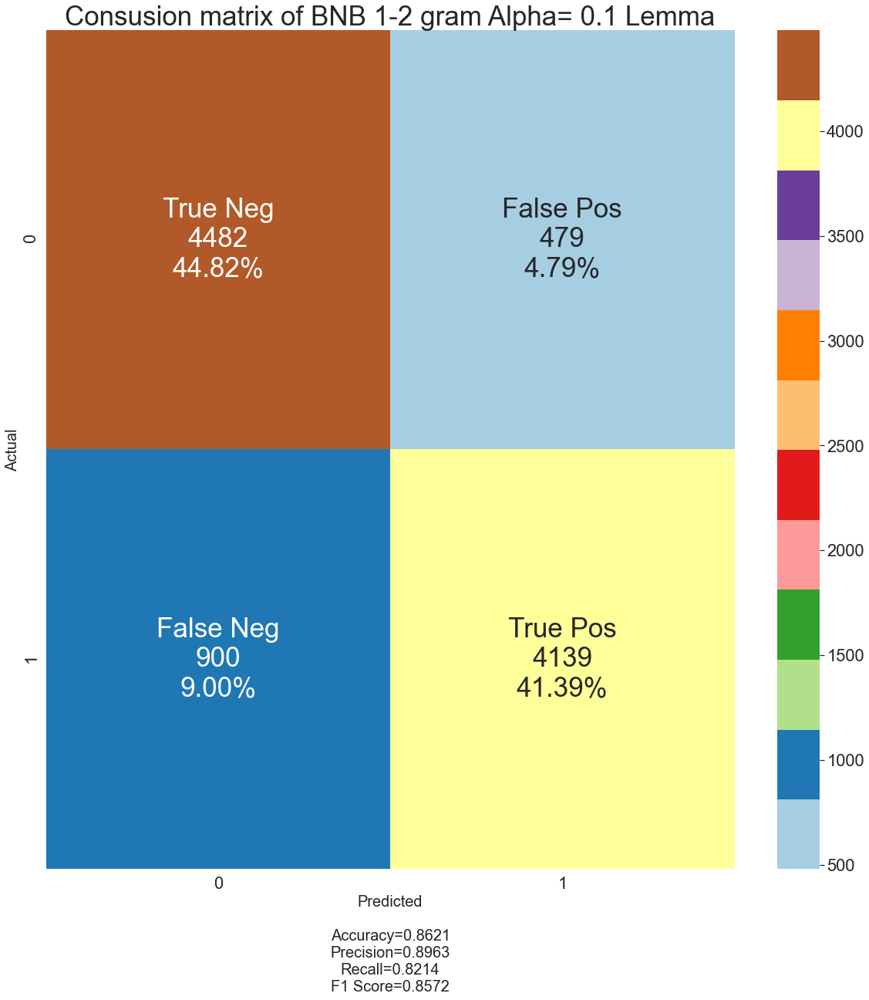

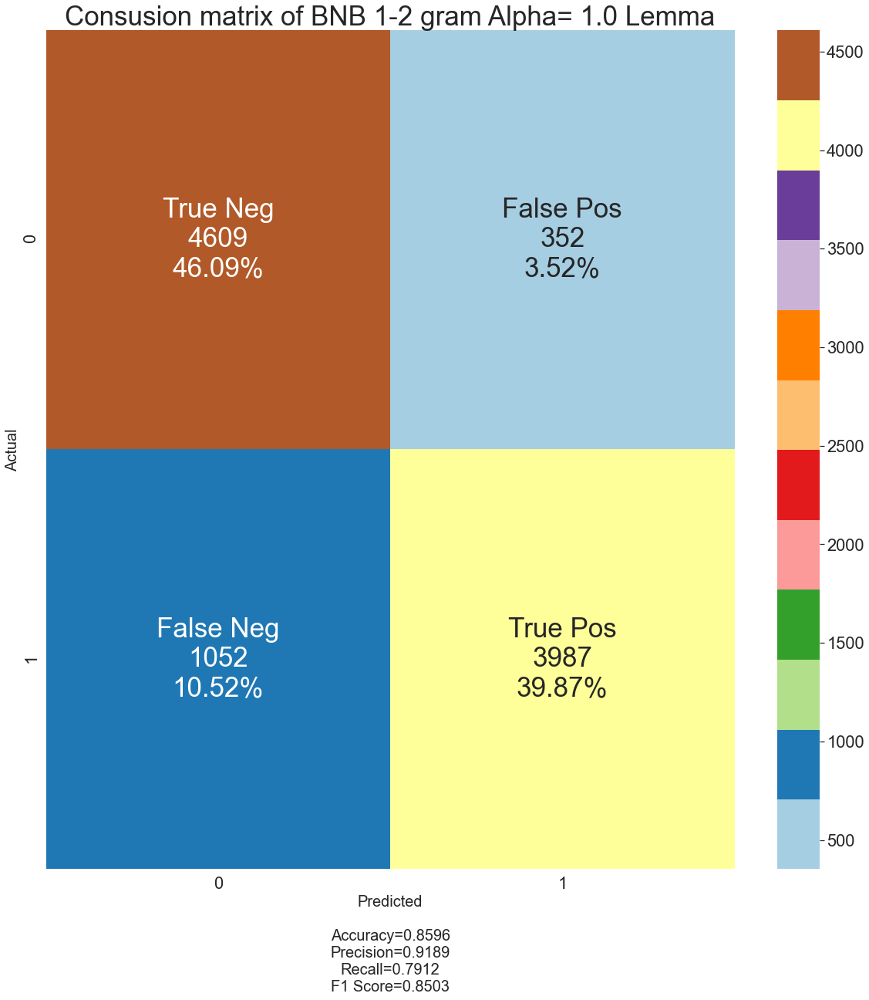

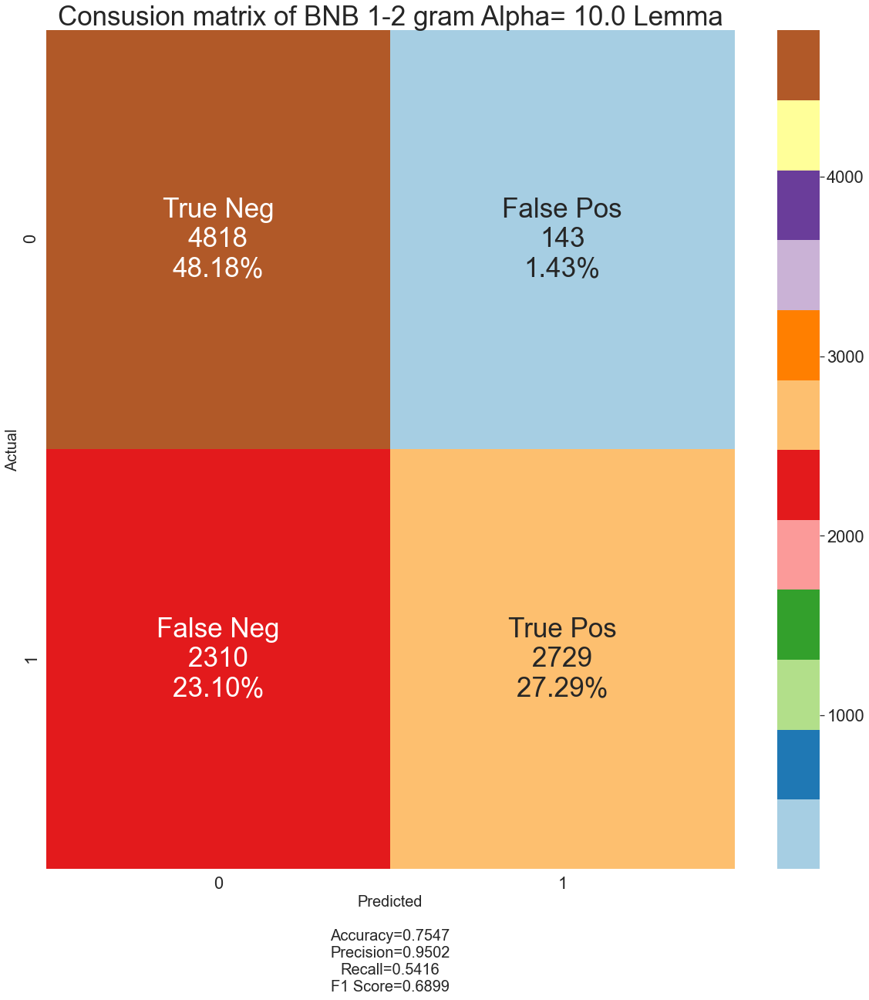

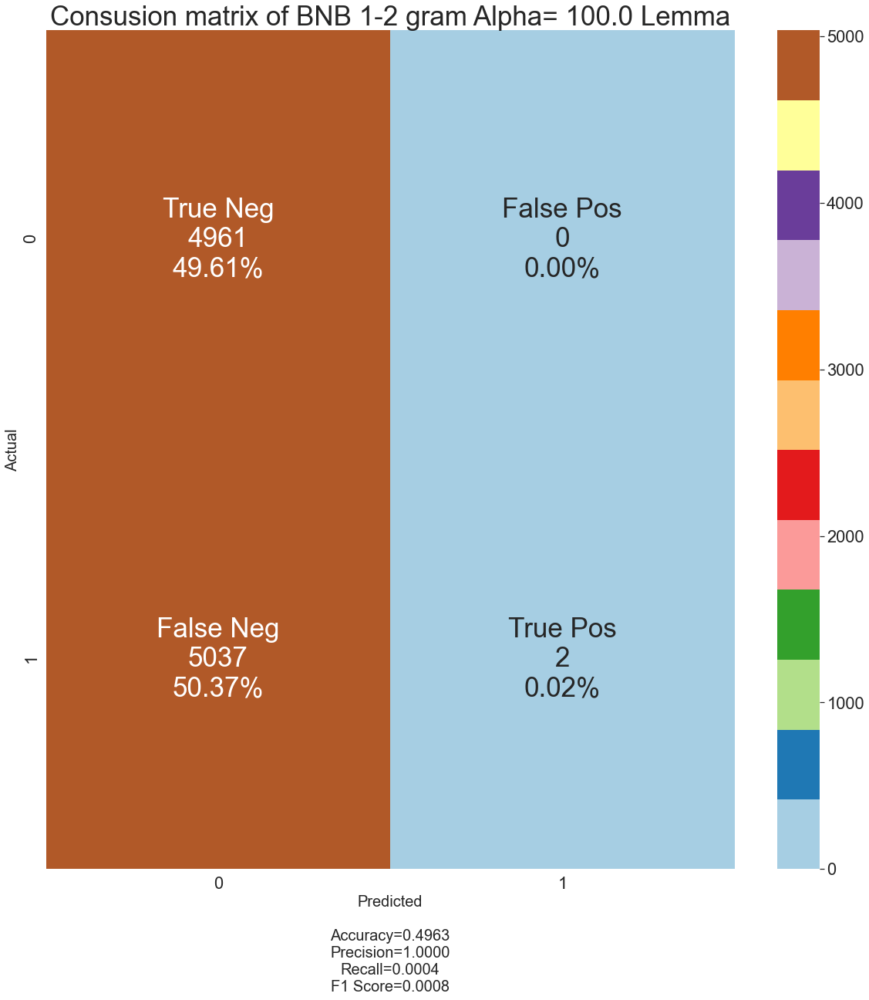

h:\projects\environment\tensorflow2.4\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-539-bc7732bd5ec7>:63: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP+FP)


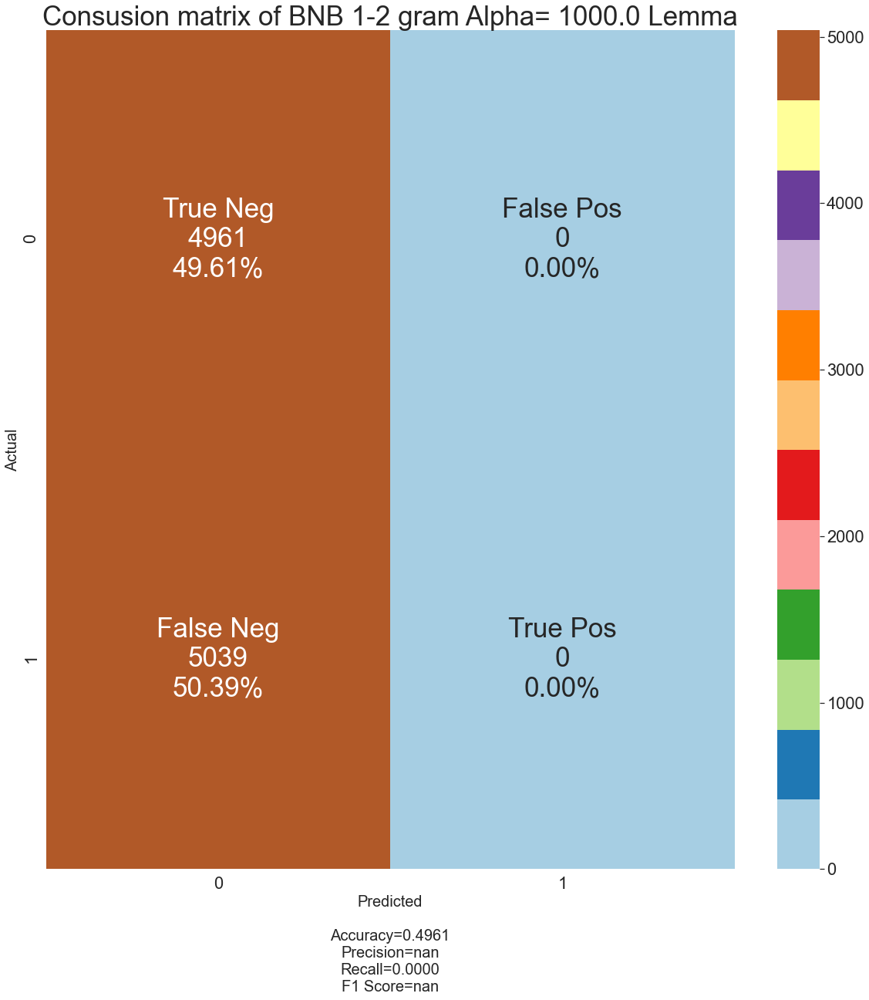

h:\projects\environment\tensorflow2.4\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-539-bc7732bd5ec7>:63: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP+FP)


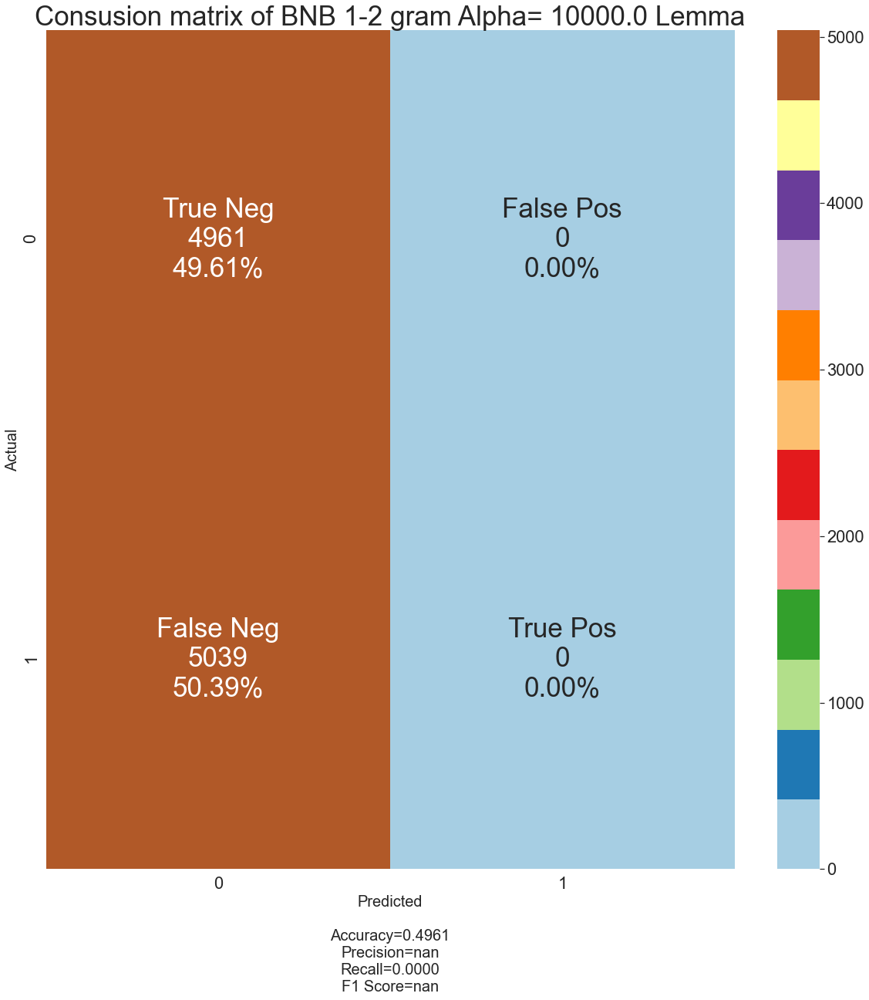

******************************
Finish BNB 1-2 grams


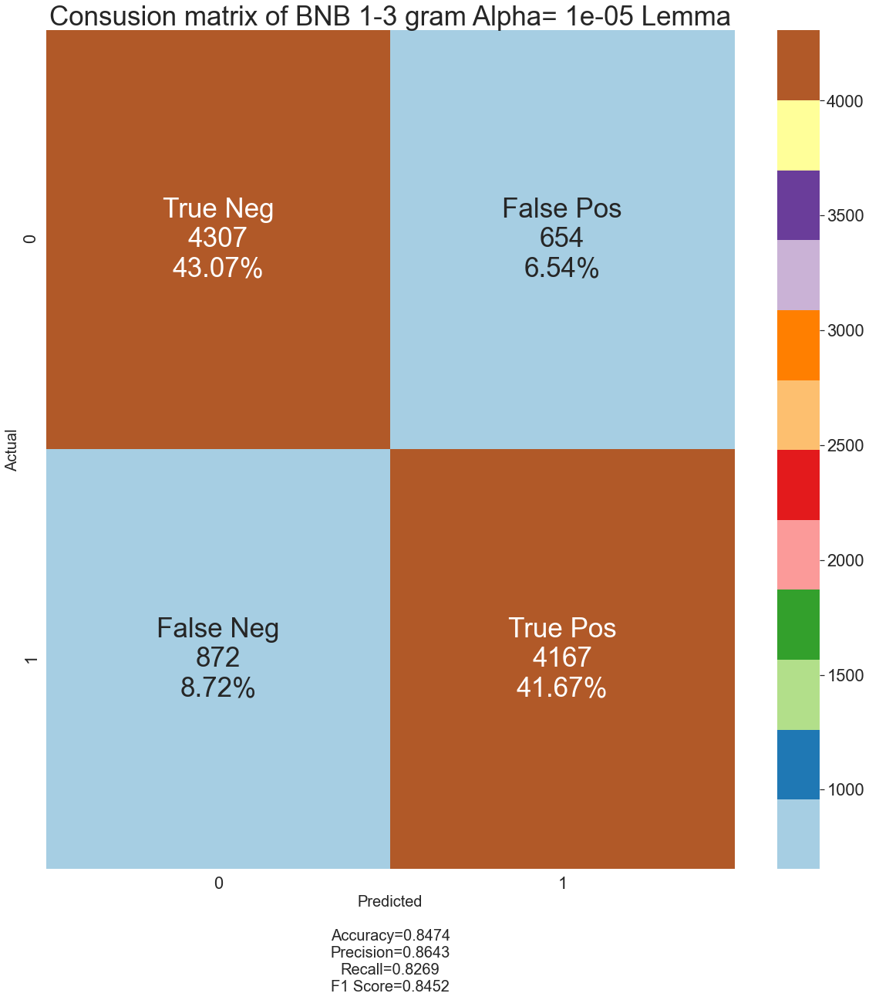

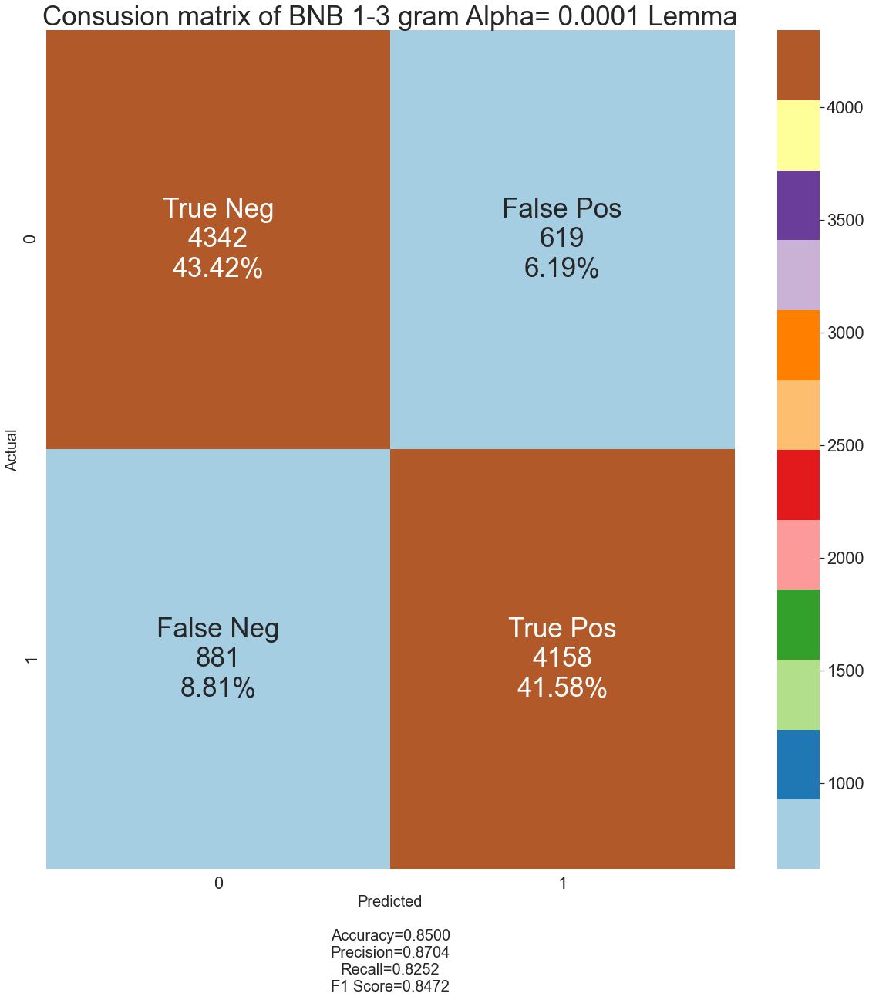

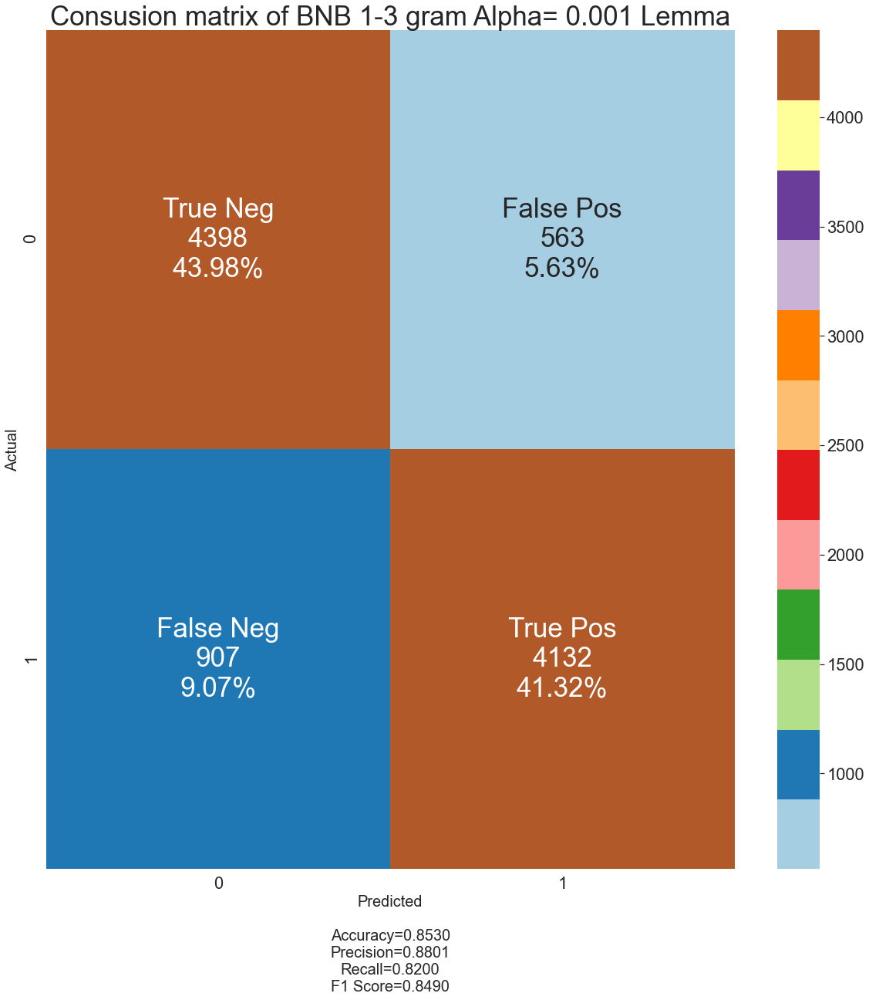

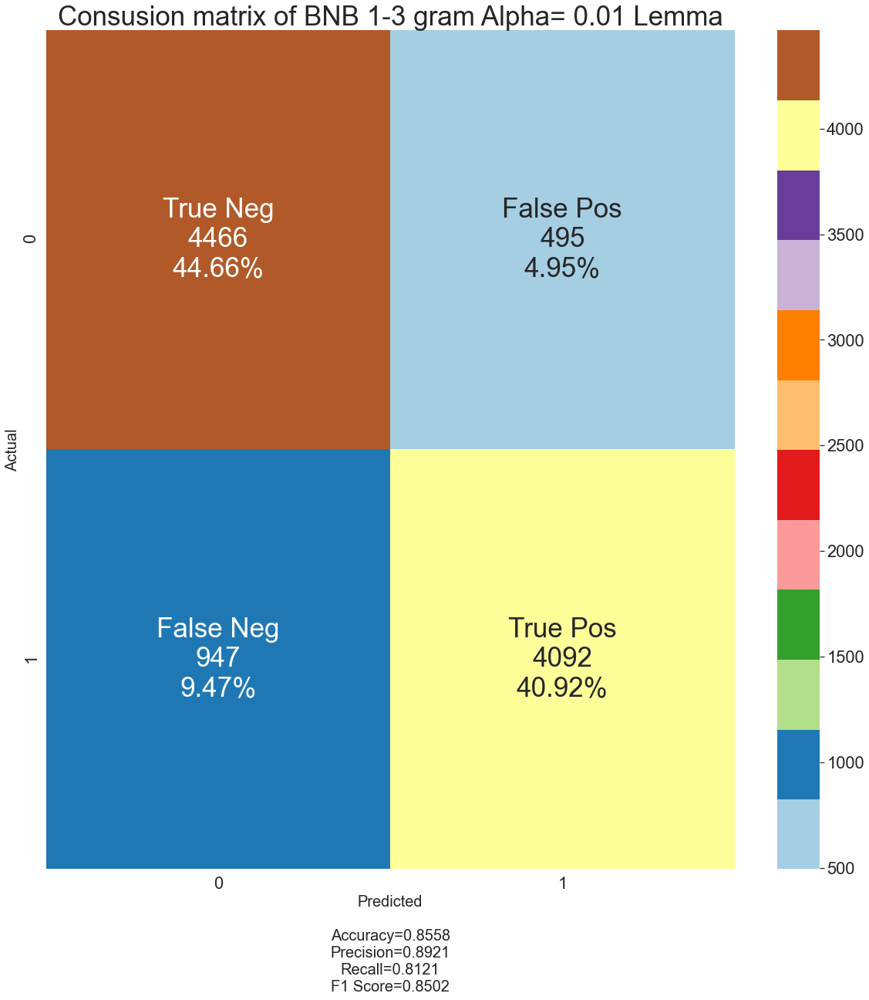

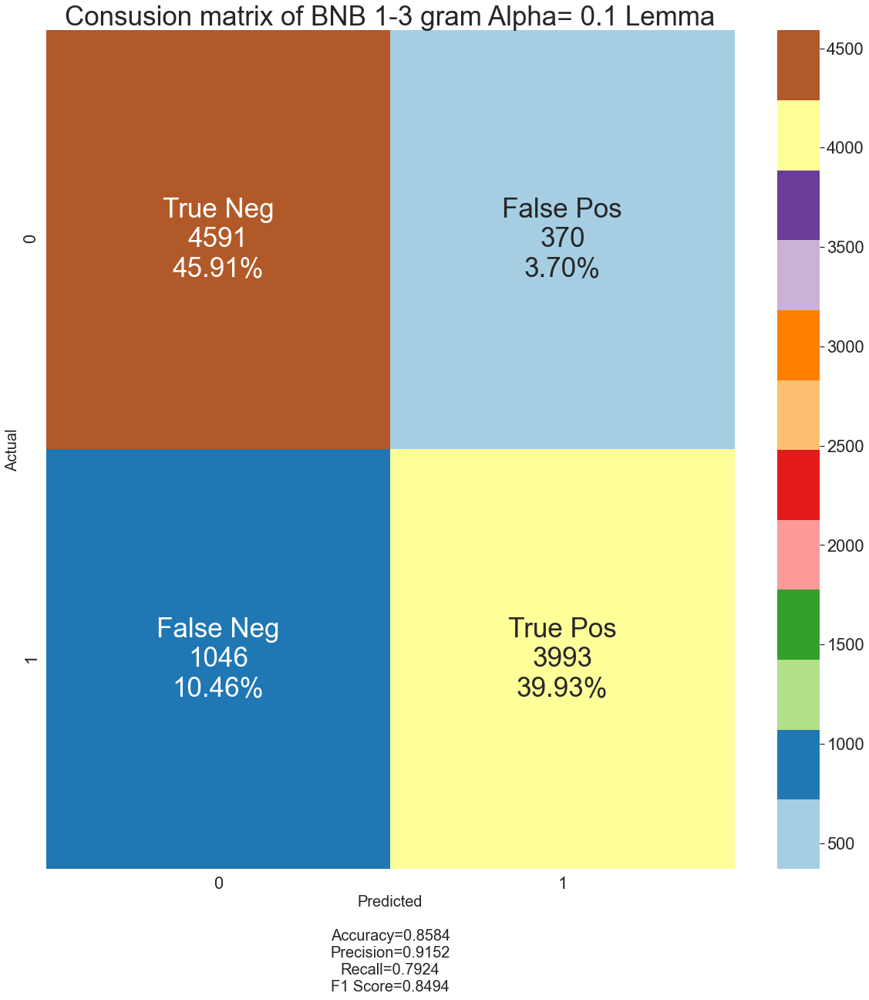

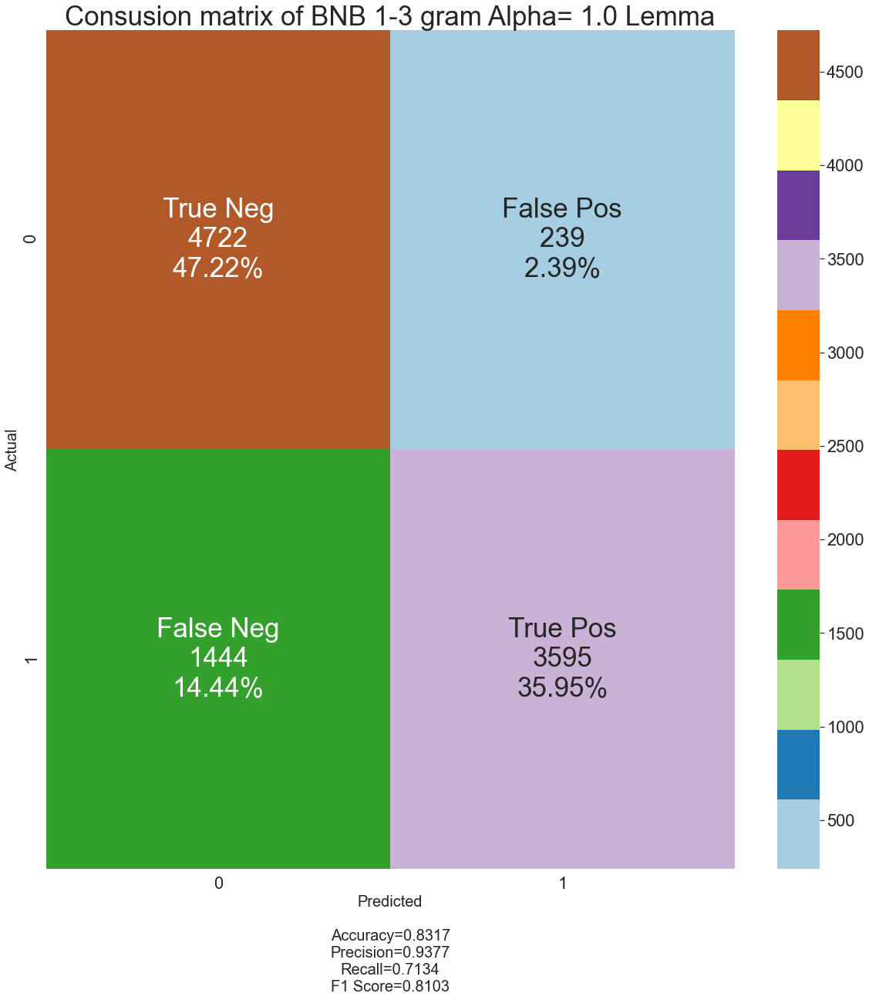

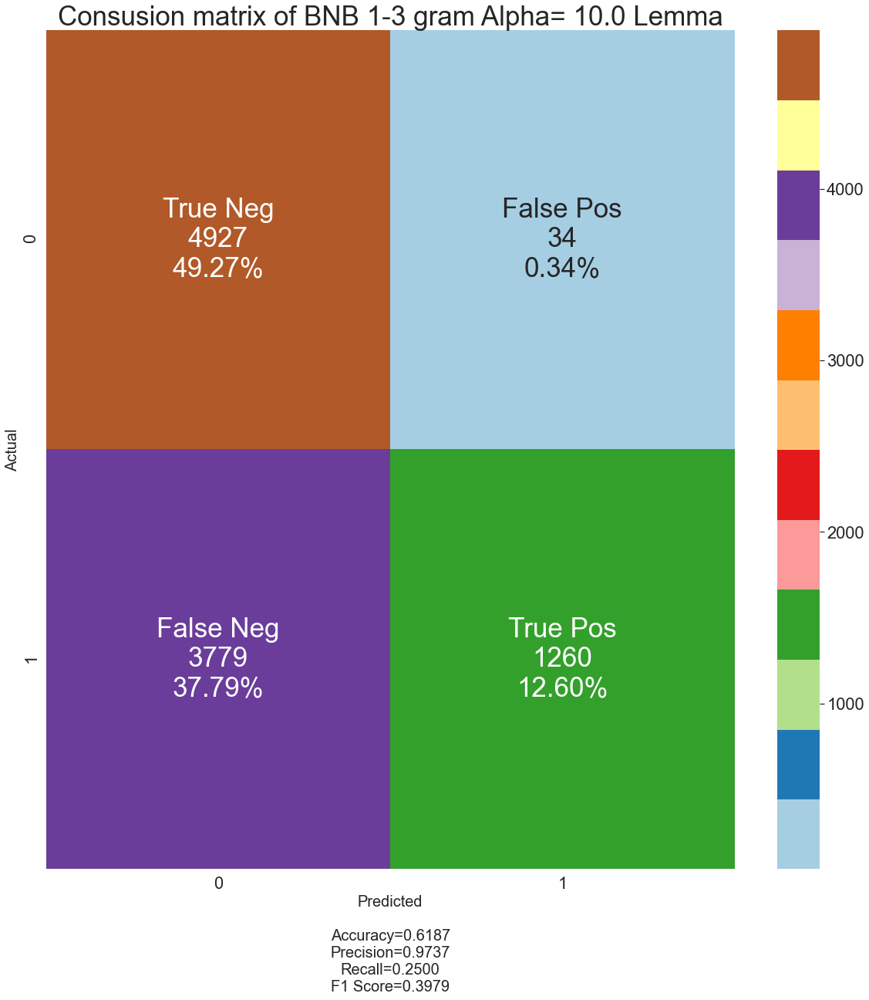

h:\projects\environment\tensorflow2.4\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-539-bc7732bd5ec7>:63: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP+FP)


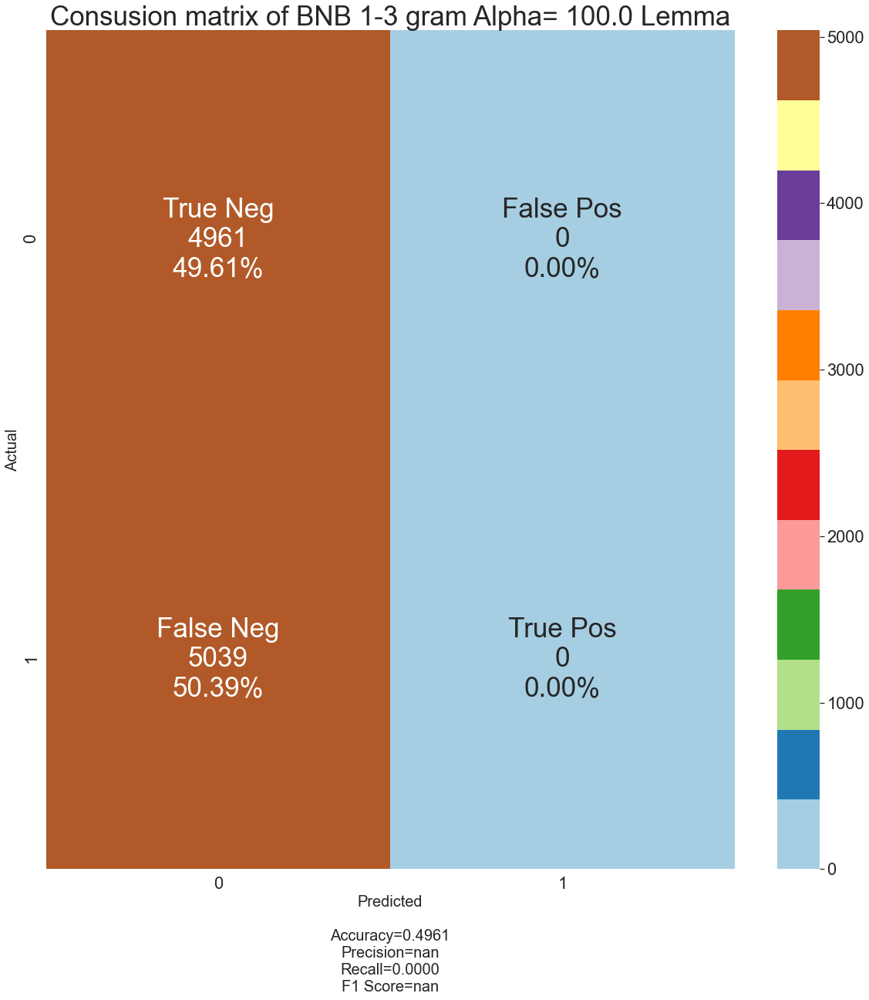

h:\projects\environment\tensorflow2.4\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-539-bc7732bd5ec7>:63: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP+FP)


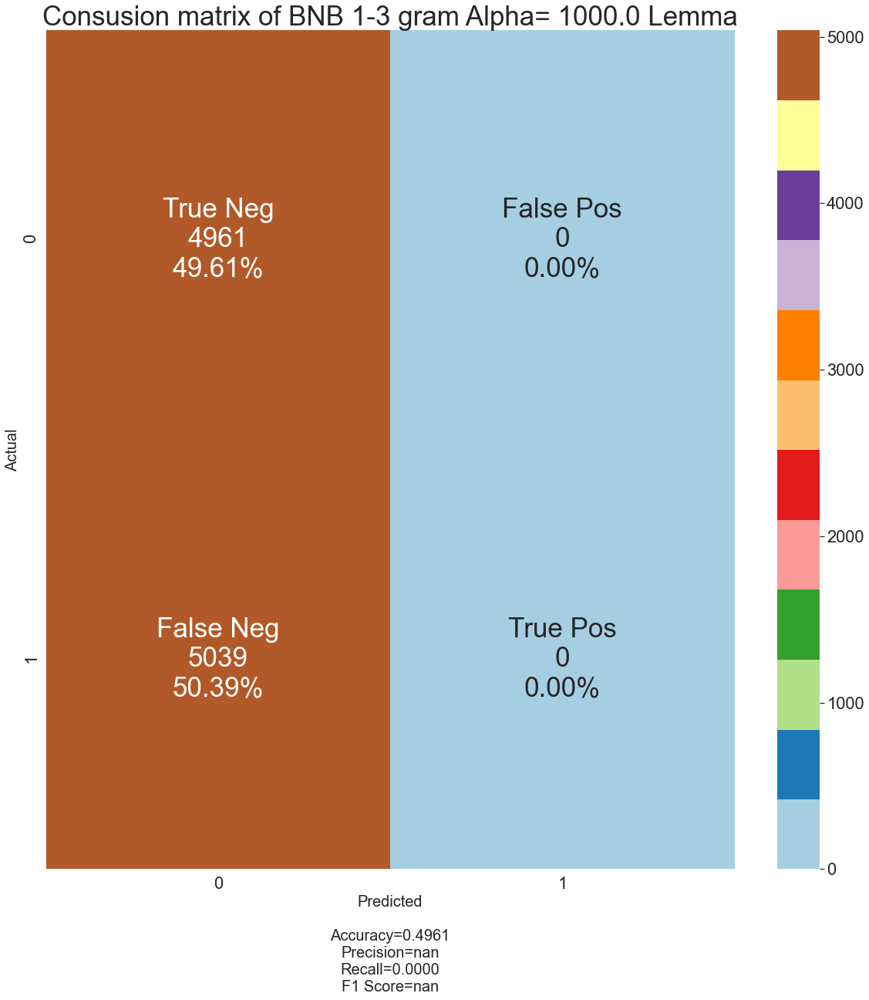

h:\projects\environment\tensorflow2.4\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-539-bc7732bd5ec7>:63: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP+FP)


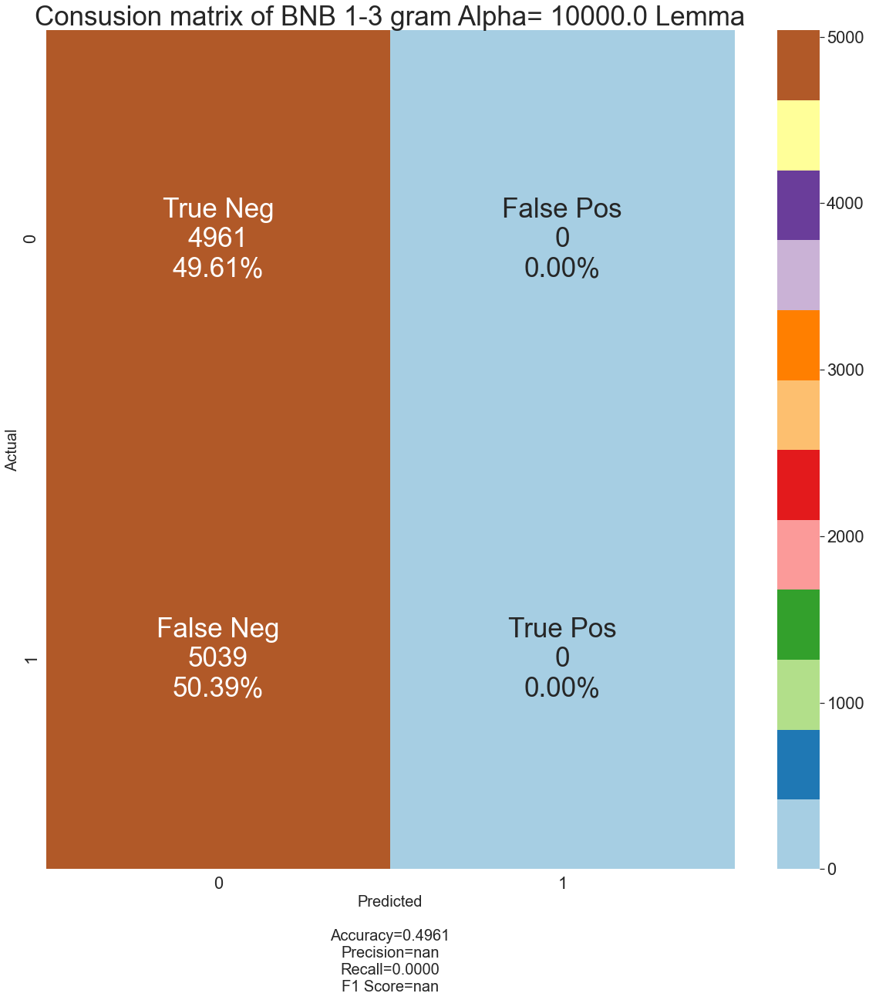

******************************
Finish BNB 1-3 grams


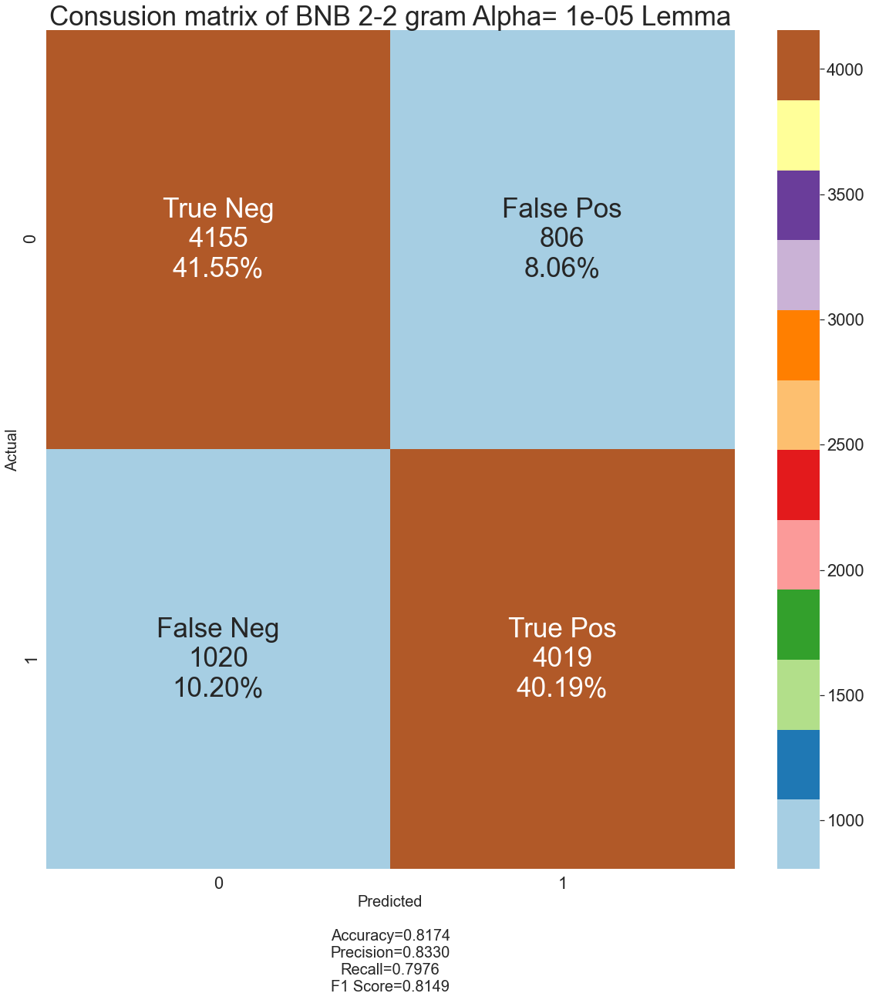

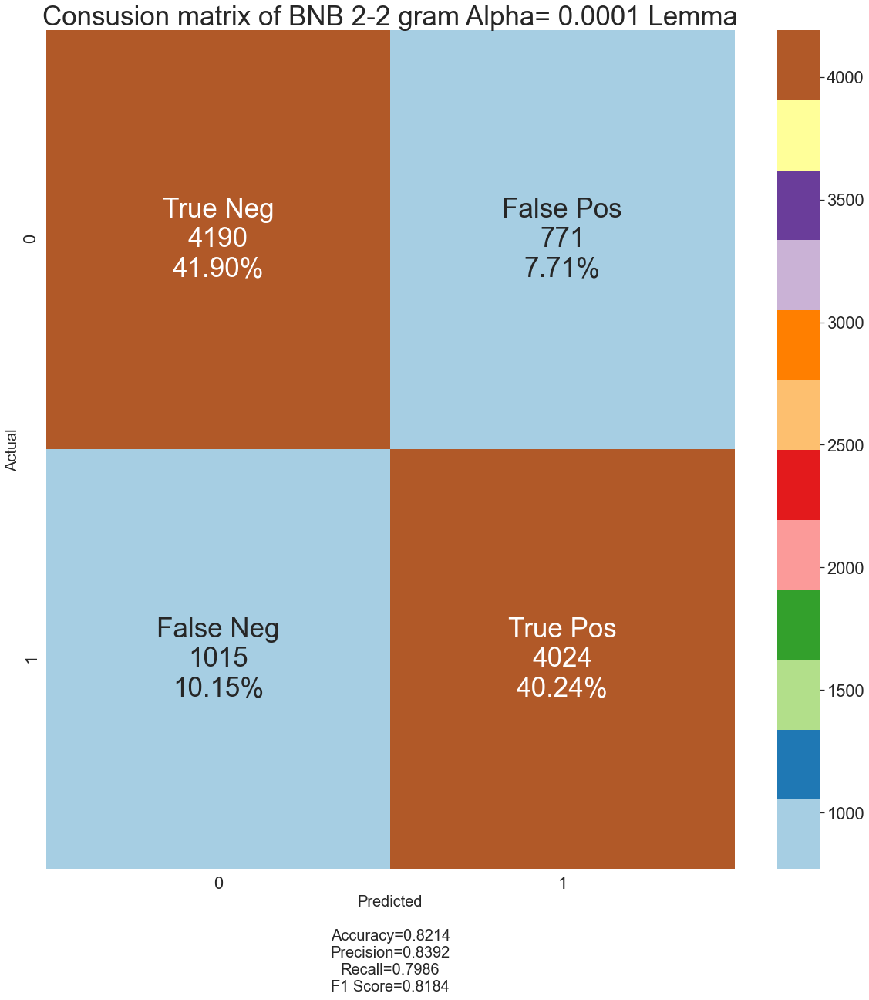

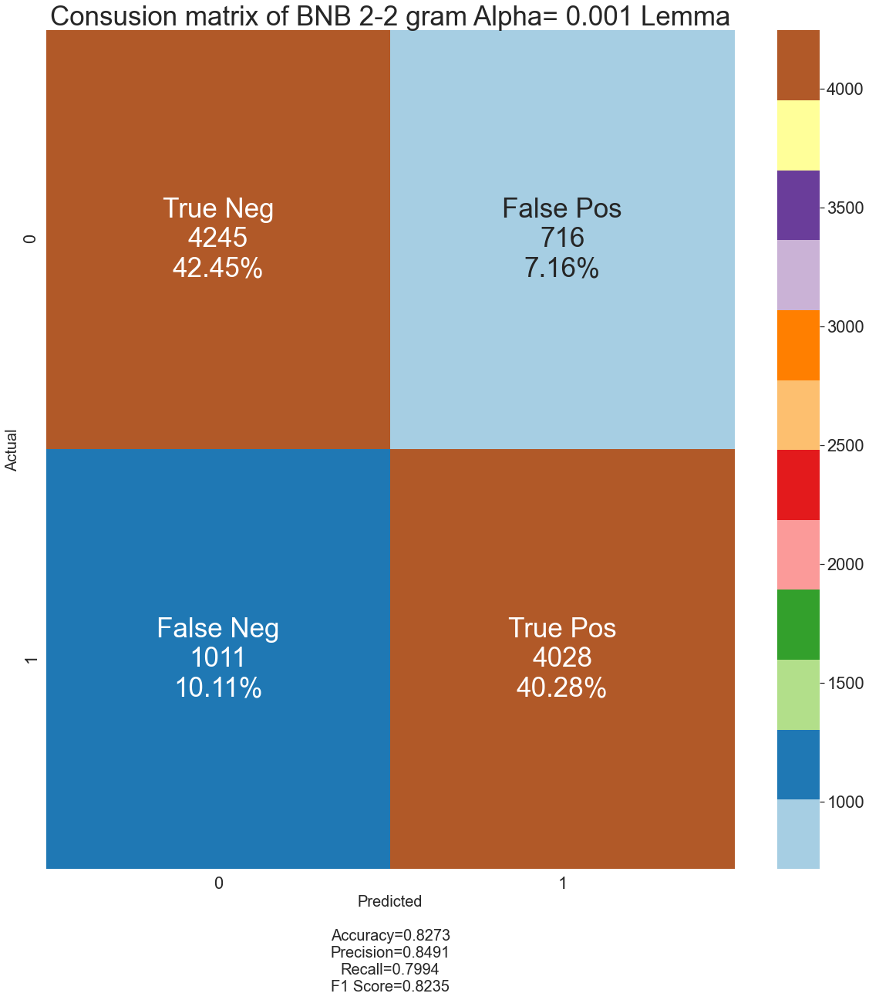

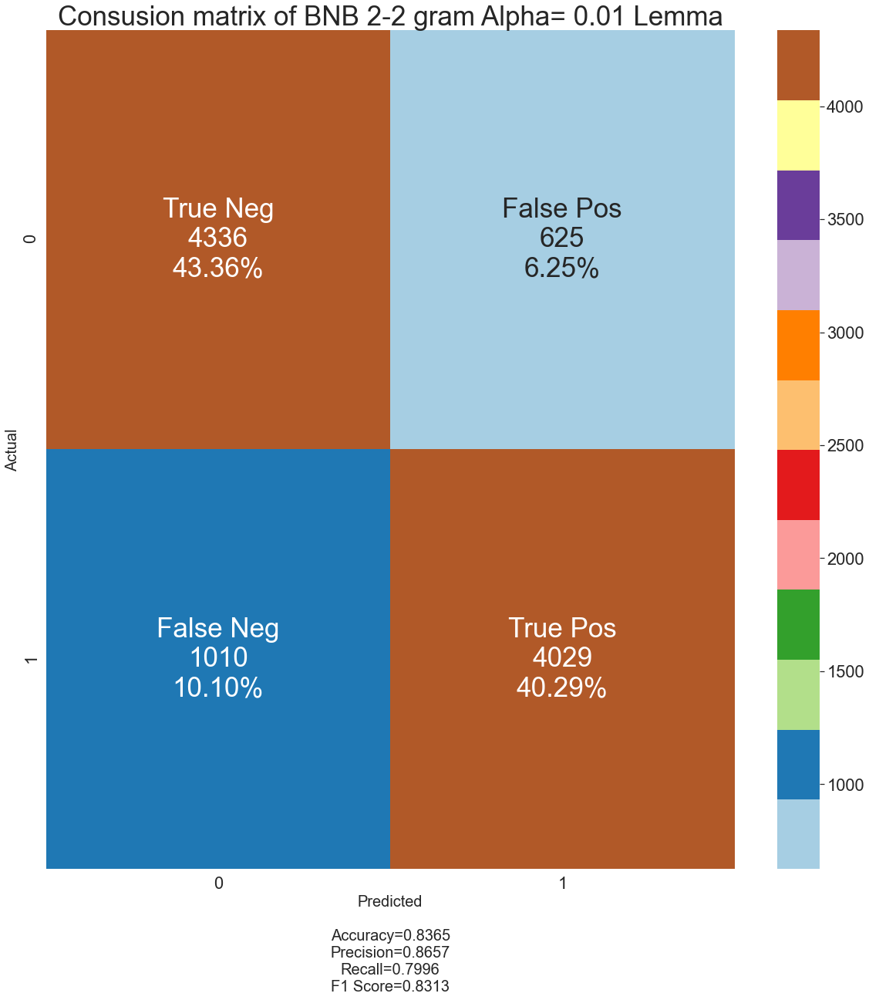

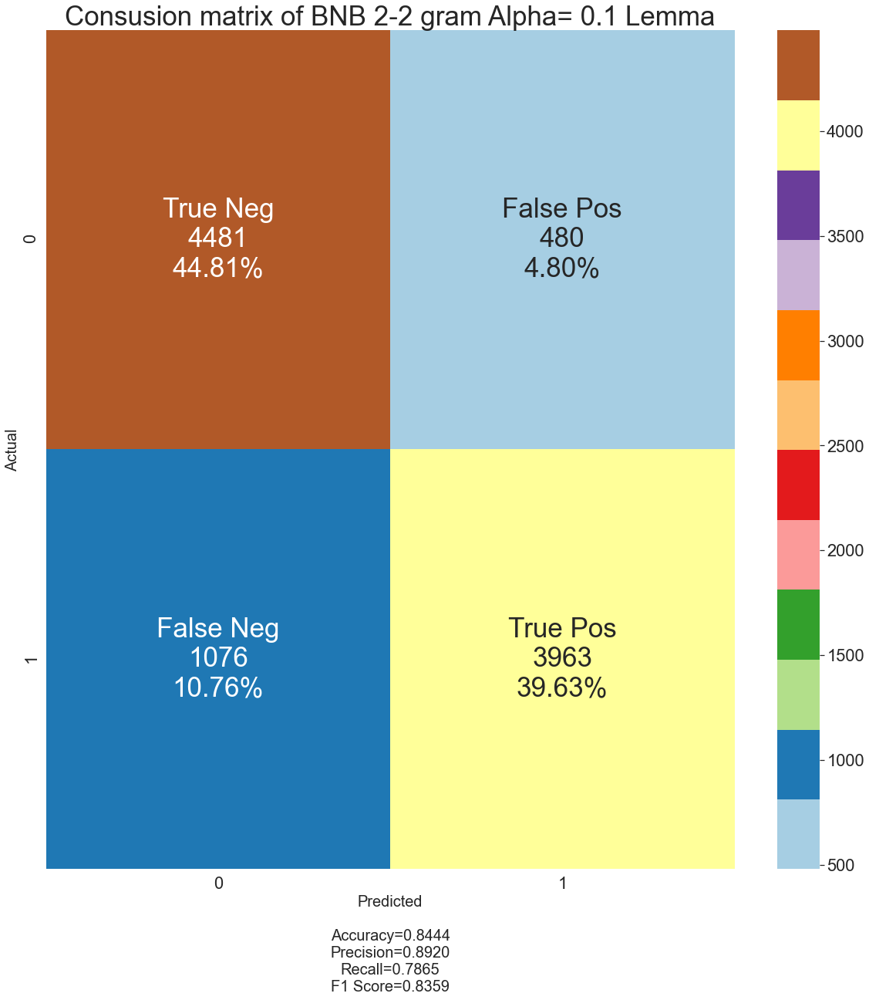

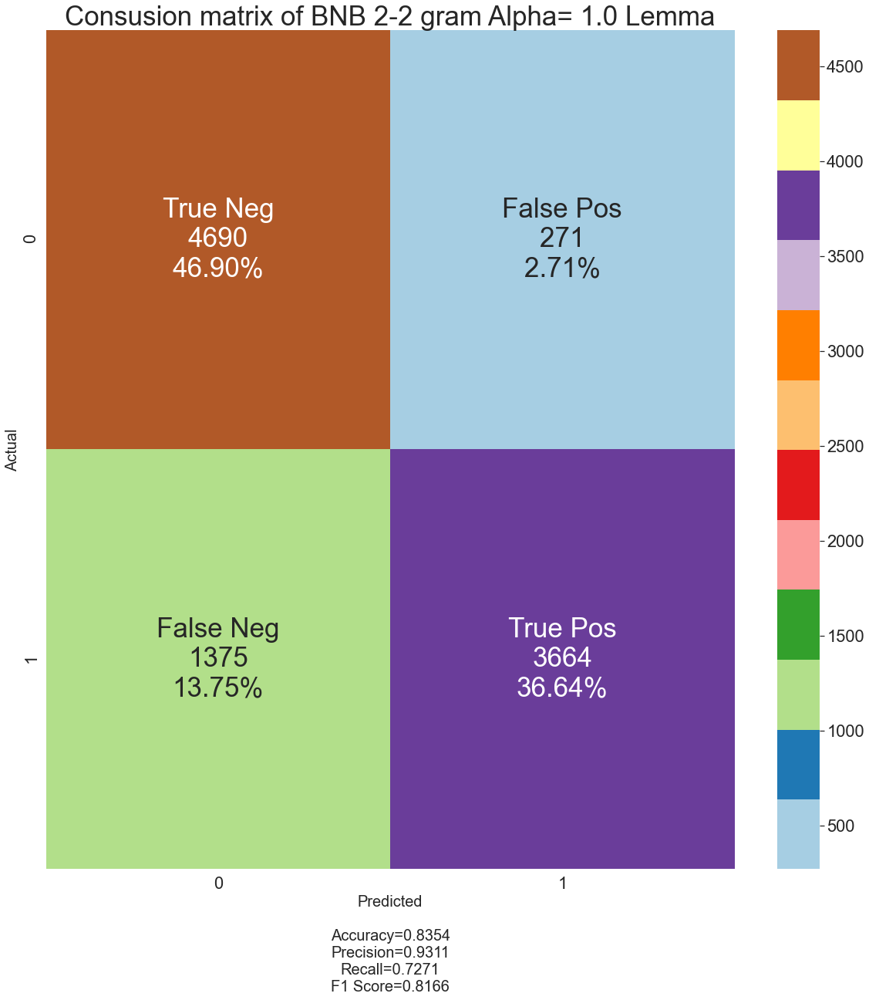

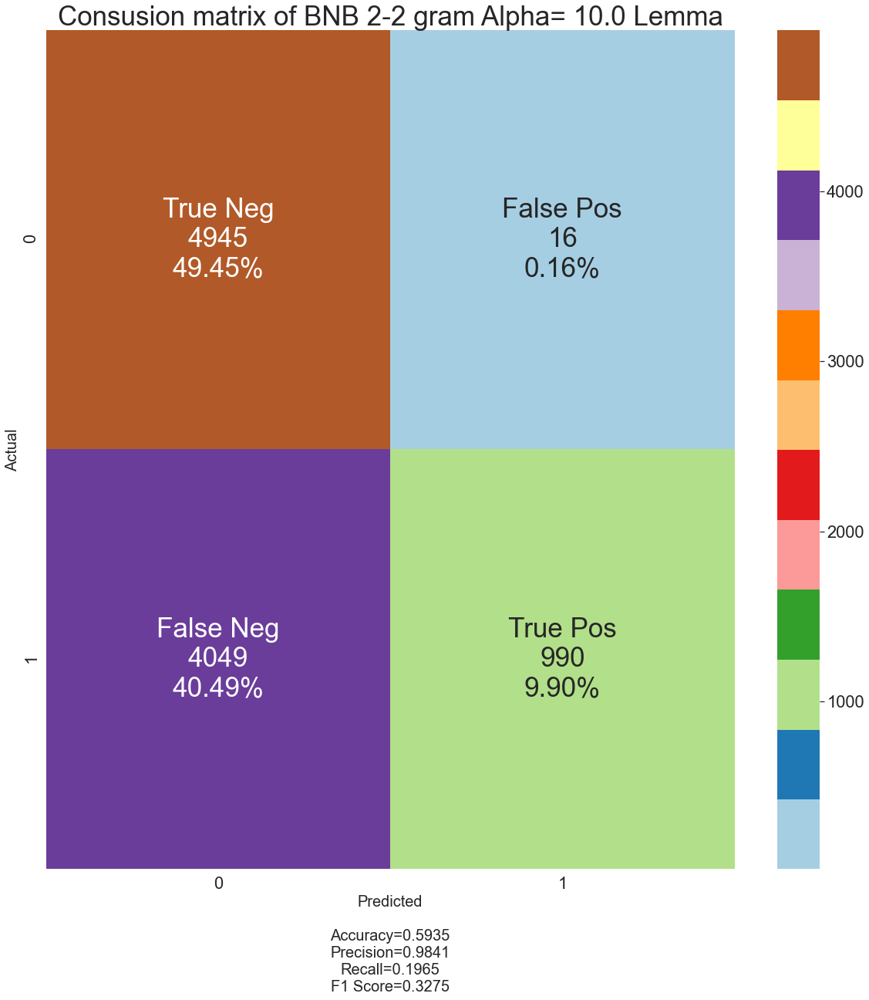

h:\projects\environment\tensorflow2.4\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-539-bc7732bd5ec7>:63: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP+FP)


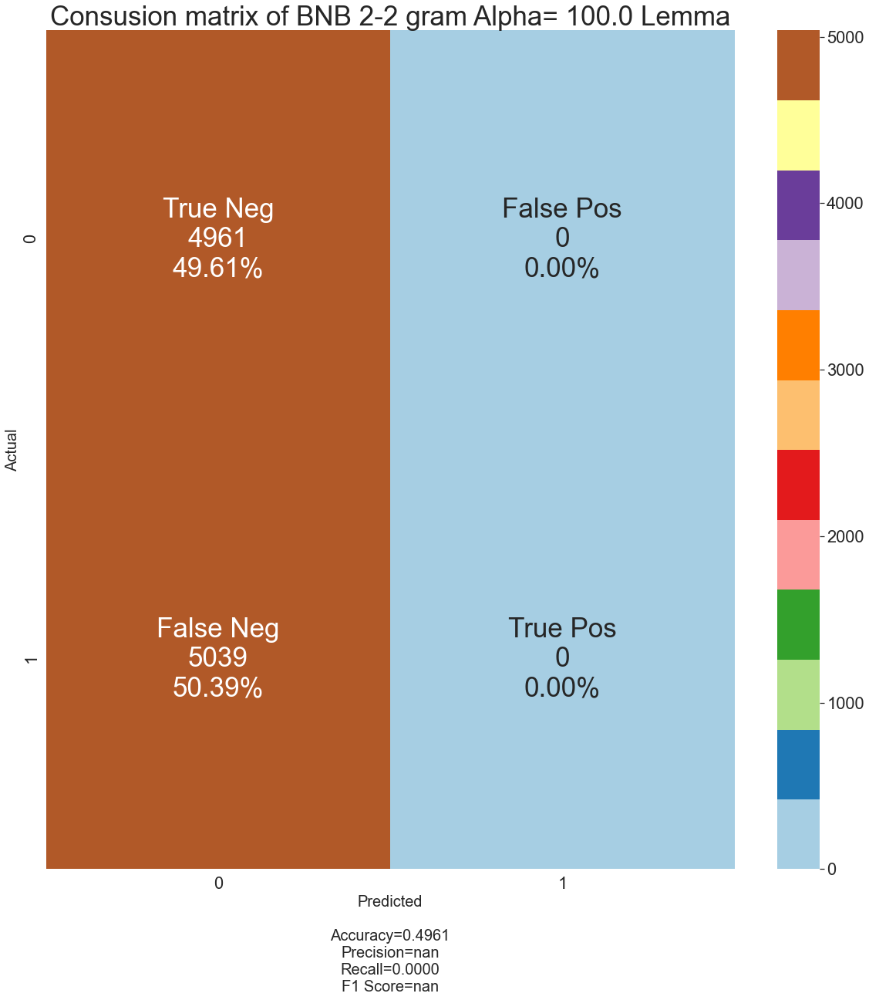

h:\projects\environment\tensorflow2.4\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-539-bc7732bd5ec7>:63: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP+FP)


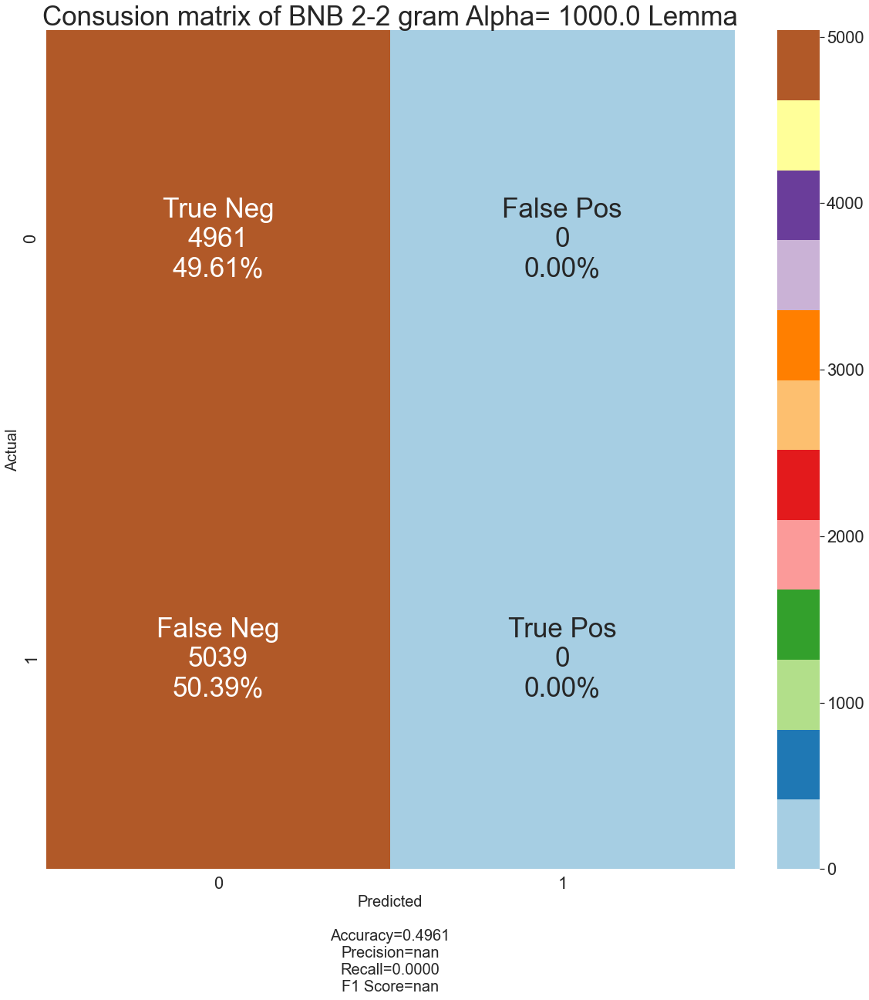

h:\projects\environment\tensorflow2.4\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-539-bc7732bd5ec7>:63: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP+FP)


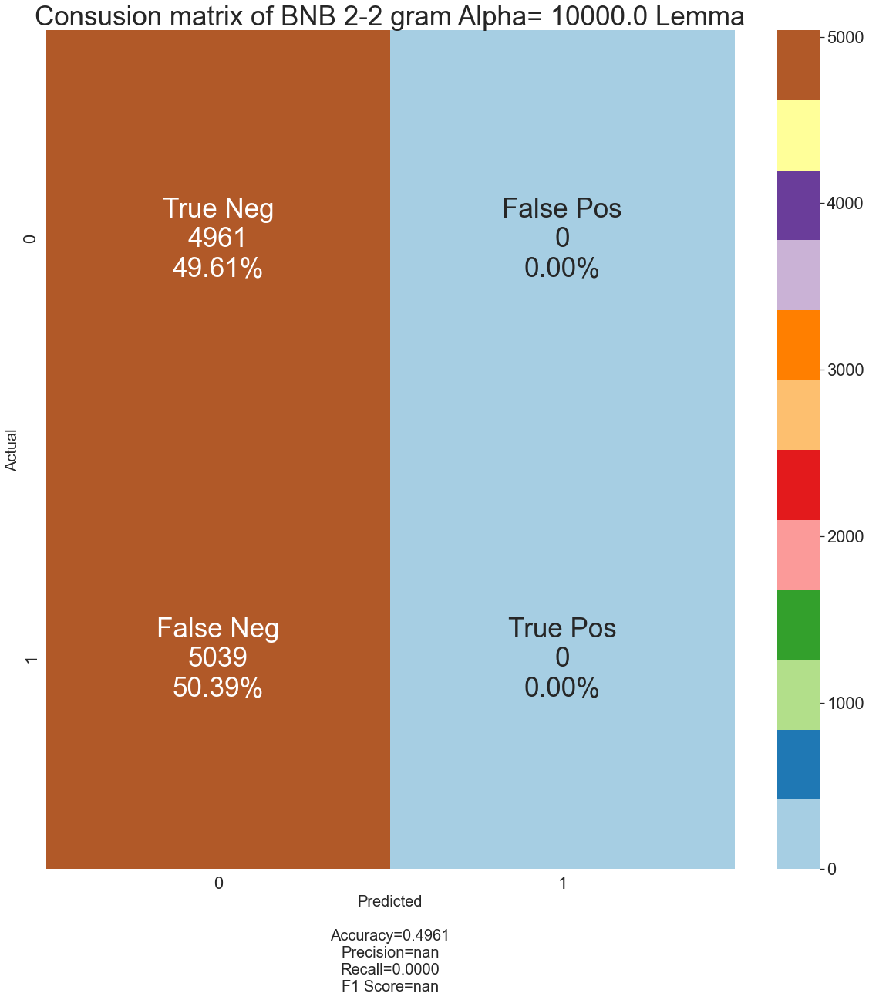

******************************
Finish BNB 2-2 grams


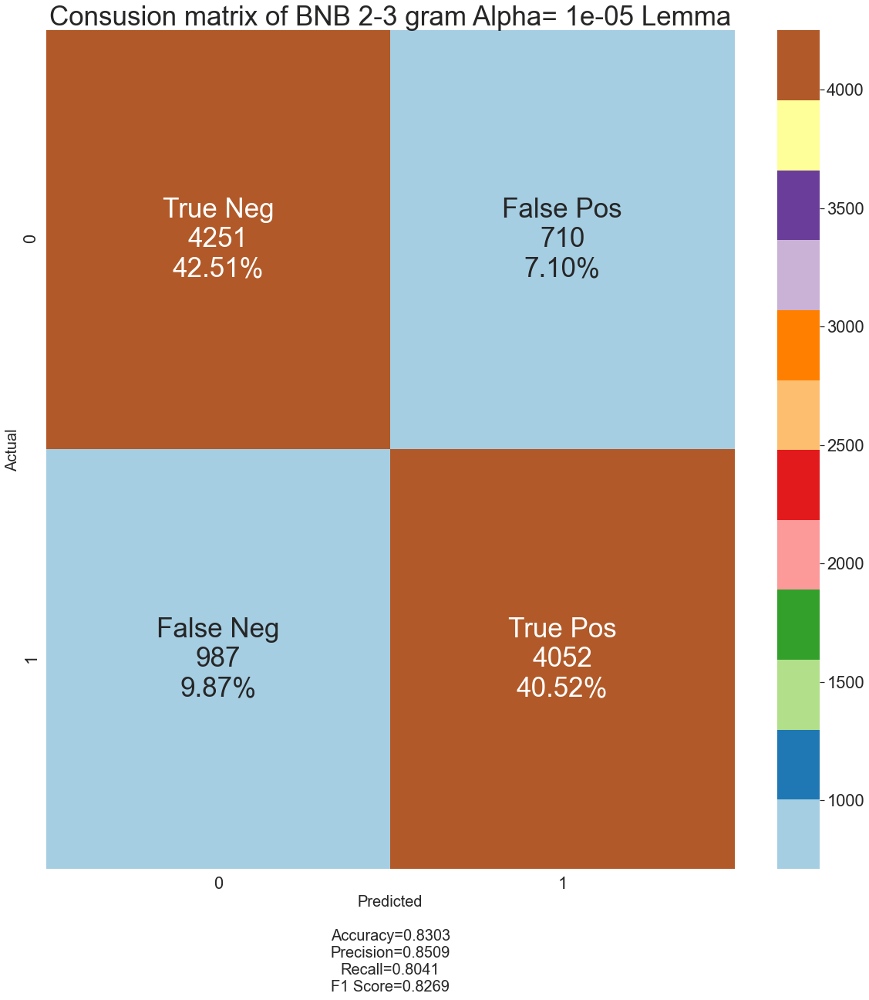

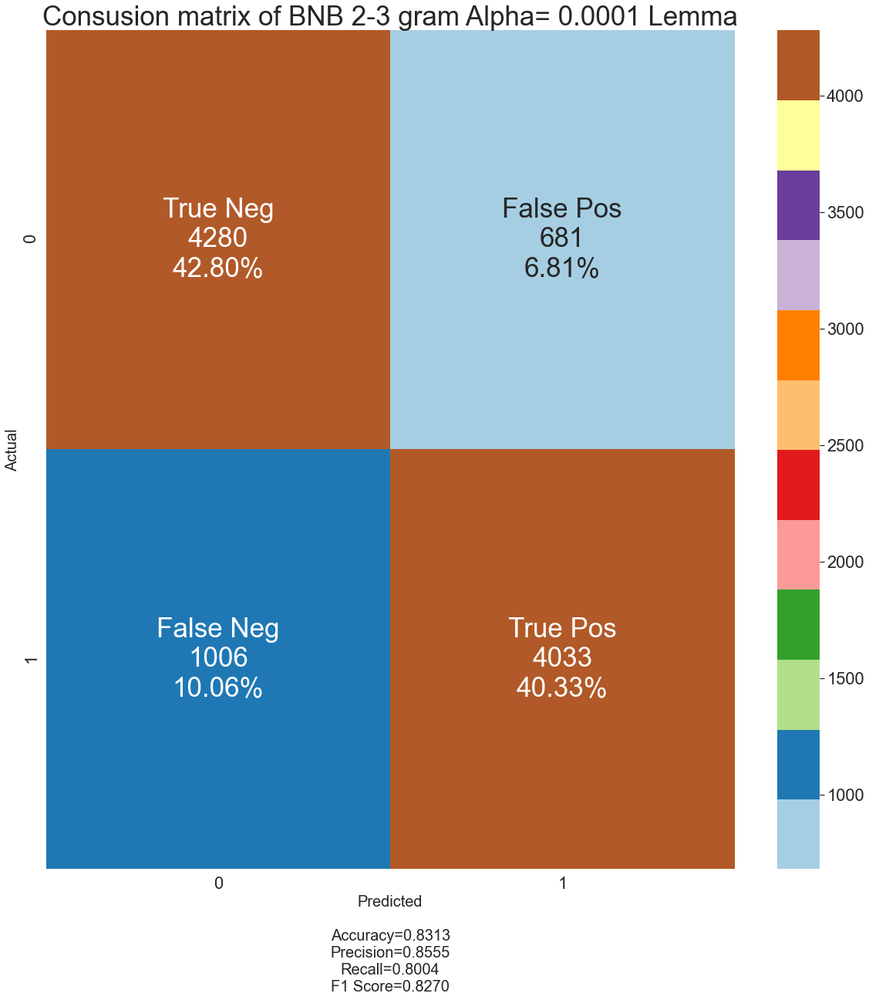

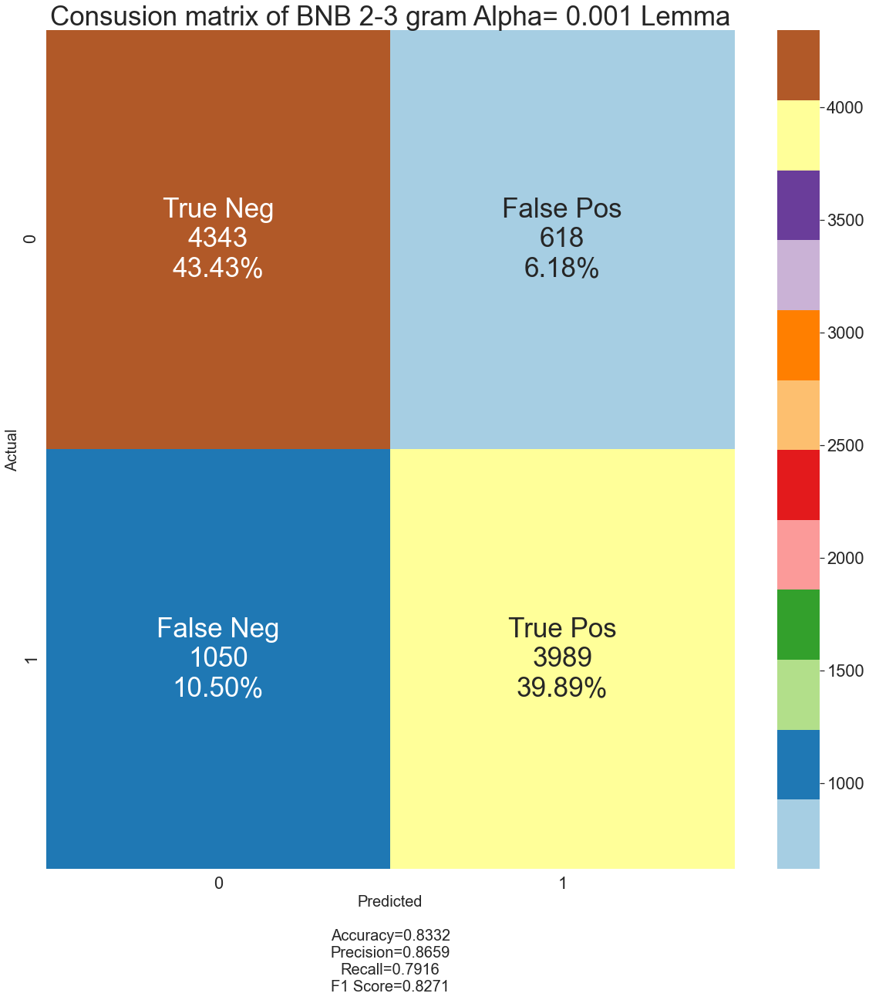

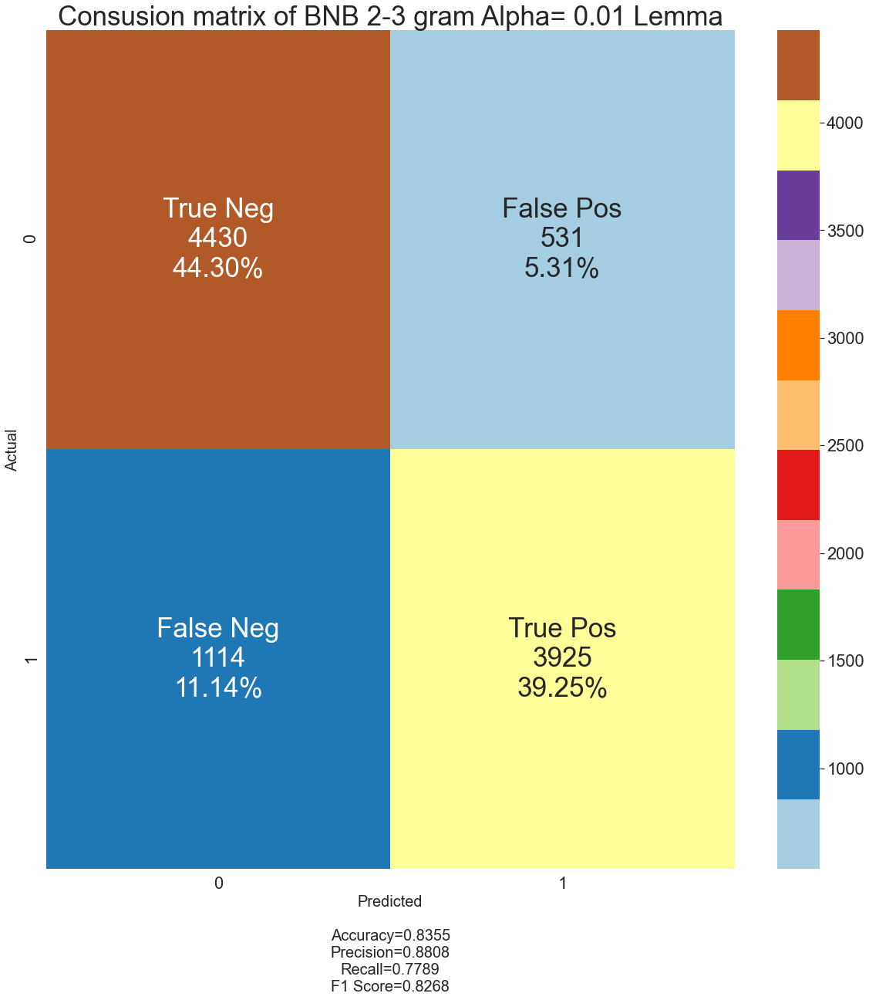

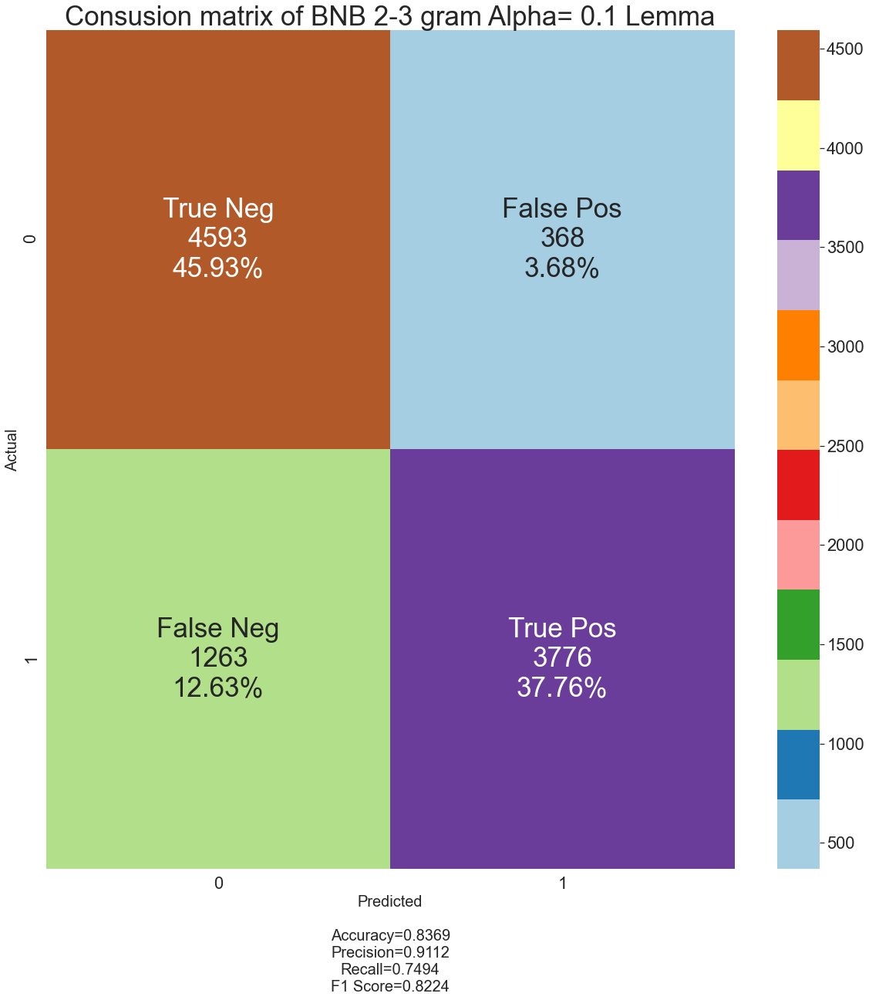

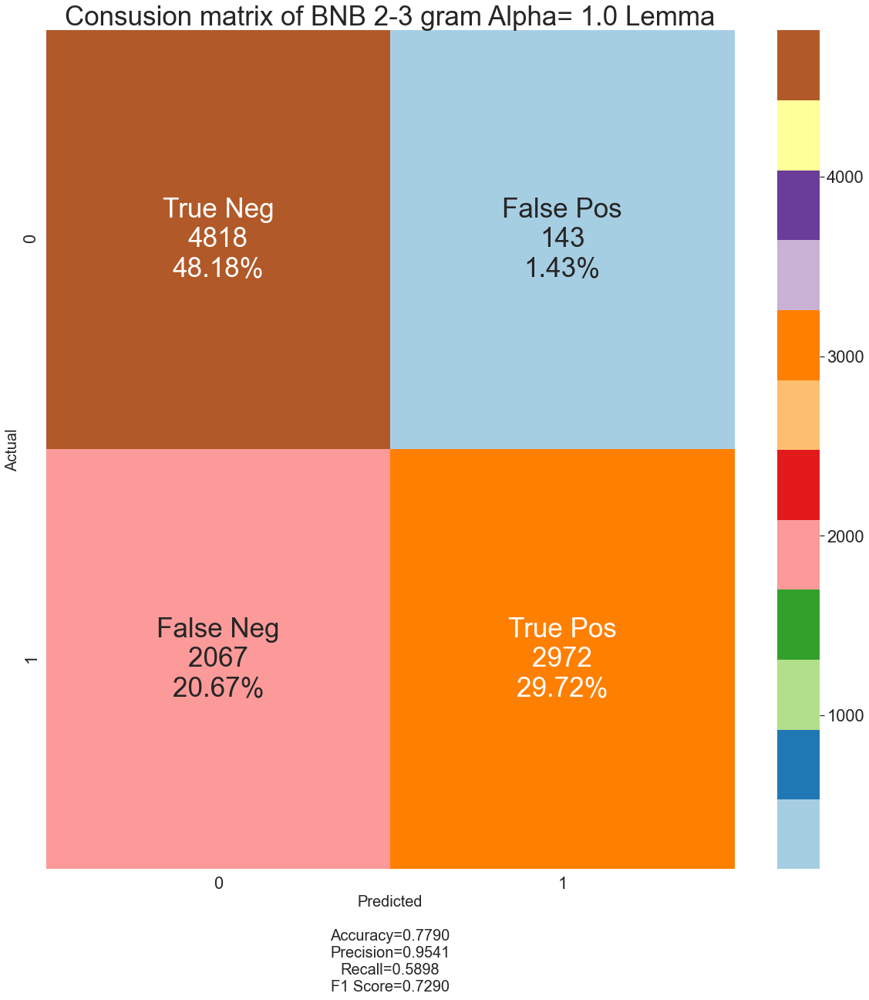

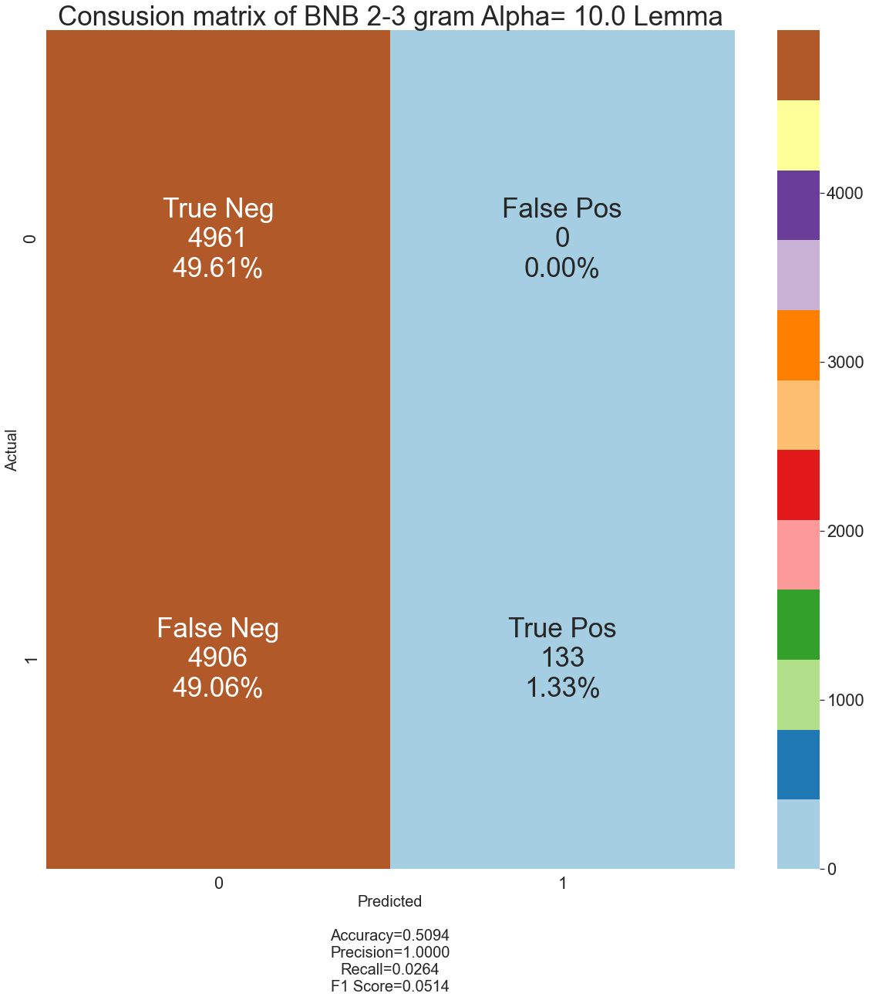

h:\projects\environment\tensorflow2.4\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-539-bc7732bd5ec7>:63: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP+FP)


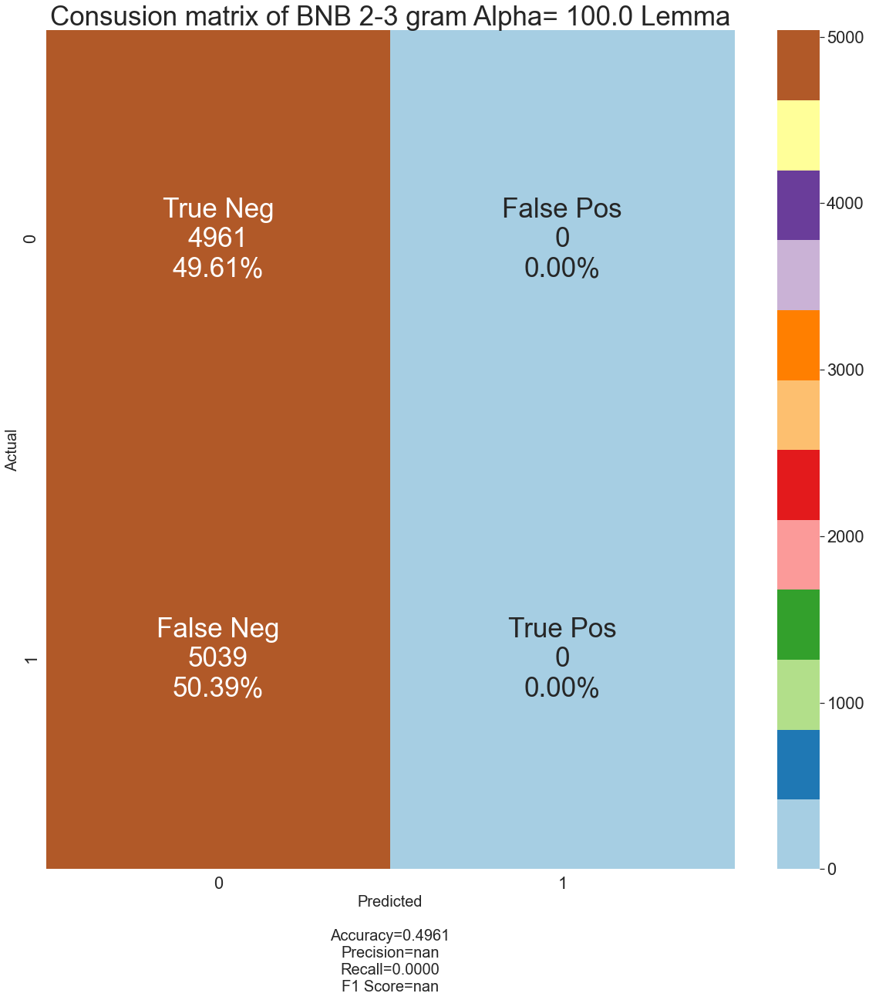

h:\projects\environment\tensorflow2.4\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-539-bc7732bd5ec7>:63: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP+FP)


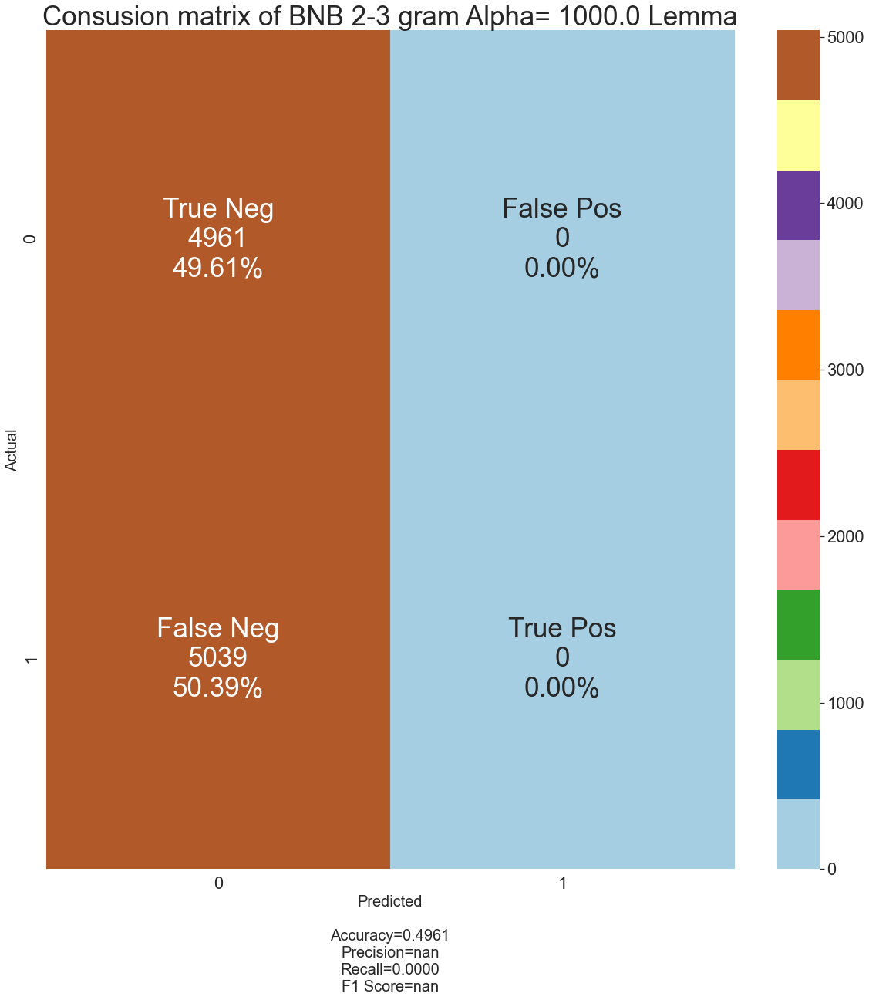

h:\projects\environment\tensorflow2.4\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-539-bc7732bd5ec7>:63: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP+FP)


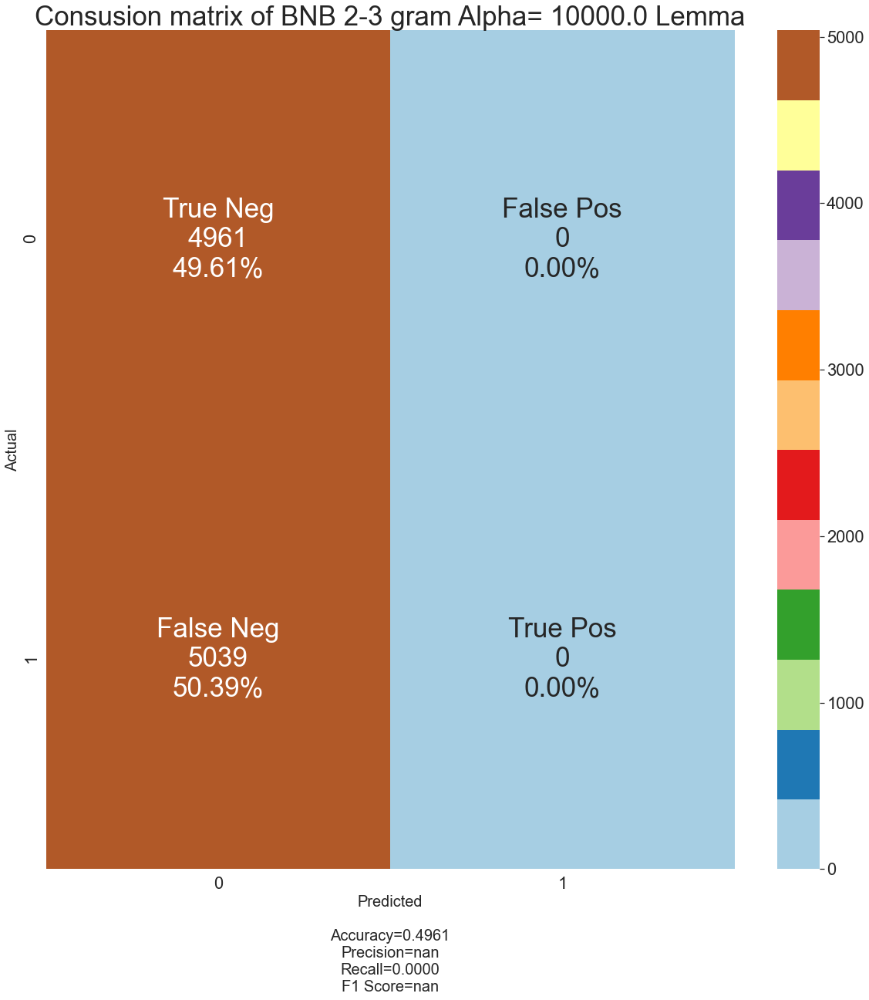

******************************
Finish BNB 2-3 grams


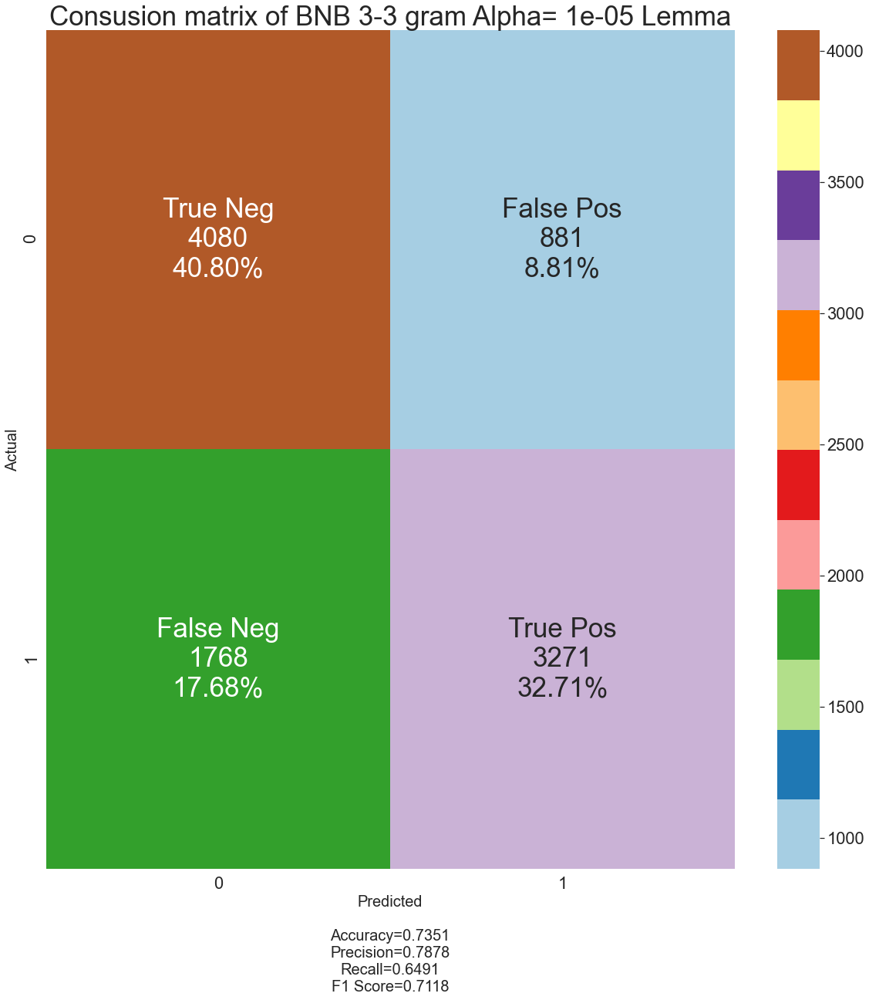

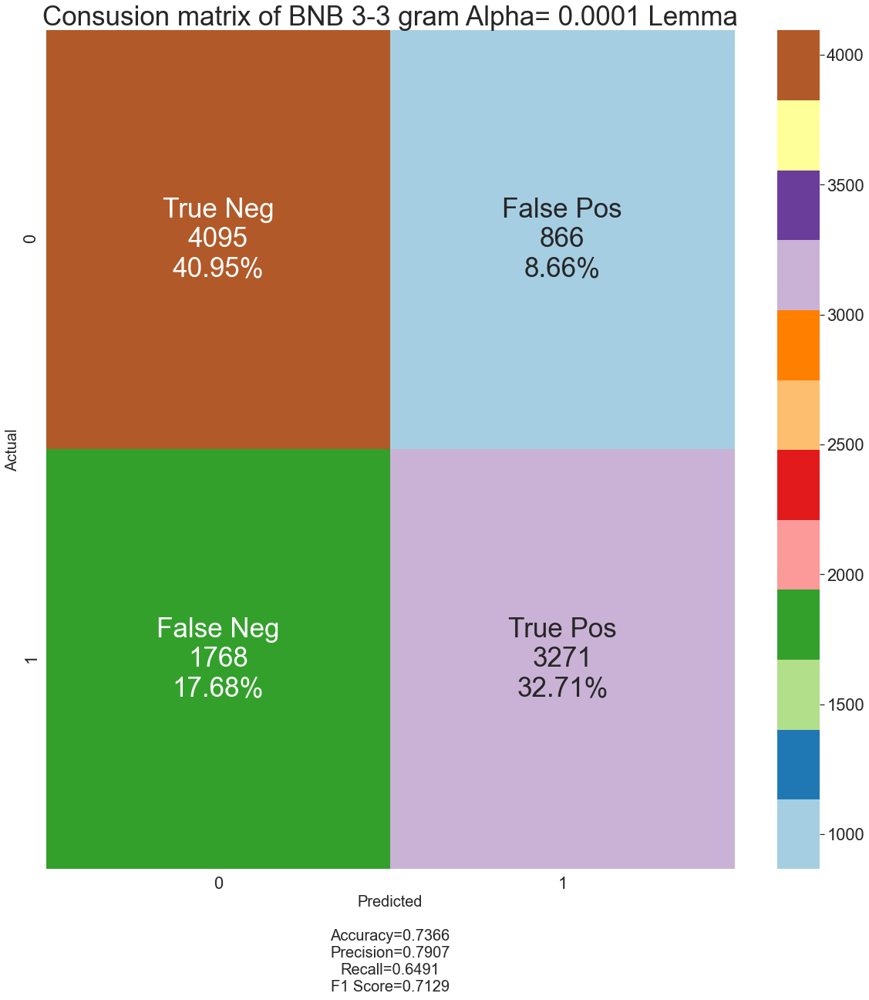

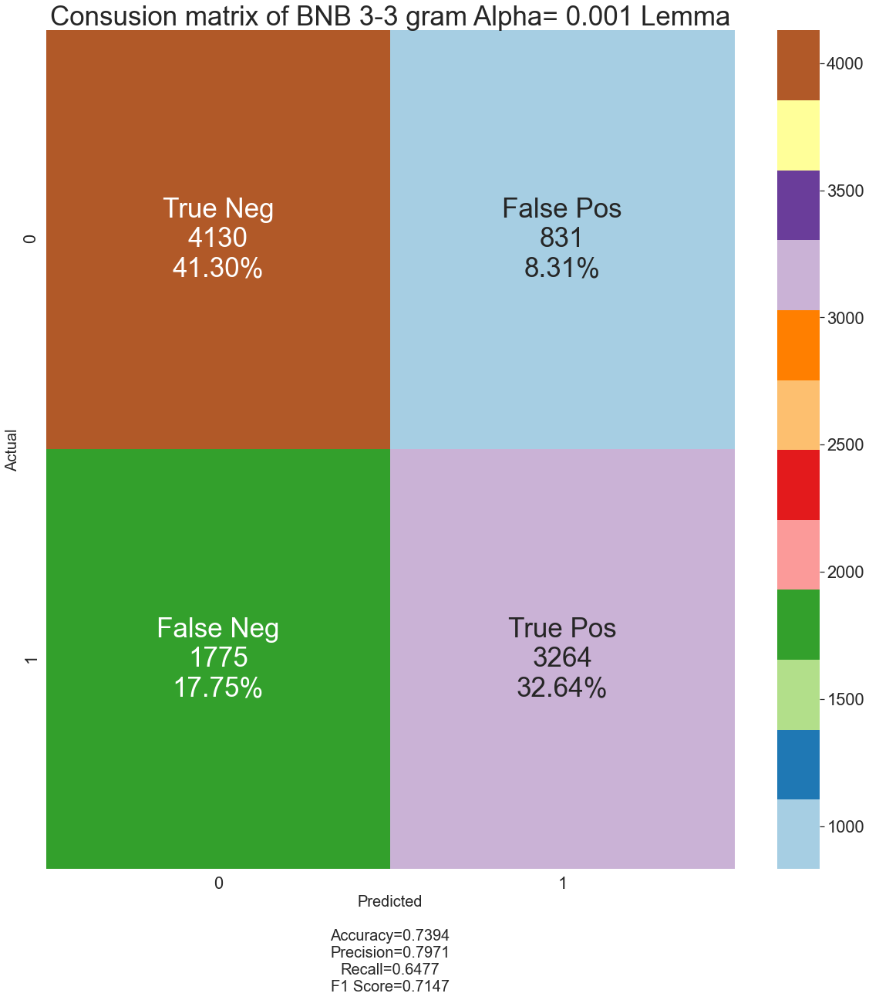

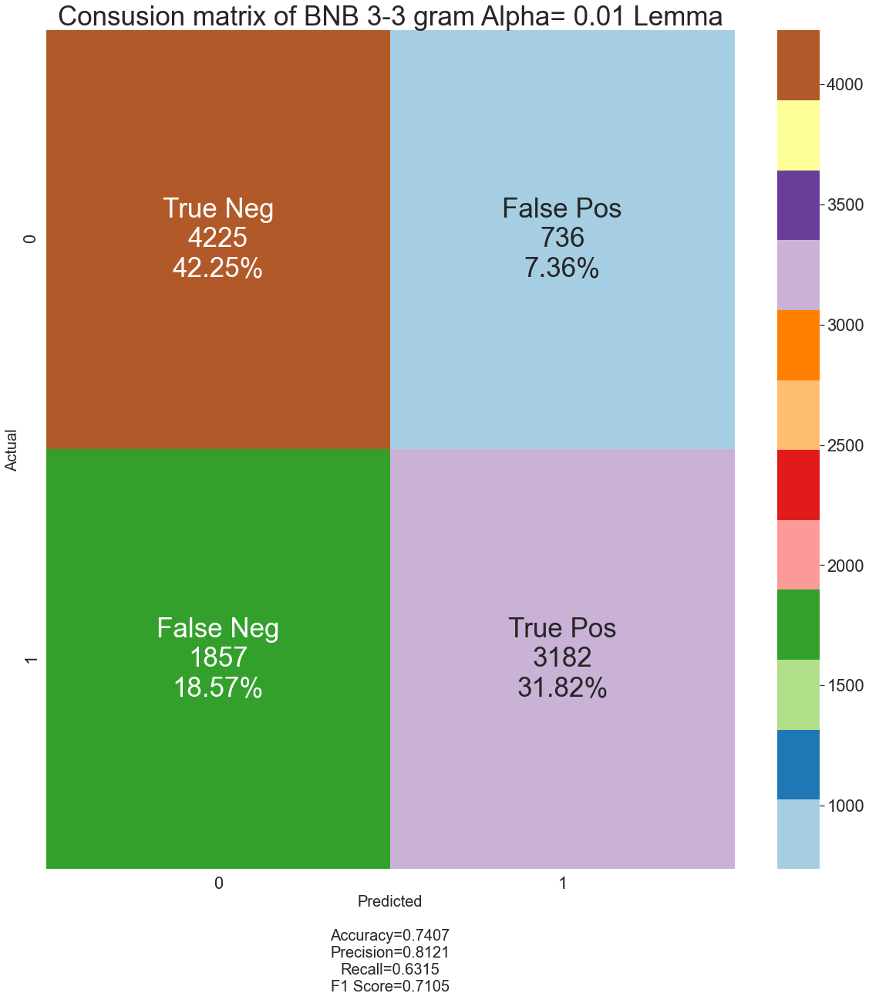

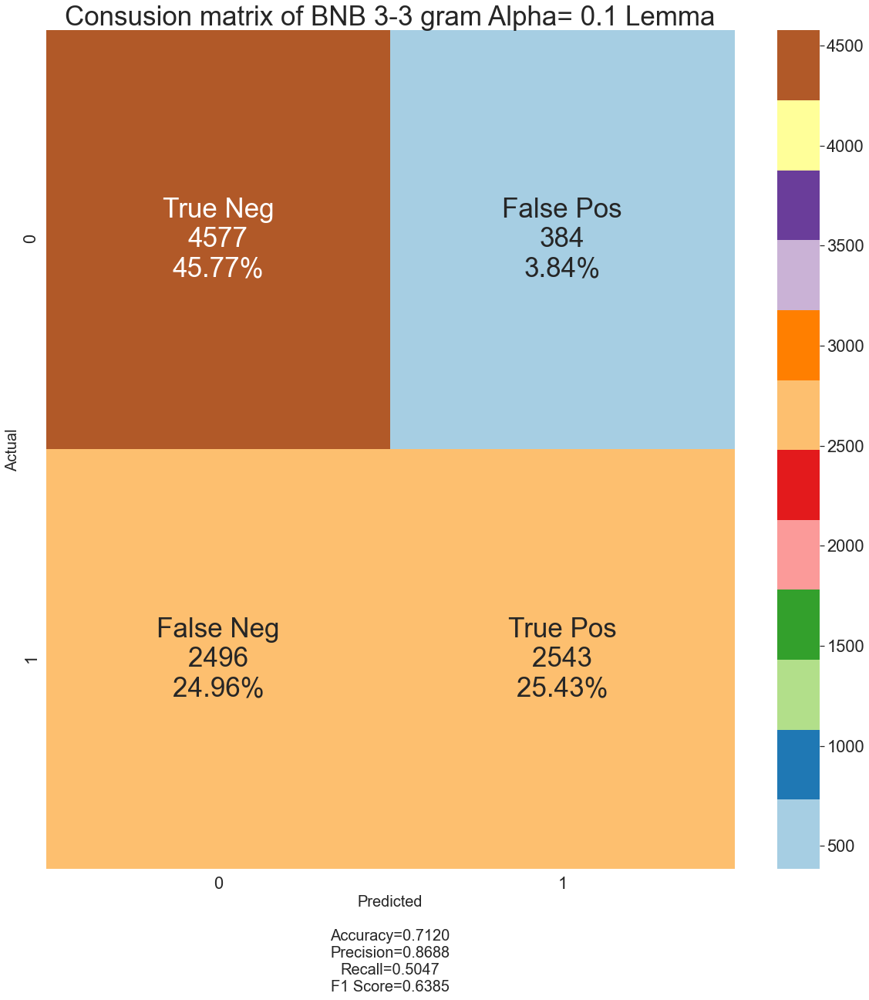

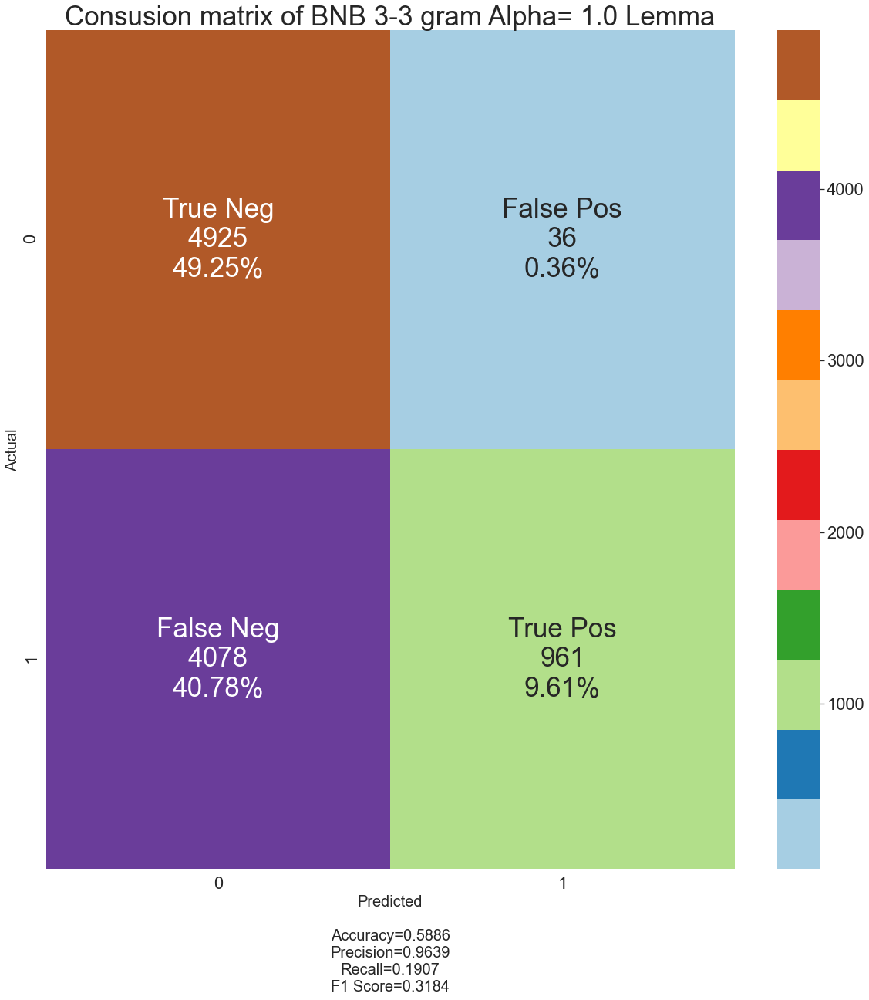

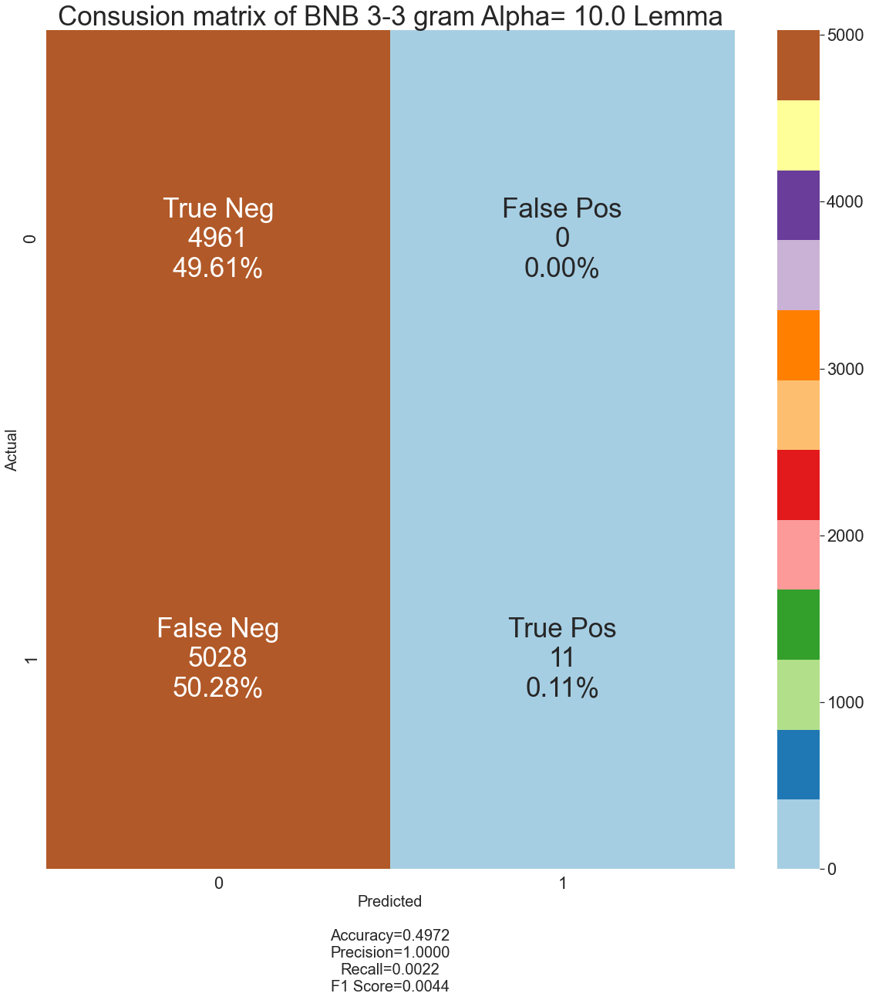

h:\projects\environment\tensorflow2.4\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-539-bc7732bd5ec7>:63: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP+FP)


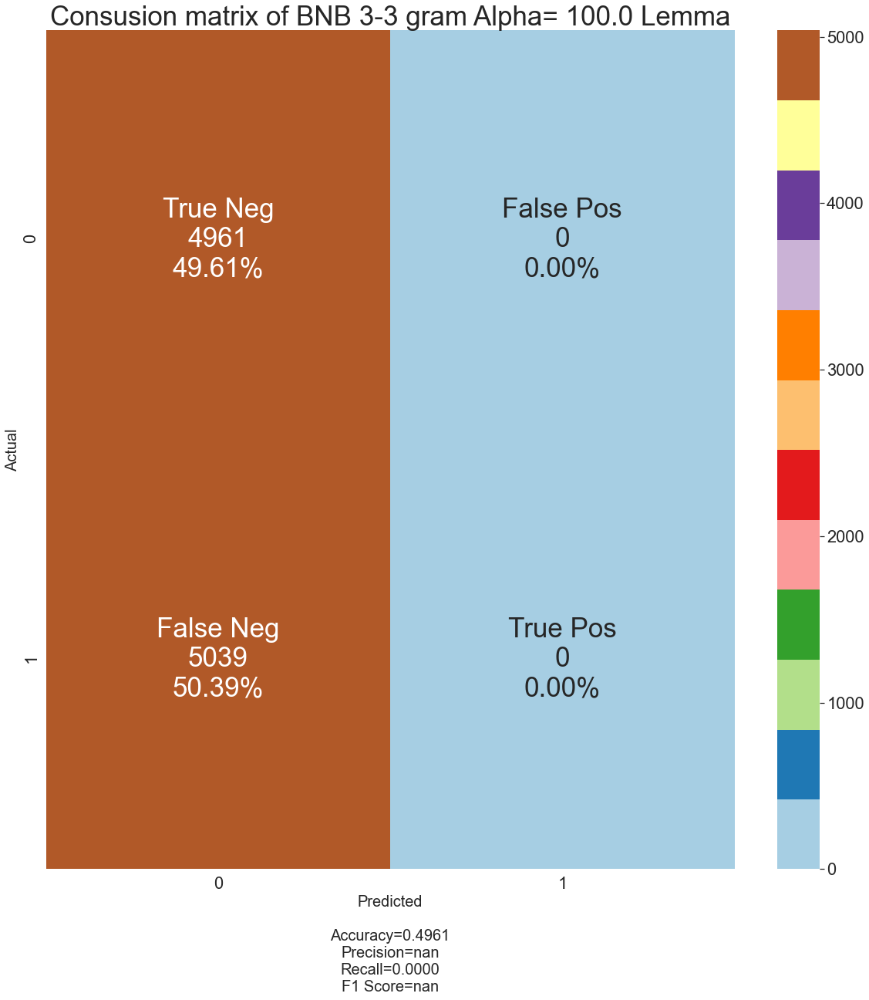

h:\projects\environment\tensorflow2.4\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-539-bc7732bd5ec7>:63: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP+FP)


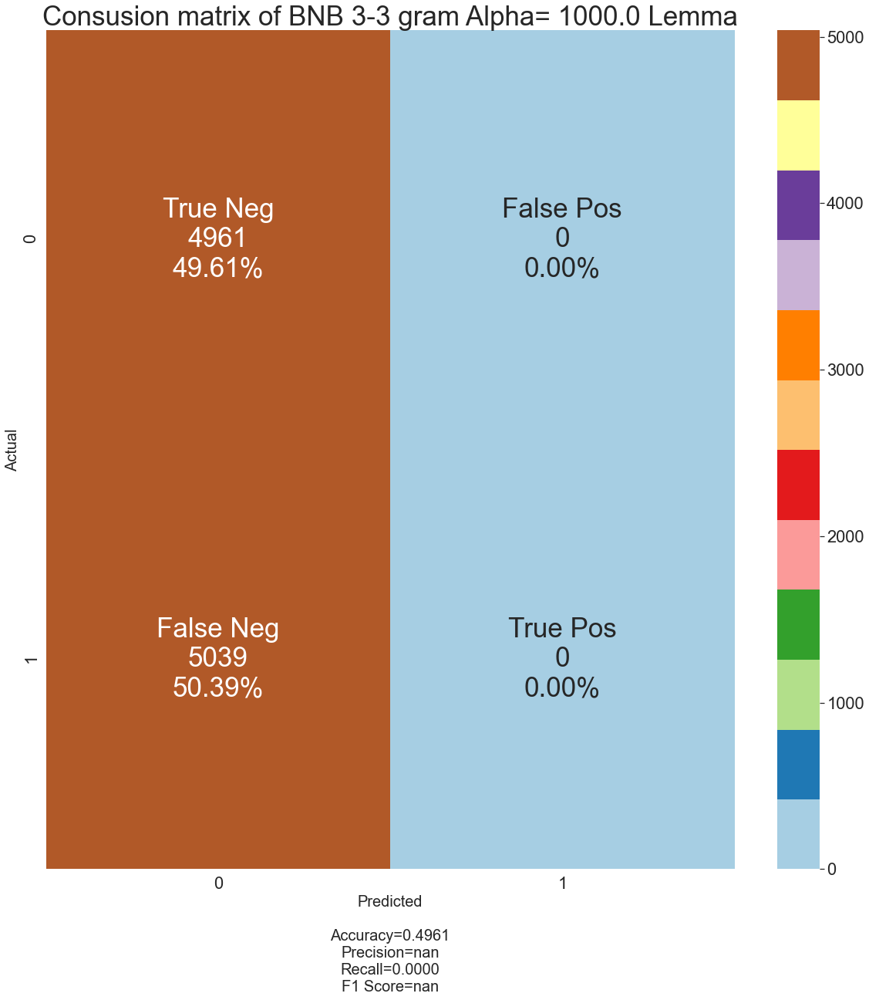

h:\projects\environment\tensorflow2.4\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-539-bc7732bd5ec7>:63: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP+FP)


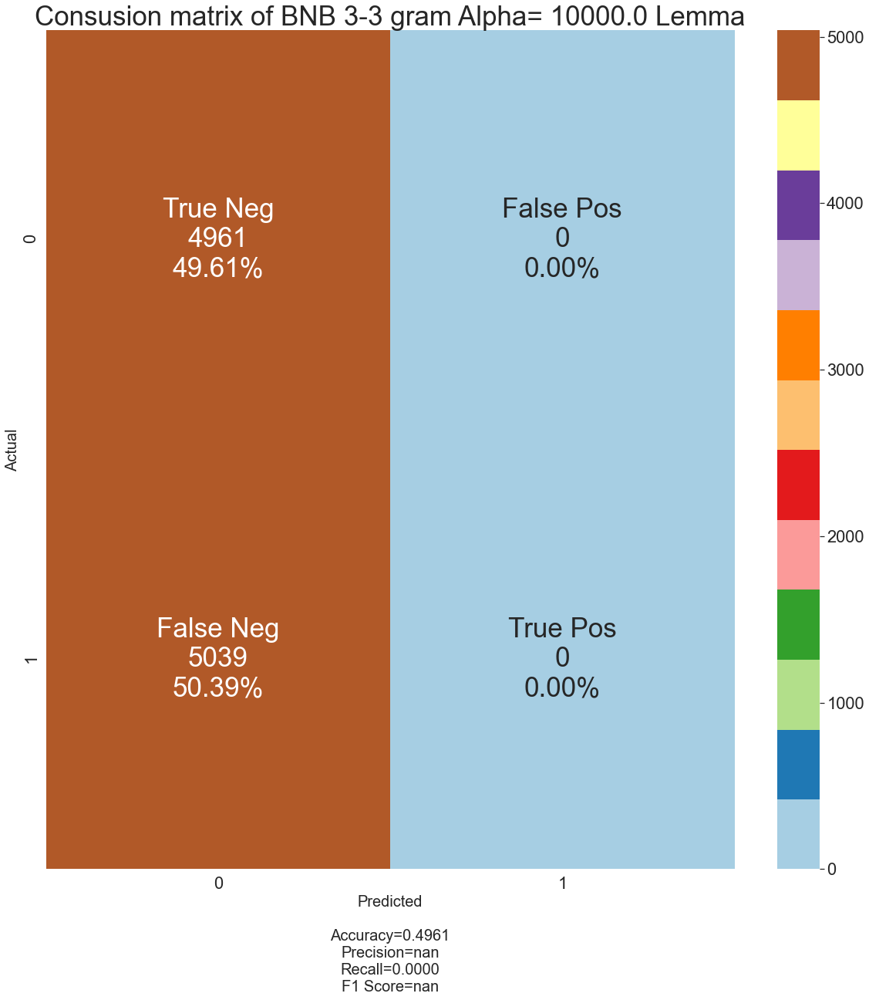

******************************
Finish BNB 3-3 grams
Wall time: 4min 1s


In [591]:
%%time
tuning(X_lm_train, X_lm_test, y_lm_train, y_lm_test, ["BNB"], ngrams, alphas, lemma=True)

** **
** **
## Gather stats from output in pandas df

In [5]:
def to_pandas(parent_folder, algorithm, lemma=False):
    
    # create an empty list to gather df
    df_list = []
    
    # choose directory based on lemma
    if lemma:
        p_folder = parent_folder[0]
    else:
        p_folder = parent_folder[1]
        
    # loop in algorithms
    
    for algo in algorithm:
        
        print("*"*30)
        print("Now in folder: {}.".format(algo))
        
        # get files in that algo folder
        file_dir = p_folder+ "/{}".format(algo)
        
        # get files
        all_files = glob.glob(file_dir+"/*.data")
        
        # convert data to df
        for file in all_files:
            
            # load dic file
            with open(file, "rb") as f:
                load_f = pickle.load(f)
            
            # convert to pandas df
            df = pd.DataFrame.from_dict([load_f])
            
            # append to df_list
            df_list.append(df)
    
    # concat all df
    result = pd.concat(df_list, ignore_index=True, sort=False)
    
    return result

* No Lemma

In [6]:
parent_folder = ["./export/data/Lemma", "./export/data/NoLemma"]

In [9]:
no_lemma_stat = to_pandas(parent_folder, algorithm, lemma=False)
no_lemma_stat

******************************
Now in folder: MNB.
******************************
Now in folder: CNB.
******************************
Now in folder: BNB.


,accuracy,precision,recall,f1,algorithm,lower,upper,alpha
0,0.8288,0.8445,0.8093,0.8265,MNB,1,1,0.00010
1,0.8346,0.8518,0.8133,0.8321,MNB,1,1,0.00100
2,0.8408,0.8606,0.8162,0.8378,MNB,1,1,0.01000
3,0.8468,0.8678,0.8210,0.8438,MNB,1,1,0.10000
4,0.8483,0.8725,0.8186,0.8447,MNB,1,1,1.00000
...,...,...,...,...,...,...,...,...
175,0.5545,0.9916,0.1169,0.2091,BNB,3,3,10.00000
176,0.4961,0.0000,0.0000,0.0000,BNB,3,3,100.00000
177,0.4961,0.0000,0.0000,0.0000,BNB,3,3,1000.00000
178,0.4961,0.0000,0.0000,0.0000,BNB,3,3,10000.00000


In [10]:
df1 = no_lemma_stat.sort_values('accuracy',ascending = False)
df1

,accuracy,precision,recall,f1,algorithm,lower,upper,alpha
44,0.9016,0.9139,0.8885,0.9010,MNB,2,3,1.0
104,0.9015,0.9137,0.8885,0.9009,CNB,2,3,1.0
103,0.8965,0.9049,0.8879,0.8963,CNB,2,3,0.1
43,0.8965,0.9049,0.8879,0.8963,MNB,2,3,0.1
83,0.8964,0.9072,0.8849,0.8959,CNB,1,3,0.1
...,...,...,...,...,...,...,...,...
148,0.4961,0.0000,0.0000,0.0000,BNB,1,3,10000.0
137,0.4961,0.0000,0.0000,0.0000,BNB,1,2,1000.0
158,0.4961,0.0000,0.0000,0.0000,BNB,2,2,10000.0
157,0.4961,0.0000,0.0000,0.0000,BNB,2,2,1000.0


* Lemma

In [11]:
lemma_stat = to_pandas(parent_folder, algorithm, lemma=True)
lemma_stat

******************************
Now in folder: MNB.
******************************
Now in folder: CNB.
******************************
Now in folder: BNB.


,accuracy,precision,recall,f1,algorithm,lower,upper,alpha
0,0.8325,0.8399,0.8248,0.8323,MNB,1,1,0.00010
1,0.8394,0.8475,0.8307,0.8390,MNB,1,1,0.00100
2,0.8483,0.8589,0.8363,0.8475,MNB,1,1,0.01000
3,0.8531,0.8658,0.8385,0.8519,MNB,1,1,0.10000
4,0.8561,0.8698,0.8402,0.8547,MNB,1,1,1.00000
...,...,...,...,...,...,...,...,...
175,0.4972,1.0000,0.0022,0.0044,BNB,3,3,10.00000
176,0.4961,0.0000,0.0000,0.0000,BNB,3,3,100.00000
177,0.4961,0.0000,0.0000,0.0000,BNB,3,3,1000.00000
178,0.4961,0.0000,0.0000,0.0000,BNB,3,3,10000.00000


In [12]:
df2 = lemma_stat.sort_values('accuracy',ascending = False)
df2

,accuracy,precision,recall,f1,algorithm,lower,upper,alpha
24,0.8778,0.8824,0.8740,0.8782,MNB,1,3,1.0
84,0.8778,0.8824,0.8740,0.8782,CNB,1,3,1.0
23,0.8769,0.8865,0.8666,0.8765,MNB,1,3,0.1
83,0.8769,0.8865,0.8666,0.8765,CNB,1,3,0.1
74,0.8759,0.8844,0.8670,0.8756,CNB,1,2,1.0
...,...,...,...,...,...,...,...,...
137,0.4961,0.0000,0.0000,0.0000,BNB,1,2,1000.0
128,0.4961,0.0000,0.0000,0.0000,BNB,1,1,10000.0
158,0.4961,0.0000,0.0000,0.0000,BNB,2,2,10000.0
157,0.4961,0.0000,0.0000,0.0000,BNB,2,2,1000.0
